In [1]:
from google.colab import files

In [2]:
upload = files.upload()

Saving lanes_clip20.mp4 to lanes_clip20.mp4


In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
from torch.utils.data import Dataset

# Smoothing parameters
left_lane_avg = None
right_lane_avg = None
alpha = 0.2  # Smoothing factor

In [4]:
# Vision Transformer (simplified for patch-based lane detection)
class SimpleViT(nn.Module):
    def __init__(self, image_size=224, patch_size=16, dim=256, depth=4, heads=4, mlp_dim=512):
        super(SimpleViT, self).__init__()
        assert image_size % patch_size == 0
        num_patches = (image_size // patch_size) ** 2
        patch_dim = patch_size * patch_size * 3

        self.patch_embedding = nn.Linear(patch_dim, dim)
        self.pos_embedding = nn.Parameter(torch.randn(1, num_patches, dim))
        self.cls_token = nn.Parameter(torch.randn(1, 1, dim))

        encoder_layer = nn.TransformerEncoderLayer(d_model=dim, nhead=heads, dim_feedforward=mlp_dim)
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=depth)

        self.to_output = nn.Sequential(
            nn.LayerNorm(dim),
            nn.Linear(dim, 1)  # Binary lane prediction
        )

    def forward(self, x):
        B, C, H, W = x.shape
        patch_size = int(np.sqrt(x.shape[2] * x.shape[3] // ((H // 16) * (W // 16))))
        x = x.unfold(2, patch_size, patch_size).unfold(3, patch_size, patch_size)
        x = x.contiguous().view(B, -1, patch_size * patch_size * C)

        tokens = self.patch_embedding(x)
        tokens += self.pos_embedding[:, :tokens.size(1), :]
        tokens = torch.cat((self.cls_token.repeat(B, 1, 1), tokens), dim=1)

        x = self.transformer(tokens)
        out = self.to_output(x[:, 0])
        return out

# Lightweight SegNet (3-layer encoder-decoder for segmentation)
class SimpleSegNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1):
        super(SimpleSegNet, self).__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 32, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(32, 64, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(64, 128, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, 2, stride=2), nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 2, stride=2), nn.ReLU(),
            nn.ConvTranspose2d(32, out_channels, 2, stride=2), nn.Sigmoid()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded


In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Parameters for lane smoothing
left_lane_avg = None
right_lane_avg = None
alpha = 0.2  # Smoothing factor (higher means more stable but slower updates)

def show_image(image, title="Image", cmap_type="gray"):
    """Displays an image in a matplotlib window."""
    plt.figure(figsize=(6, 6))
    if len(image.shape) == 3:
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    else:
        plt.imshow(image, cmap=cmap_type)
    plt.title(title)
    plt.axis("off")
    plt.show()

def canny_edge_detection(frame):
    """Applies Canny Edge Detection to find edges in the frame."""
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    show_image(gray, "Grayscale Image")

    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    show_image(blur, "Blurred Image")

    edges = cv2.Canny(blur, 50, 150)
    show_image(edges, "Edge Detection")

    return edges

def region_of_interest(edges):
    """Applies a mask to keep only the region of interest."""
    height, width = edges.shape
    mask = np.zeros_like(edges)

    region = np.array([[
        (int(width * 0.1), height),  # Bottom-left
        (int(width * 0.9), height),  # Bottom-right
        (int(width * 0.6), int(height * 0.55)),  # Top-right
        (int(width * 0.4), int(height * 0.55))   # Top-left
    ]], np.int32)

    cv2.fillPoly(mask, region, 255)
    masked_edges = cv2.bitwise_and(edges, mask)
    show_image(masked_edges, "Region of Interest (Masked)")

    return masked_edges, region

def process_frame(frame):
    """Processes each frame for lane detection with visualization."""
    edges = canny_edge_detection(frame)
    masked_edges, _ = region_of_interest(edges)
    # Hough Transform removed from here
    return masked_edges  # Return processed edge mask for further use

In [6]:
# Global smoothing
left_lane_avg, right_lane_avg = None, None
alpha = 0.2

# Transform for both models
transform_input = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# Instantiate models
vit_model = SimpleViT()
segnet_model = SimpleSegNet()
vit_model.eval()
segnet_model.eval()


/usr/local/lib/python3.11/dist-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


SimpleSegNet(
  (encoder): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU()
    (8): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (decoder): Sequential(
    (0): ConvTranspose2d(128, 64, kernel_size=(2, 2), stride=(2, 2))
    (1): ReLU()
    (2): ConvTranspose2d(64, 32, kernel_size=(2, 2), stride=(2, 2))
    (3): ReLU()
    (4): ConvTranspose2d(32, 1, kernel_size=(2, 2), stride=(2, 2))
    (5): Sigmoid()
  )
)

In [7]:

import cv2
import numpy as np
import torch

# Assuming these globals and functions are defined elsewhere:
# left_lane_avg, right_lane_avg, alpha, vit_model, segnet_model, transform_input, canny_edge_detection, region_of_interest

def hybrid_lane_detection(frame):
    global left_lane_avg, right_lane_avg

    original = frame.copy()
    edges = canny_edge_detection(frame)
    roi_edges, _ = region_of_interest(edges)

    # --- Hough Transform with clean overlay ---
    lines = cv2.HoughLinesP(roi_edges, 1, np.pi / 180, 50, minLineLength=50, maxLineGap=40)
    hough_overlay = np.zeros_like(frame)
    road_mask = np.zeros_like(frame)

    left_lines = []
    right_lines = []

    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            slope = (y2 - y1) / (x2 - x1 + 1e-6)
            if abs(slope) < 0.5:
                continue  # filter out nearly flat lines

            if slope < 0:
                left_lines.extend([(x1, y1), (x2, y2)])
            else:
                right_lines.extend([(x1, y1), (x2, y2)])
            cv2.line(hough_overlay, (x1, y1), (x2, y2), (255, 0, 0), 4)  # Blue lines for Hough

    if left_lines and right_lines:
        left_lane = np.polyfit([p[0] for p in left_lines], [p[1] for p in left_lines], 1)
        right_lane = np.polyfit([p[0] for p in right_lines], [p[1] for p in right_lines], 1)

        left_lane_avg = left_lane if left_lane_avg is None else alpha * left_lane + (1 - alpha) * left_lane_avg
        right_lane_avg = right_lane if right_lane_avg is None else alpha * right_lane + (1 - alpha) * right_lane_avg

        y_bottom = frame.shape[0]
        y_top = int(y_bottom * 0.55)
        x_left_bottom = int((y_bottom - left_lane_avg[1]) / left_lane_avg[0])
        x_left_top = int((y_top - left_lane_avg[1]) / left_lane_avg[0])
        x_right_bottom = int((y_bottom - right_lane_avg[1]) / right_lane_avg[0])
        x_right_top = int((y_top - right_lane_avg[1]) / right_lane_avg[0])

        road_region = np.array([[
            (x_left_bottom, y_bottom),
            (x_right_bottom, y_bottom),
            (x_right_top, y_top),
            (x_left_top, y_top)
        ]], np.int32)
        cv2.fillPoly(road_mask, road_region, (0, 255, 0))  # Green mask for road region

    # --- ViT Score ---
    vit_input = transform_input(frame).unsqueeze(0)
    with torch.no_grad():
        vit_output = vit_model(vit_input)
    vit_score = torch.sigmoid(vit_output).item()

    # --- SegNet Segmentation Mask ---
    seg_input = transform_input(frame).unsqueeze(0)
    with torch.no_grad():
        seg_mask = segnet_model(seg_input)[0][0].cpu().numpy()
    seg_mask = cv2.resize(seg_mask, (frame.shape[1], frame.shape[0]))

    # Threshold segmentation mask with higher threshold to reduce noise
    seg_mask = (seg_mask > 0.7).astype(np.uint8) * 255

    # Morphological filtering to clean mask
    kernel = np.ones((5, 5), np.uint8)
    seg_mask = cv2.morphologyEx(seg_mask, cv2.MORPH_OPEN, kernel)
    seg_mask = cv2.morphologyEx(seg_mask, cv2.MORPH_CLOSE, kernel)

    # Create a colored mask (green channel) instead of white
    colored_mask = np.zeros_like(frame)
    colored_mask[:, :, 1] = seg_mask  # Green channel

    # --- Final Clean Combination ---
    hybrid_result = original.copy()
    hybrid_result = cv2.addWeighted(hybrid_result, 1.0, hough_overlay, 0.6, 0)
    hybrid_result = cv2.addWeighted(hybrid_result, 1.0, colored_mask, 0.15, 0)  # Lower opacity for seg mask
    hybrid_result = cv2.addWeighted(hybrid_result, 1.0, road_mask, 0.4, 0)

    return hybrid_result, vit_score











Processing Frame 0


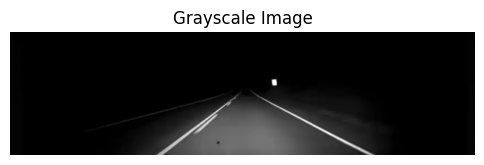

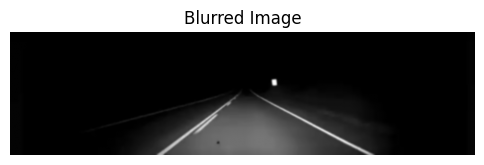

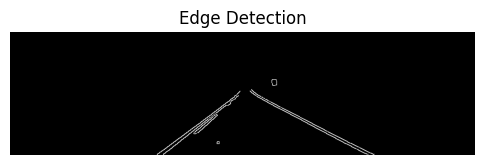

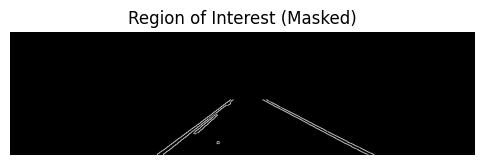

Processing Frame 1


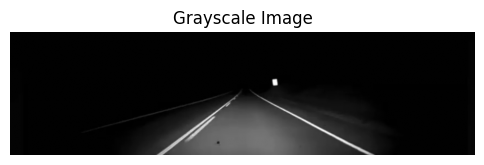

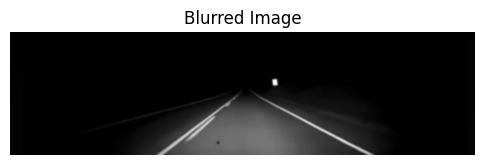

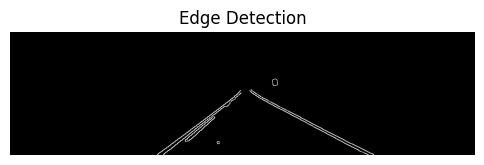

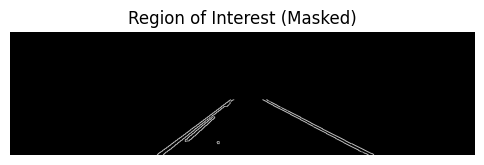

Processing Frame 2


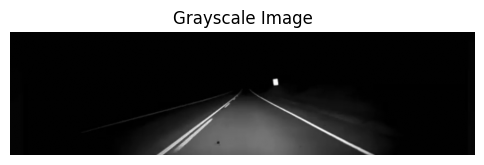

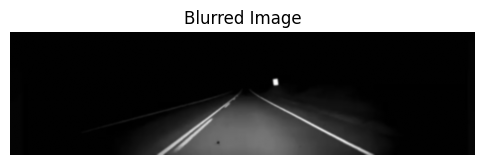

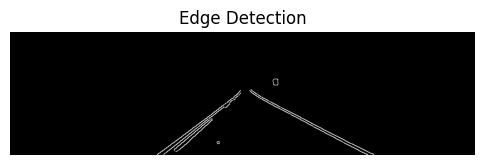

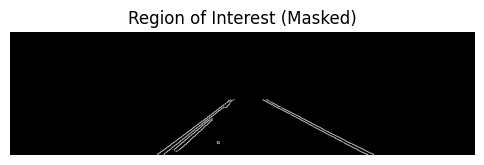

Processing Frame 3


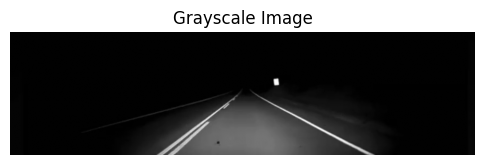

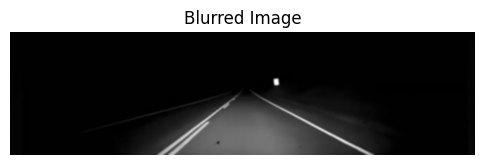

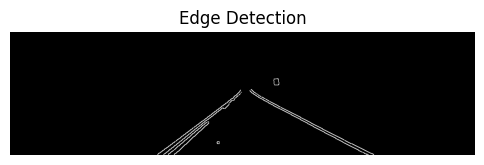

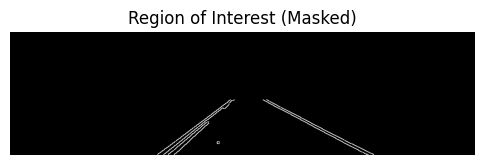

Processing Frame 4


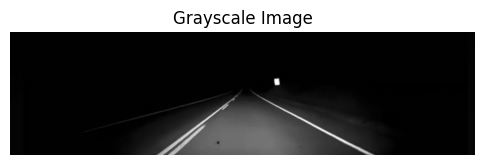

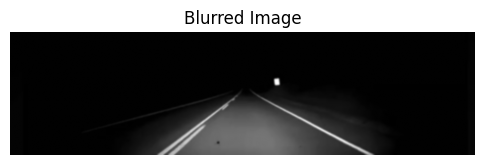

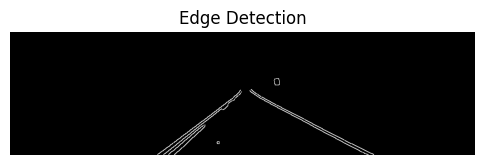

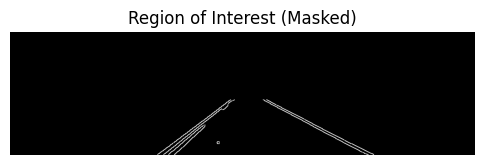

Processing Frame 5


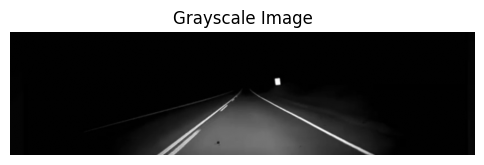

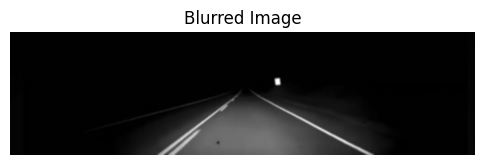

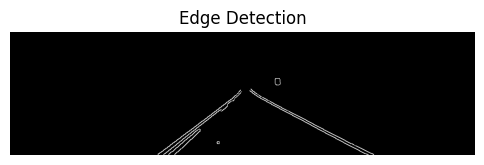

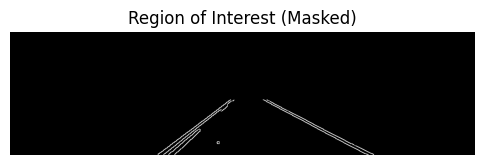

Processing Frame 6


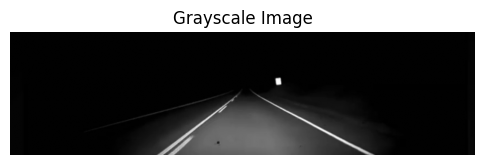

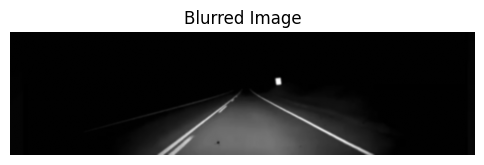

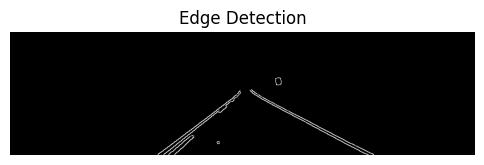

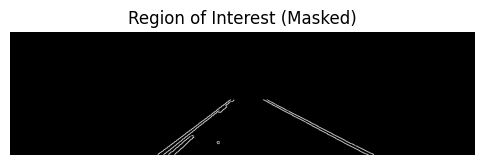

Processing Frame 7


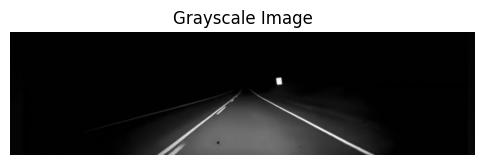

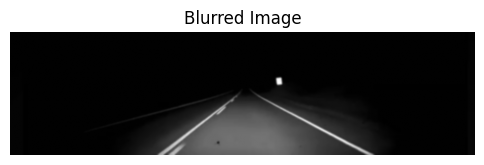

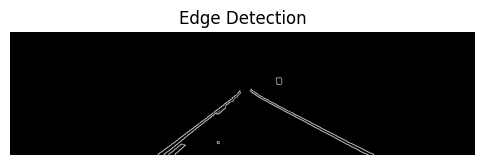

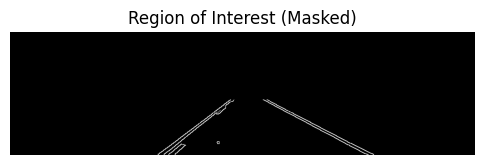

Processing Frame 8


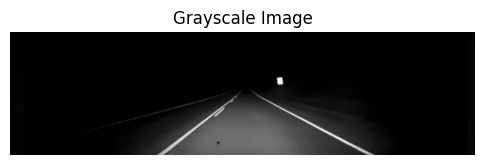

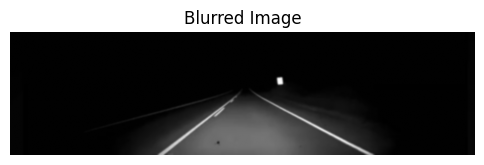

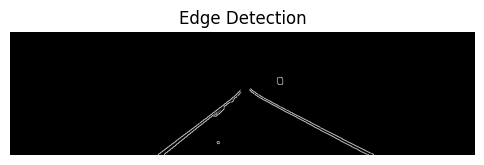

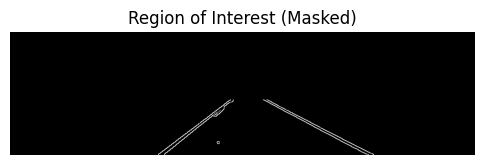

Processing Frame 9


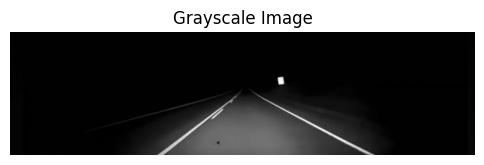

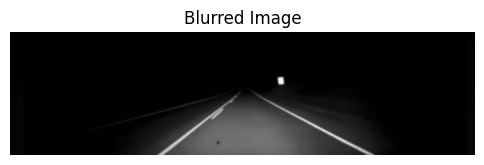

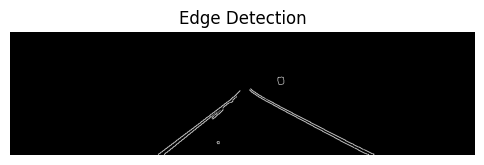

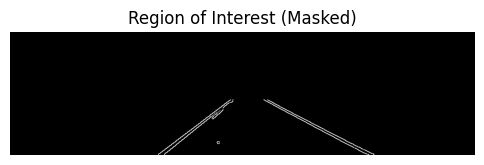

Processing Frame 10


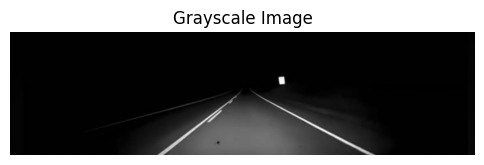

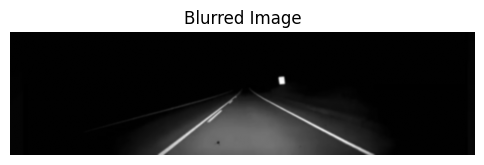

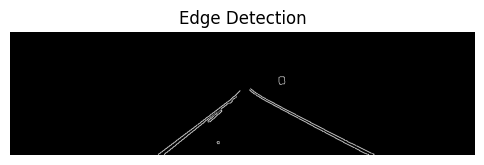

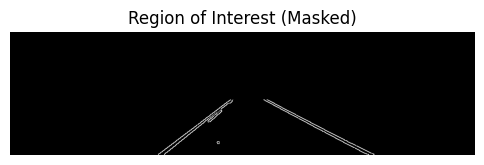

Processing Frame 11


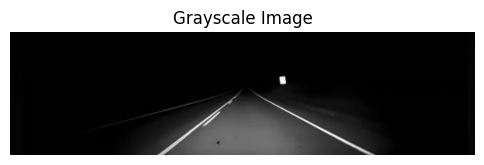

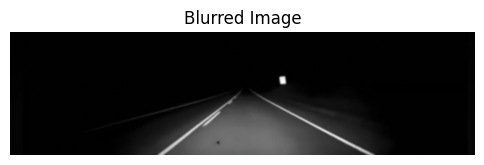

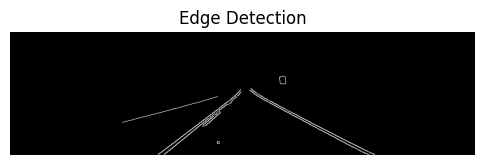

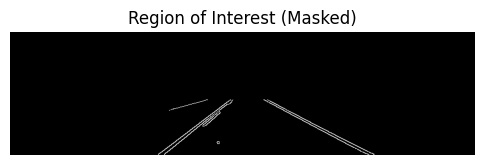

Processing Frame 12


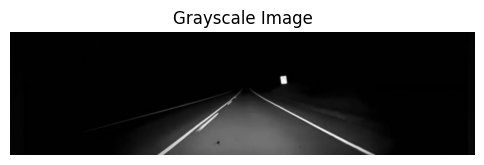

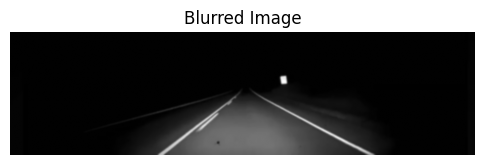

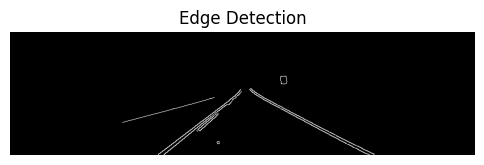

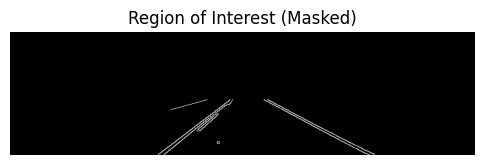

Processing Frame 13


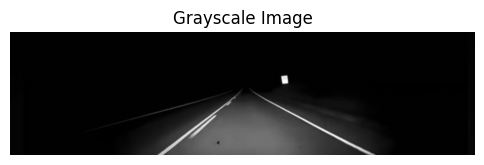

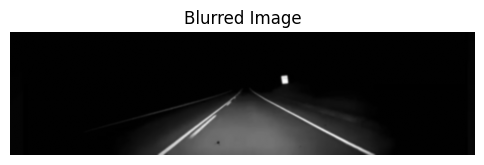

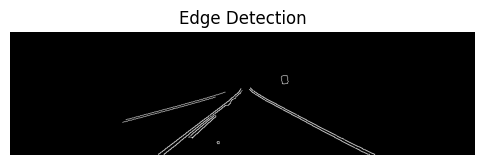

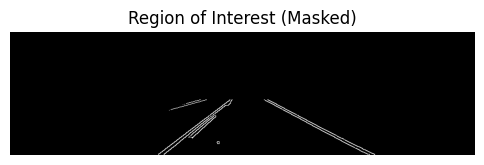

Processing Frame 14


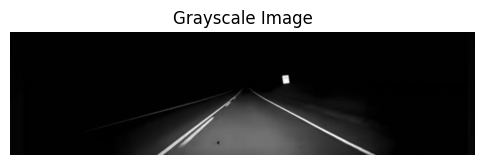

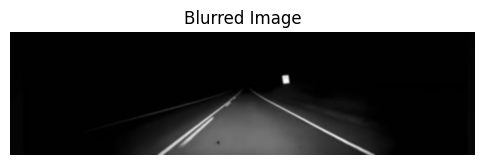

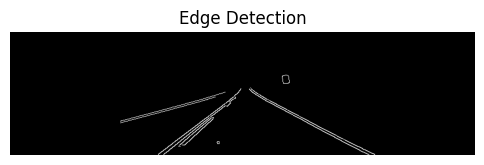

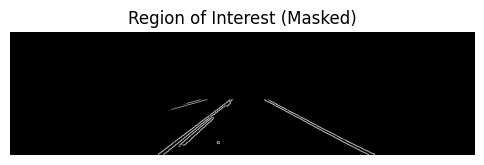

Processing Frame 15


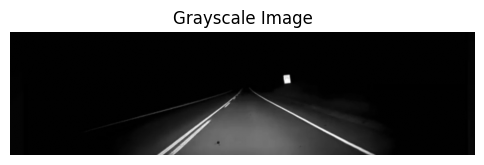

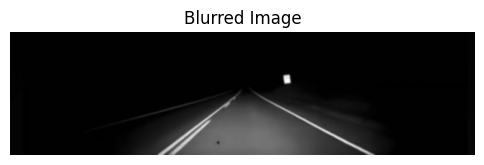

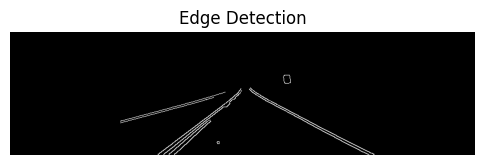

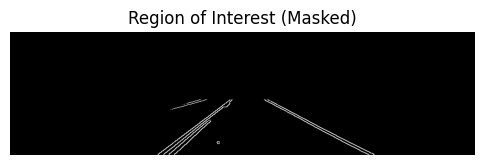

Processing Frame 16


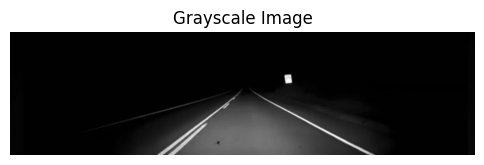

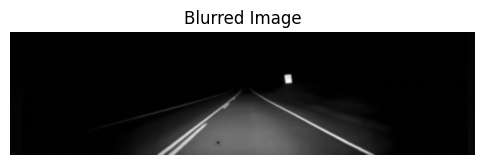

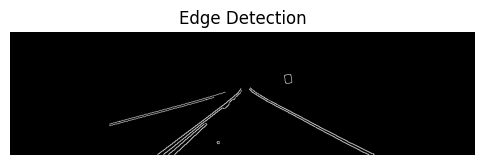

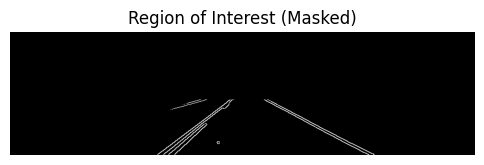

Processing Frame 17


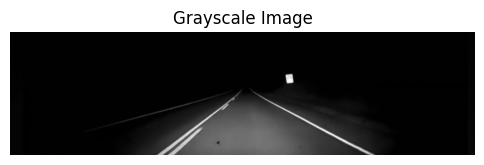

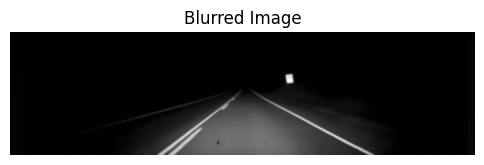

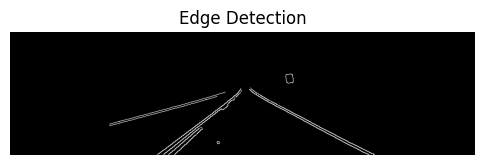

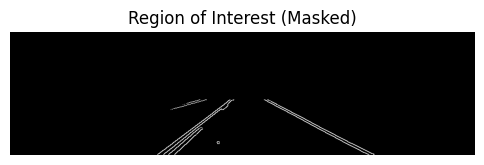

Processing Frame 18


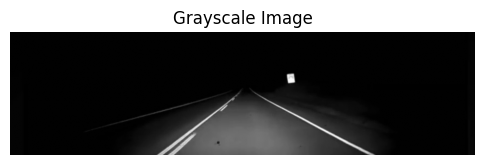

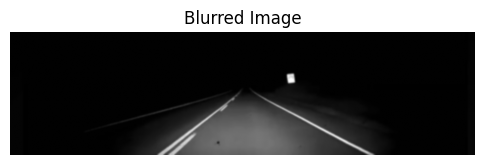

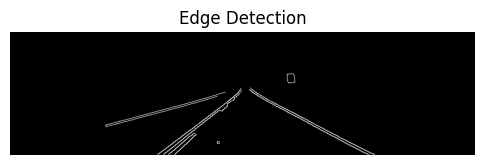

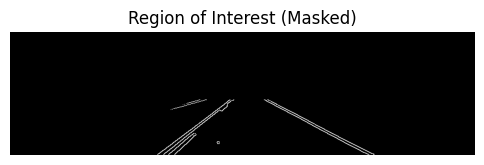

Processing Frame 19


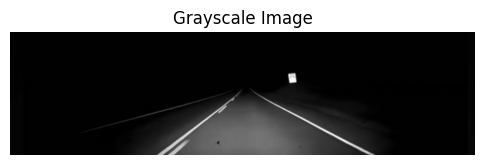

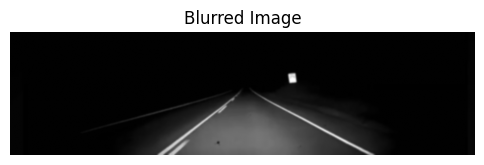

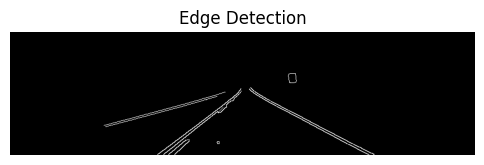

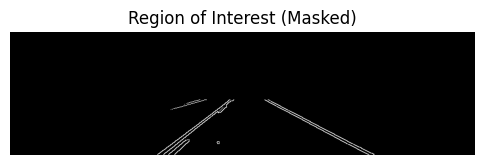

Processing Frame 20


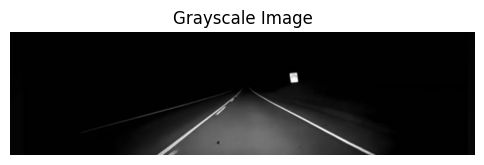

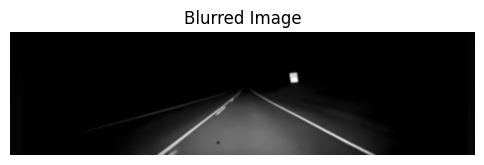

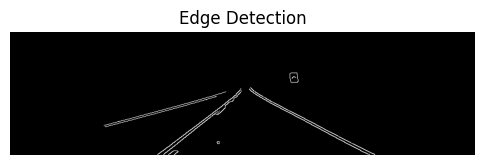

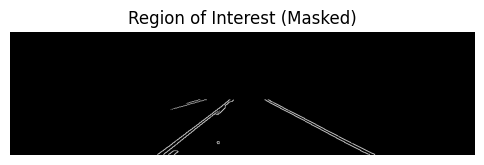

Processing Frame 21


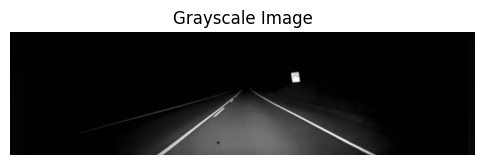

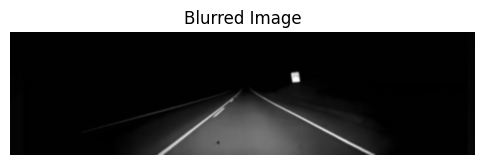

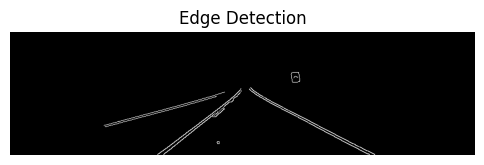

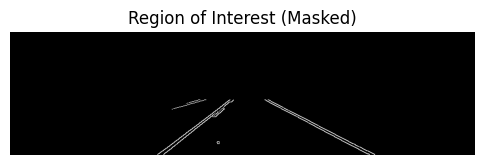

Processing Frame 22


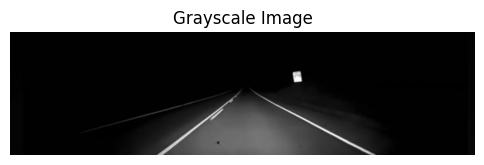

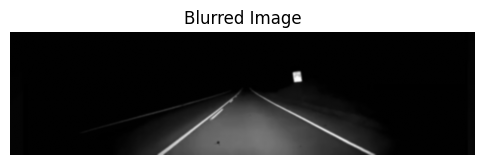

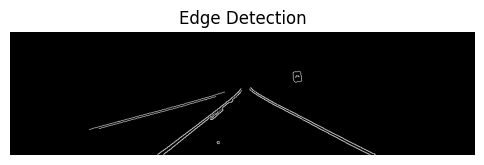

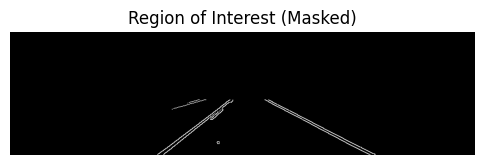

Processing Frame 23


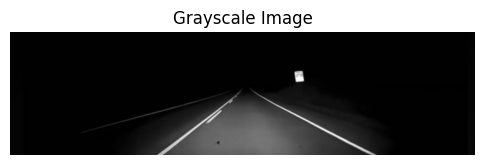

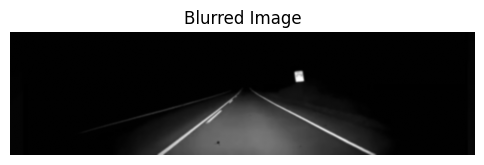

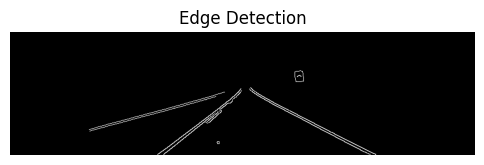

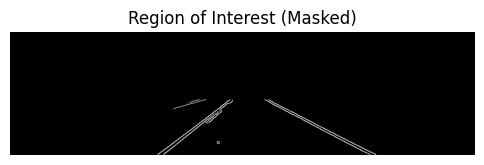

Processing Frame 24


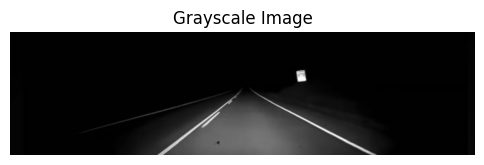

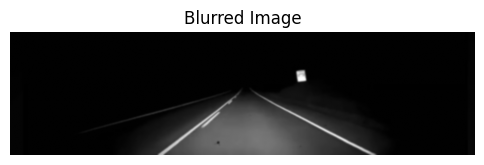

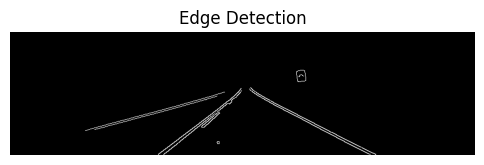

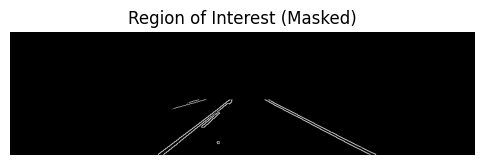

Processing Frame 25


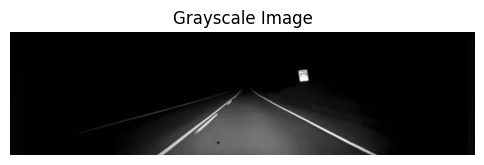

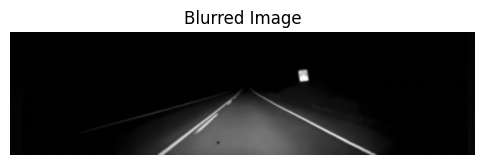

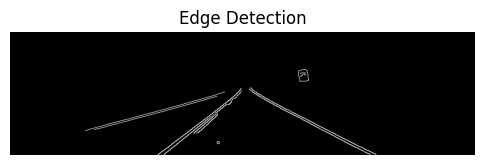

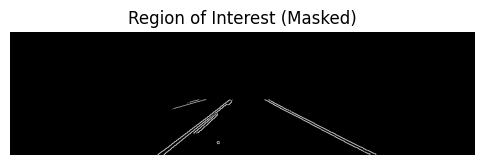

Processing Frame 26


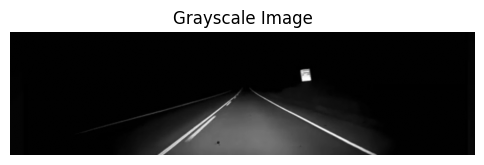

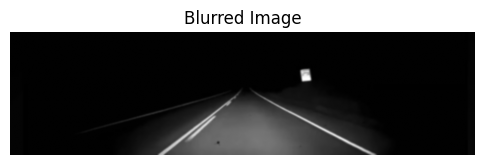

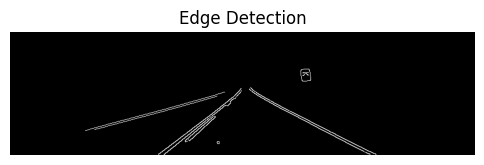

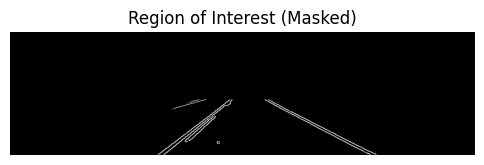

Processing Frame 27


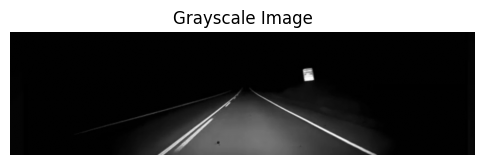

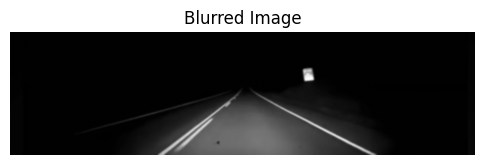

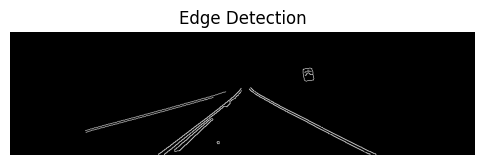

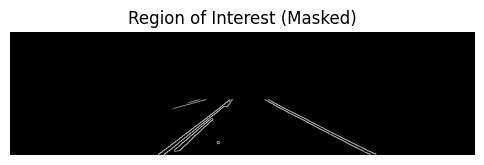

Processing Frame 28


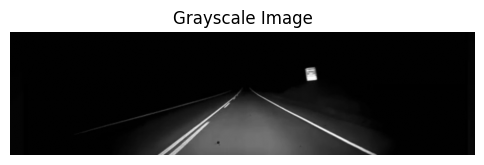

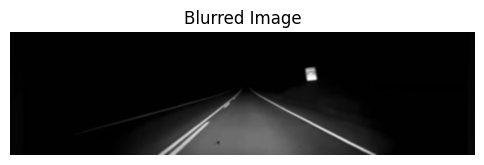

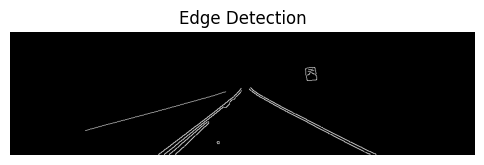

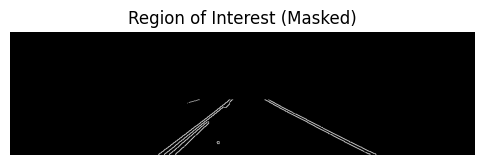

Processing Frame 29


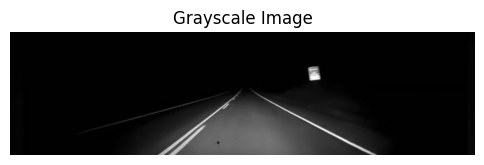

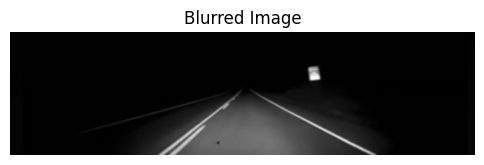

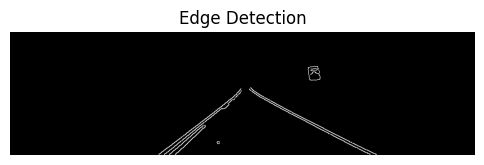

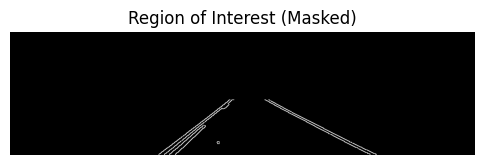

Processing Frame 30


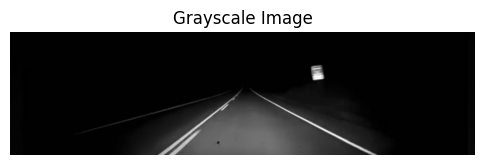

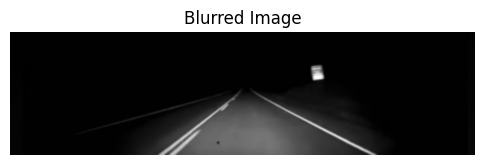

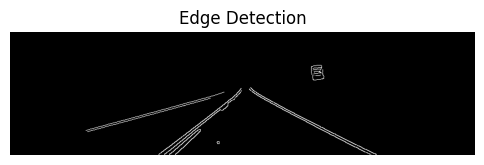

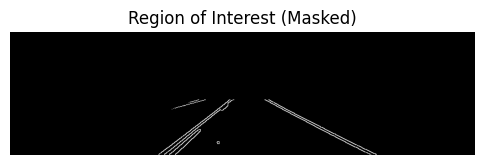

Processing Frame 31


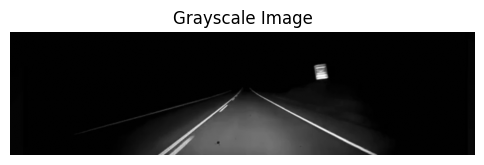

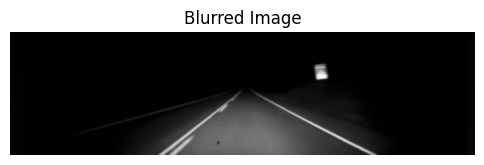

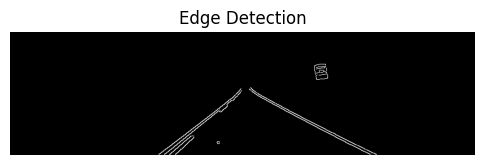

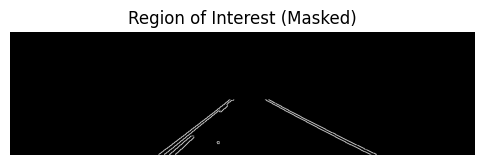

Processing Frame 32


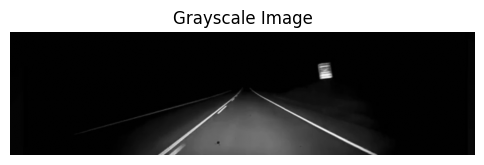

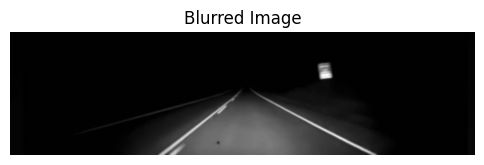

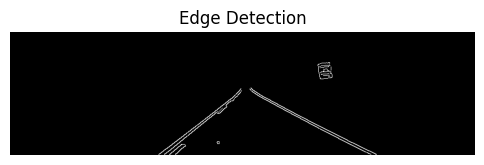

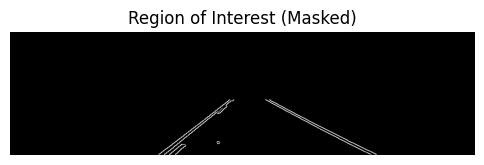

Processing Frame 33


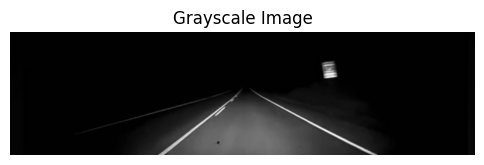

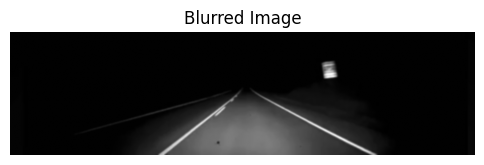

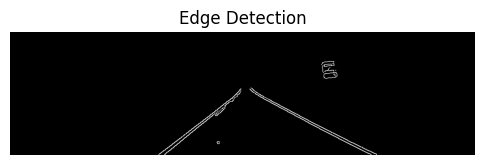

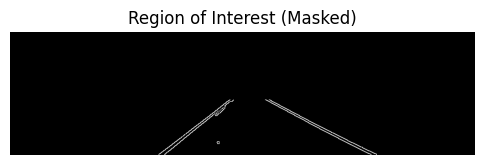

Processing Frame 34


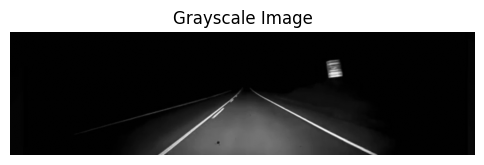

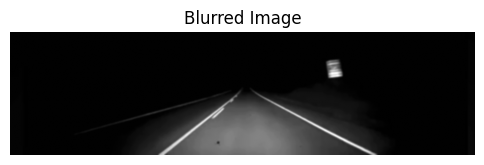

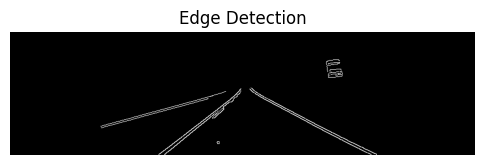

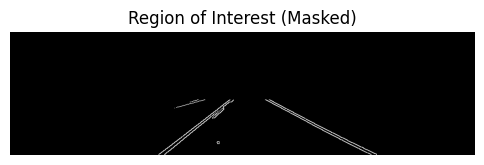

Processing Frame 35


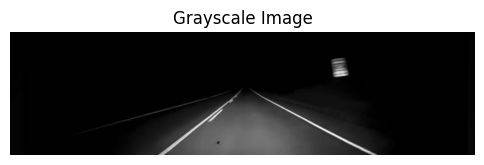

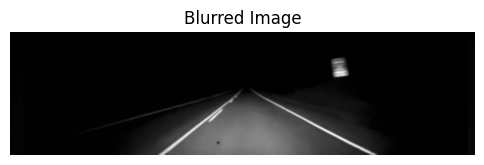

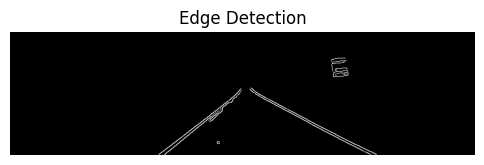

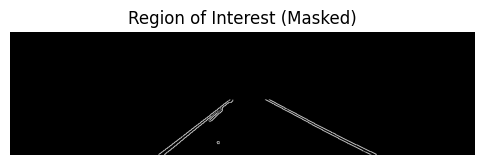

Processing Frame 36


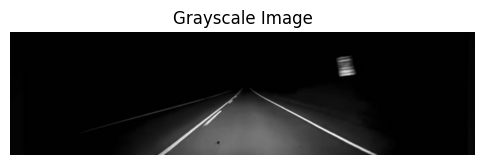

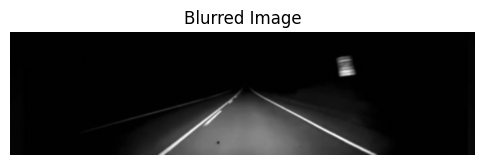

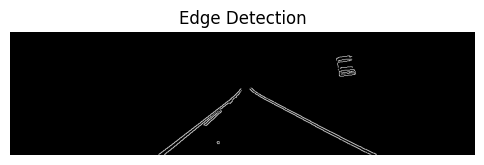

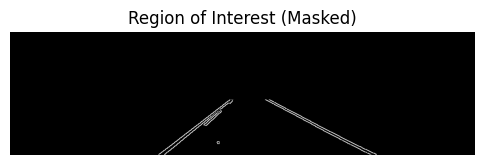

Processing Frame 37


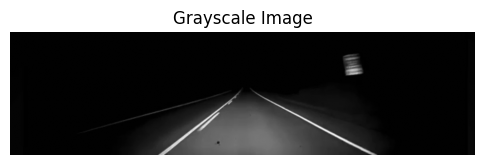

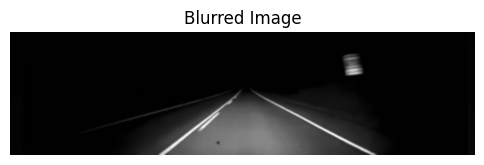

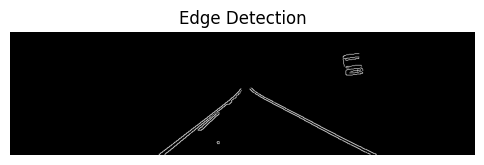

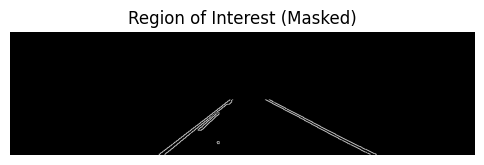

Processing Frame 38


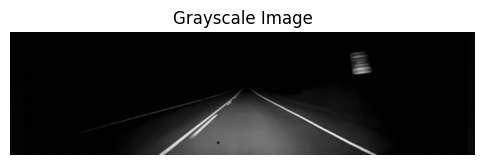

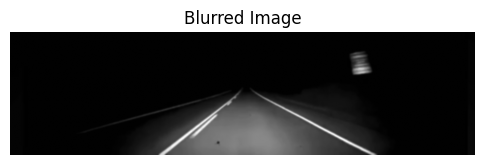

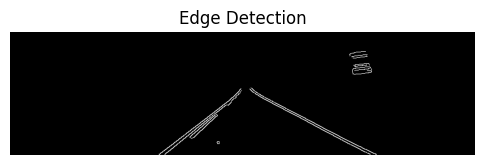

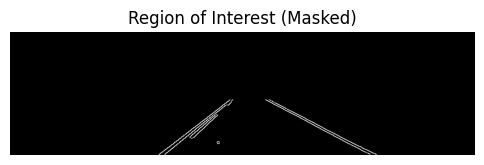

Processing Frame 39


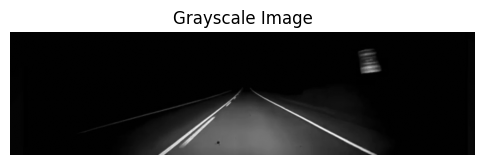

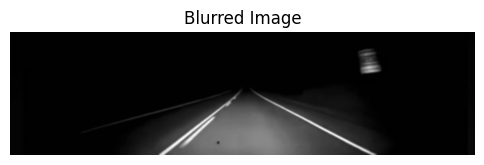

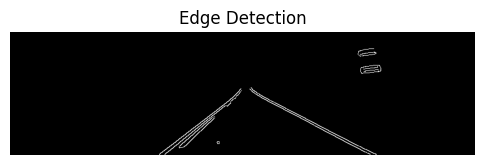

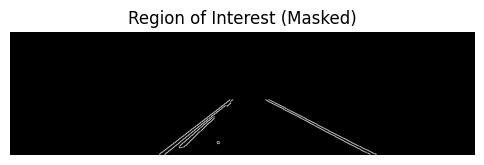

Processing Frame 40


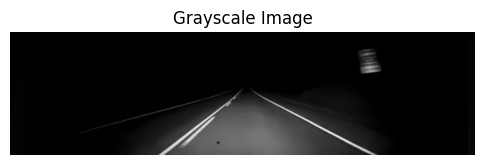

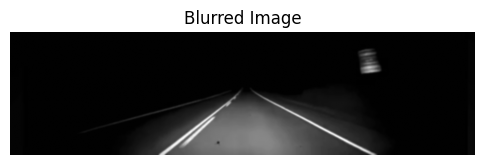

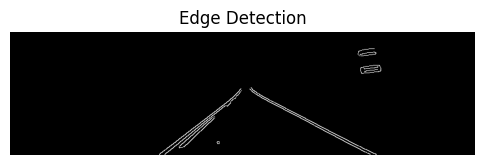

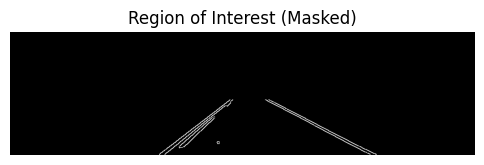

Processing Frame 41


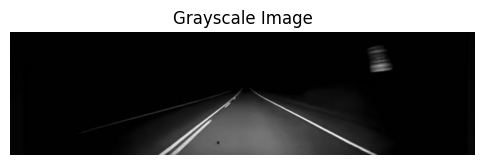

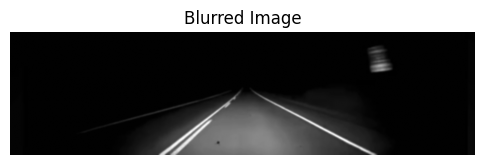

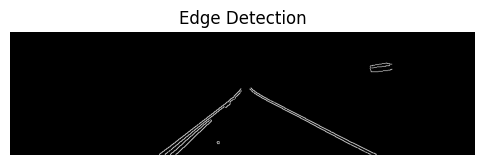

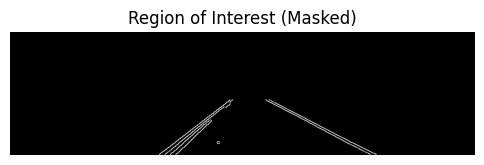

Processing Frame 42


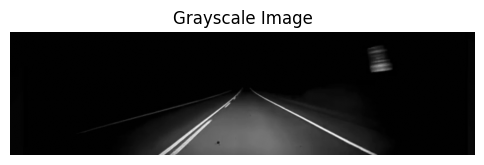

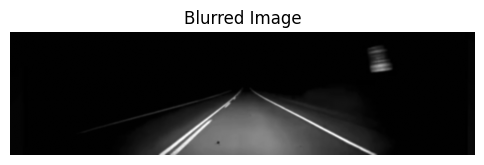

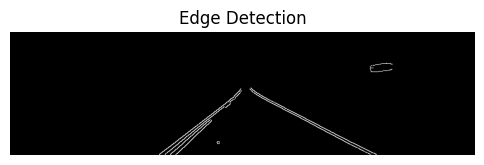

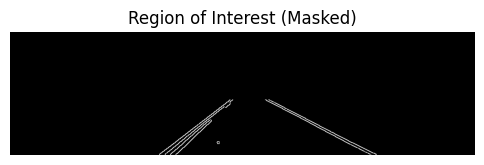

Processing Frame 43


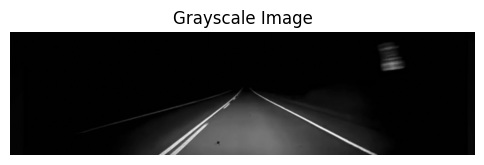

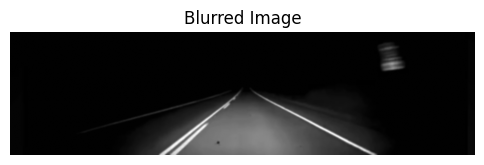

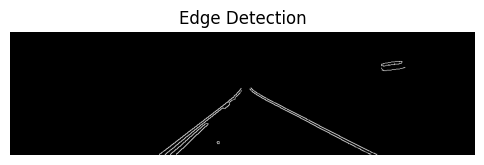

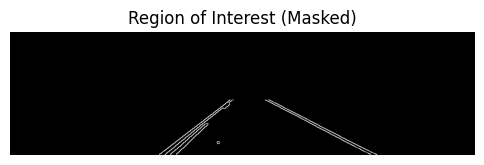

Processing Frame 44


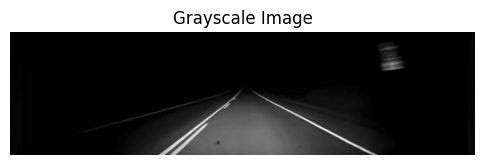

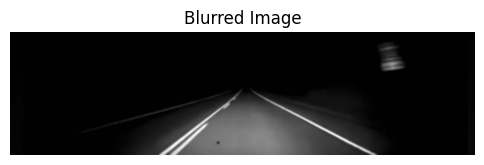

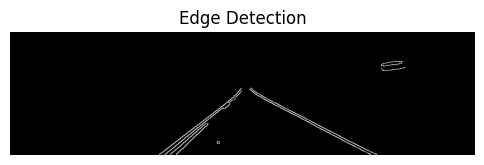

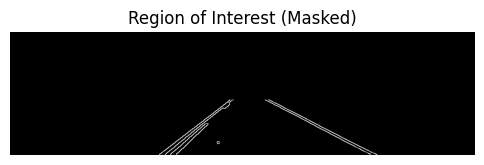

Processing Frame 45


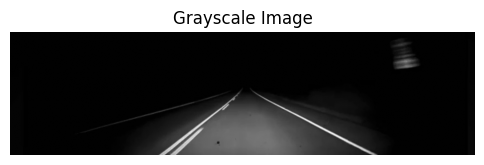

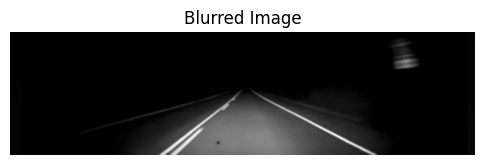

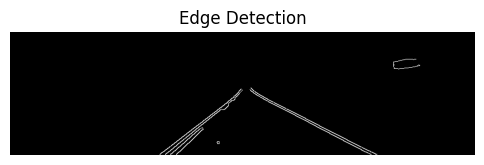

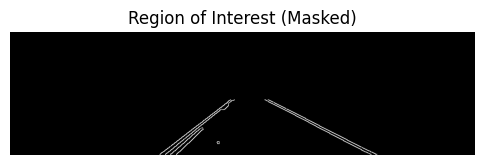

Processing Frame 46


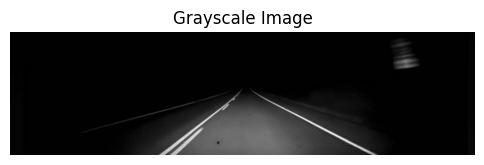

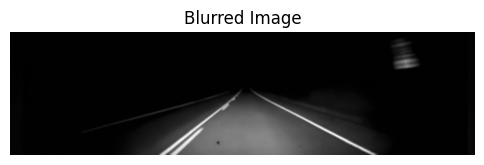

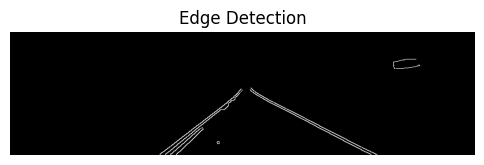

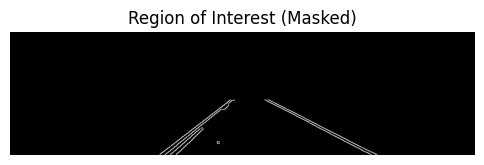

Processing Frame 47


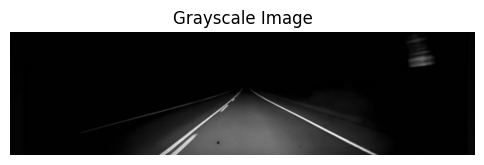

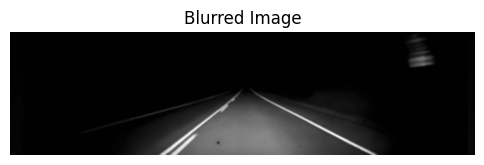

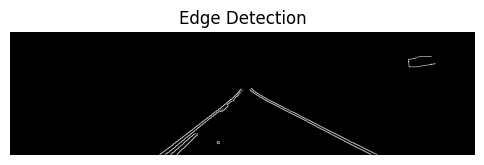

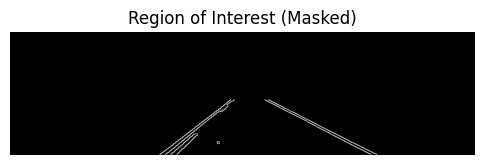

Processing Frame 48


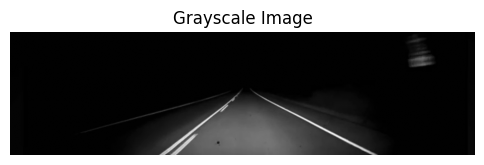

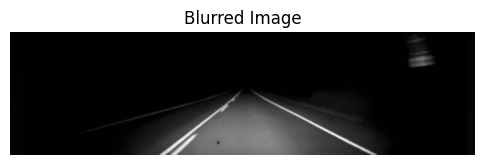

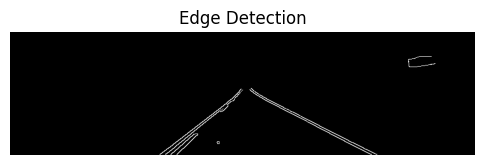

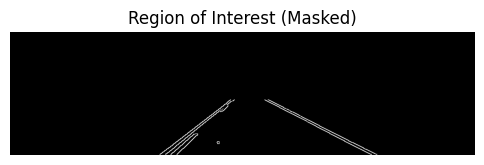

Processing Frame 49


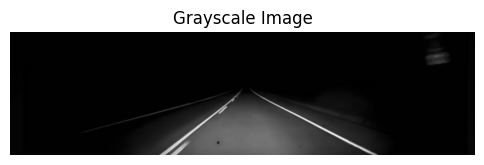

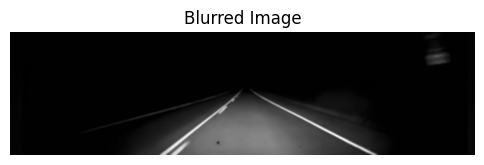

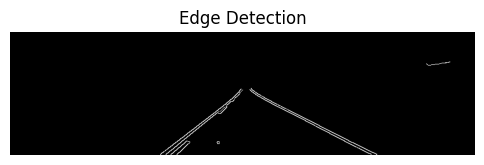

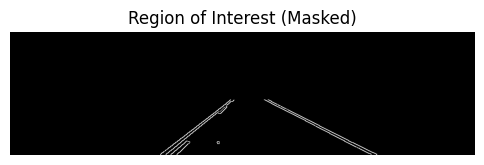

Processing Frame 50


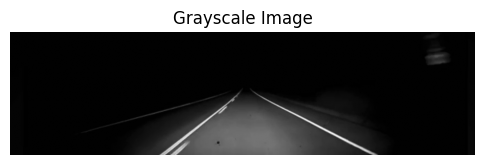

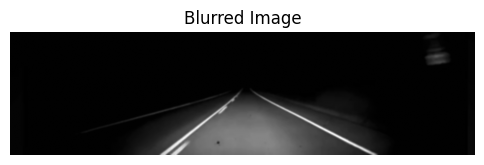

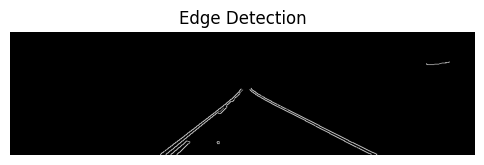

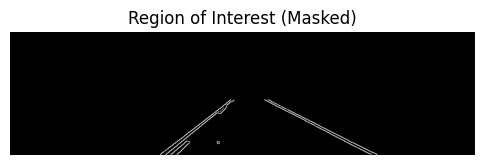

Processing Frame 51


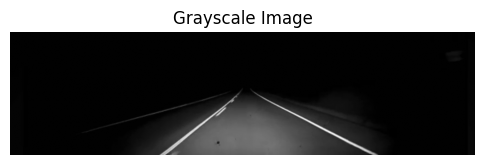

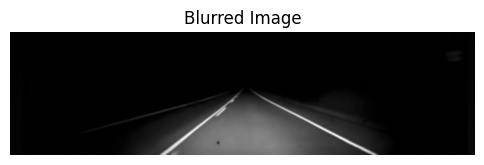

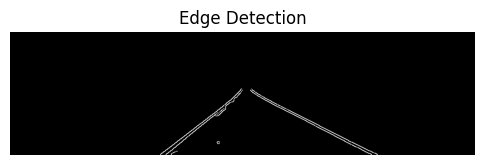

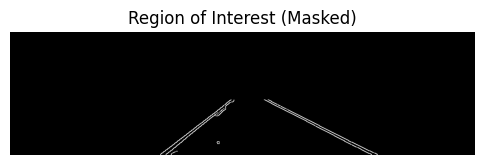

Processing Frame 52


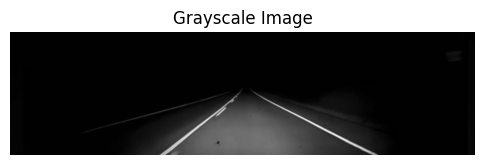

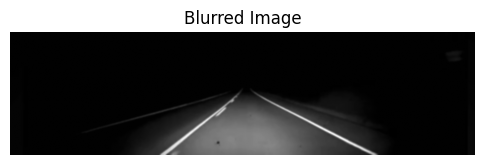

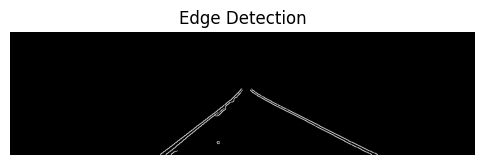

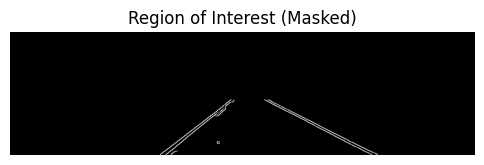

Processing Frame 53


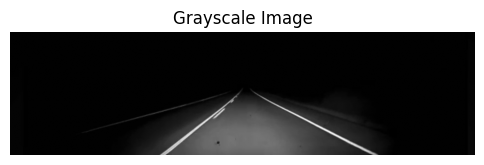

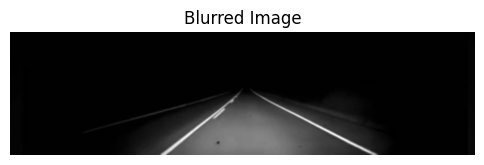

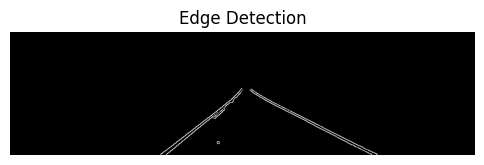

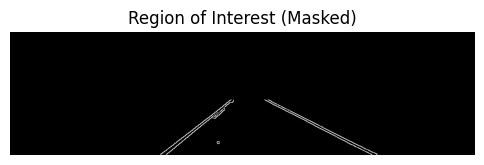

Processing Frame 54


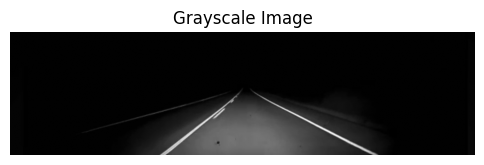

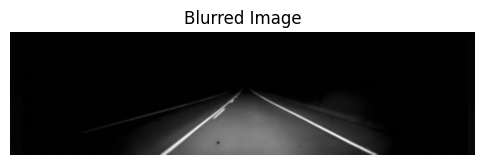

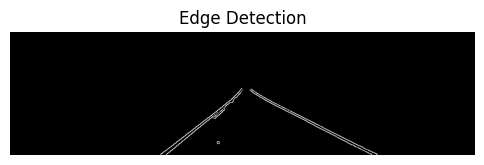

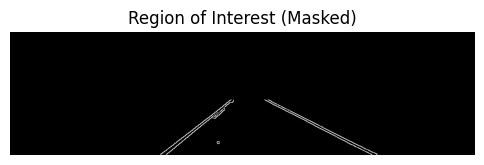

Processing Frame 55


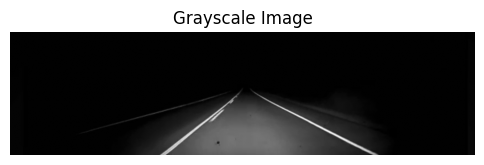

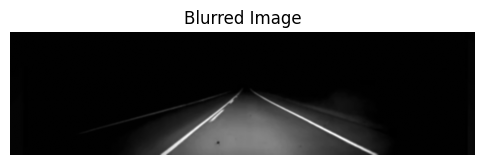

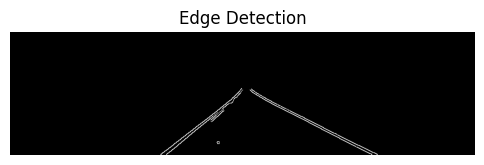

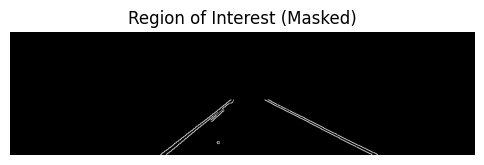

Processing Frame 56


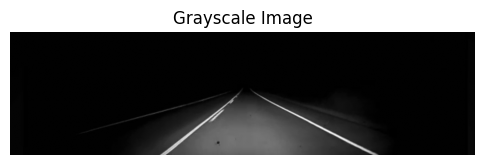

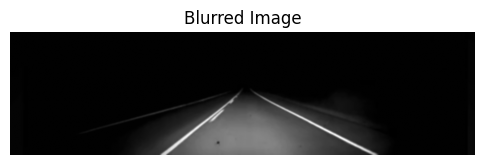

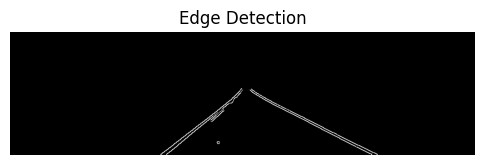

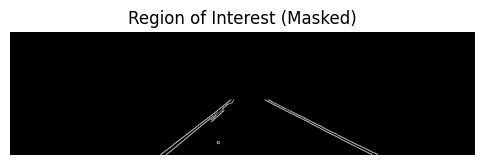

Processing Frame 57


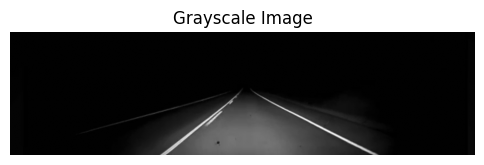

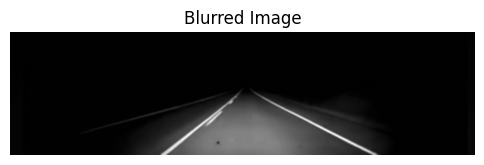

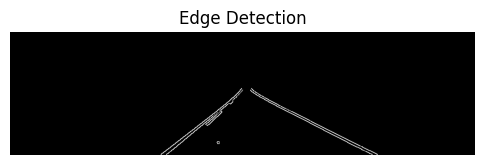

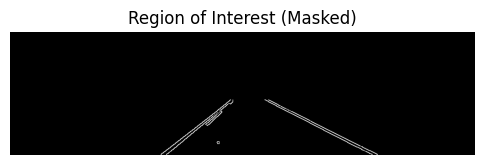

Processing Frame 58


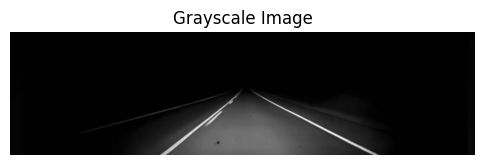

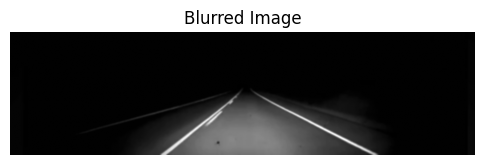

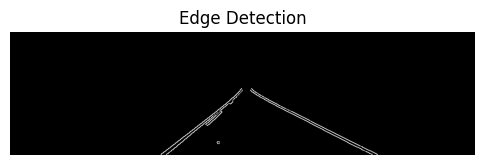

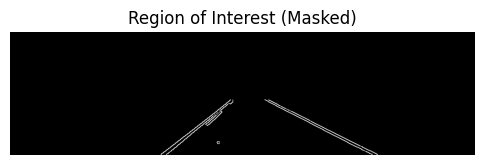

Processing Frame 59


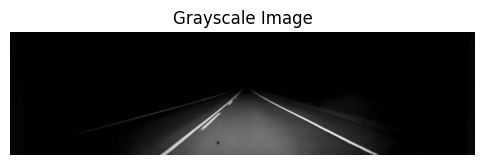

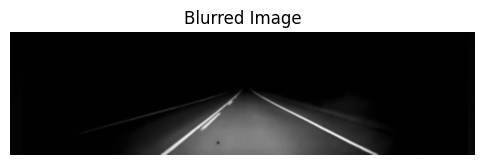

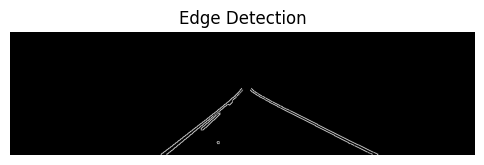

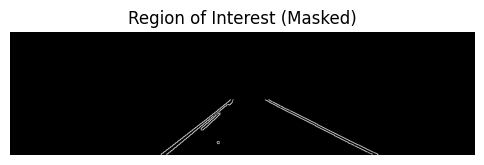

Processing Frame 60


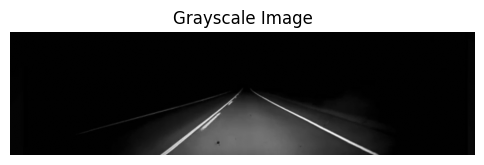

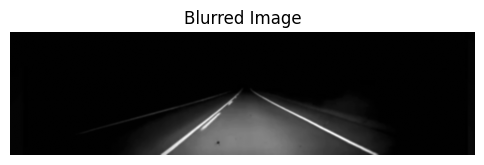

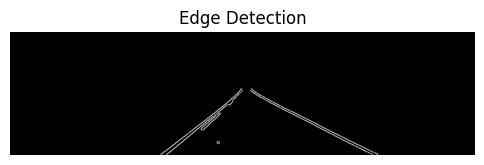

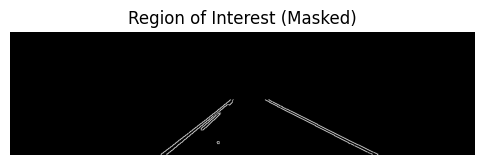

Processing Frame 61


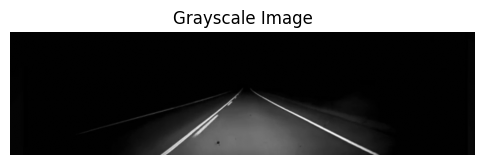

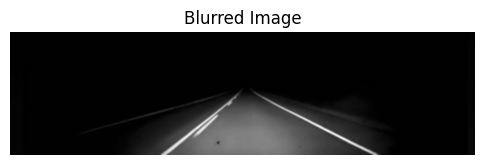

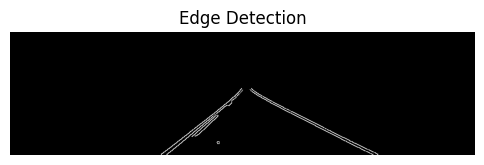

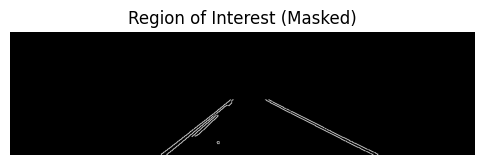

Processing Frame 62


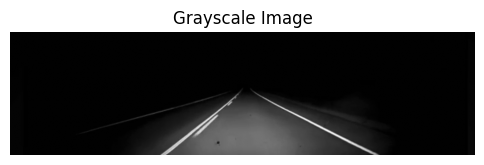

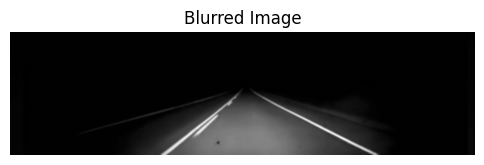

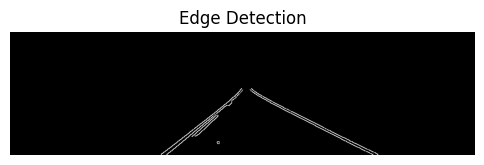

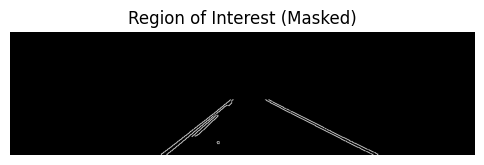

Processing Frame 63


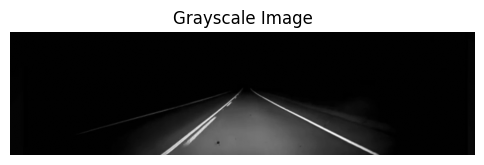

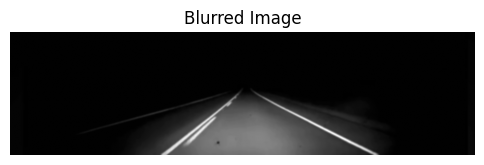

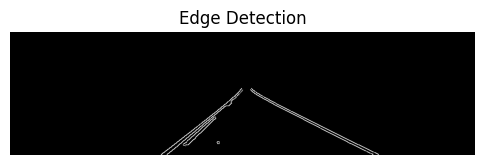

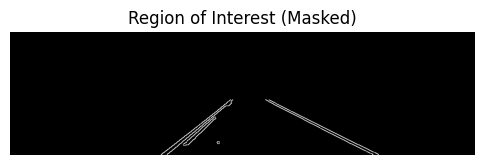

Processing Frame 64


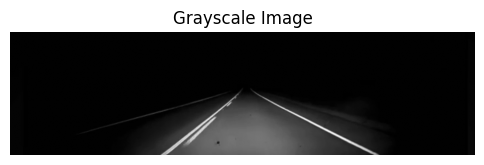

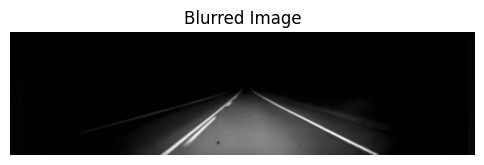

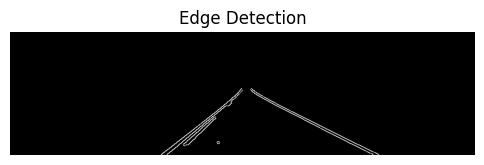

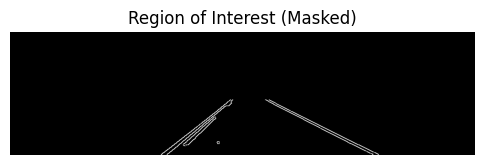

Processing Frame 65


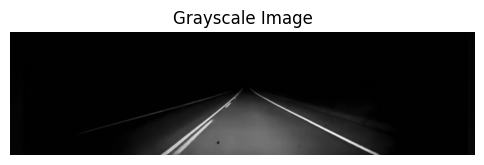

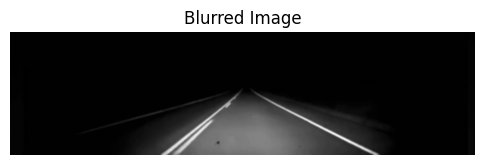

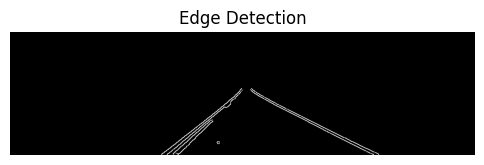

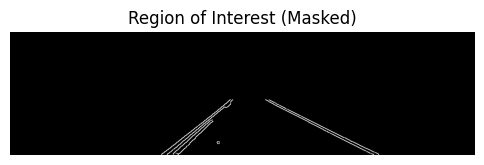

Processing Frame 66


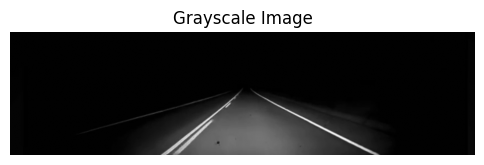

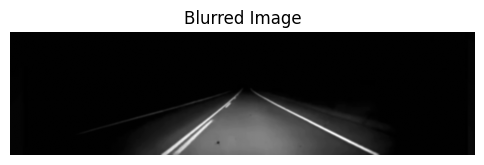

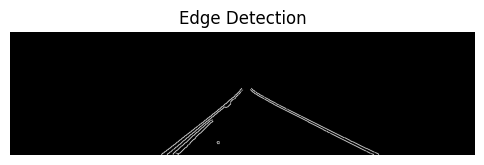

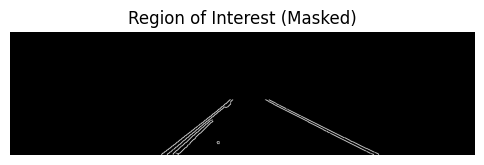

Processing Frame 67


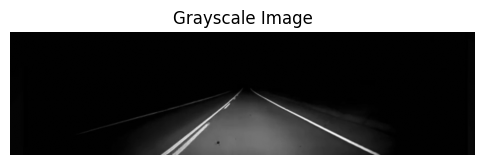

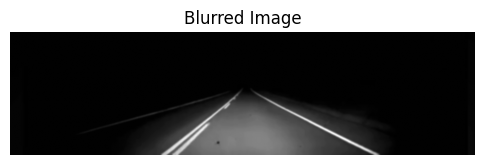

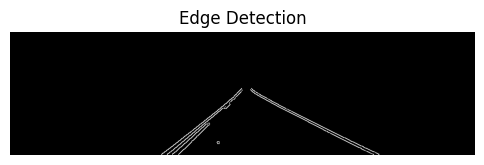

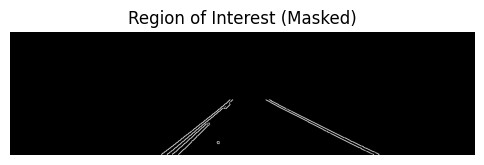

Processing Frame 68


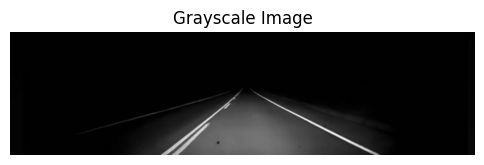

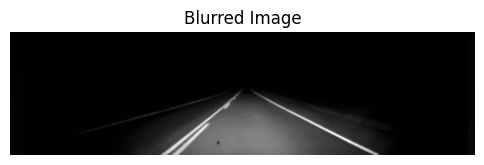

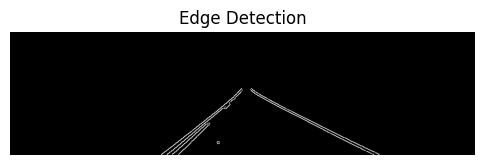

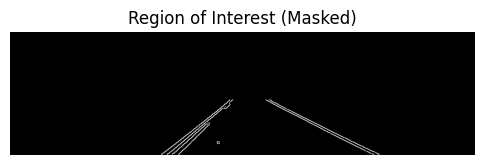

Processing Frame 69


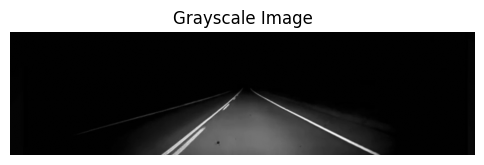

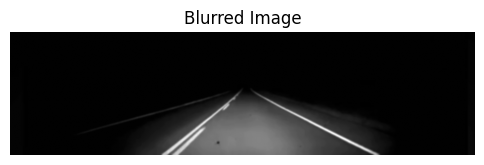

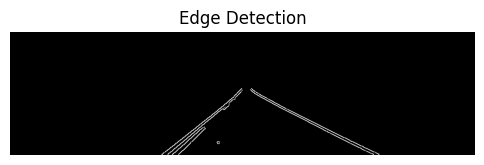

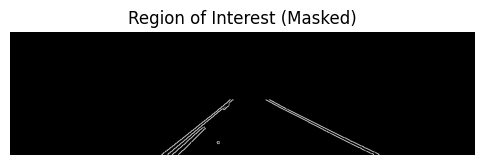

Processing Frame 70


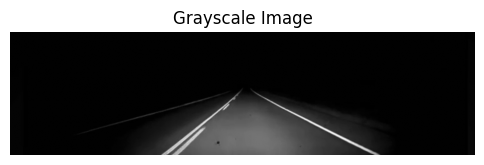

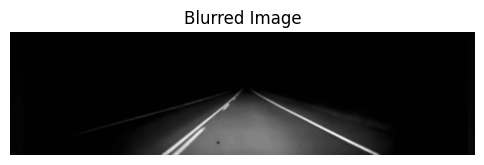

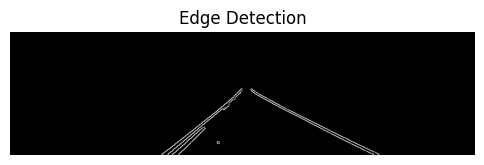

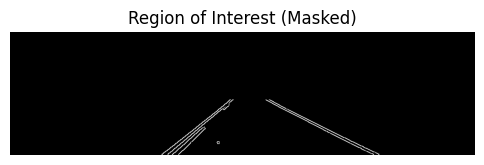

Processing Frame 71


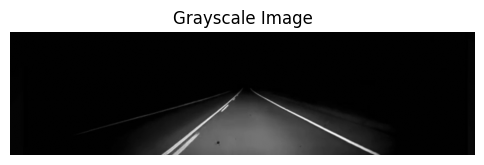

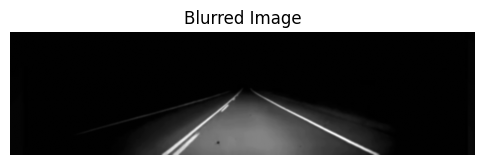

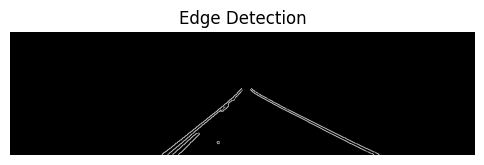

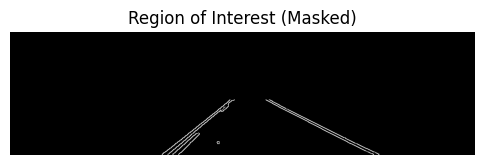

Processing Frame 72


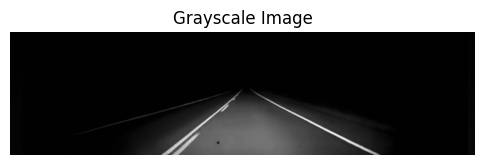

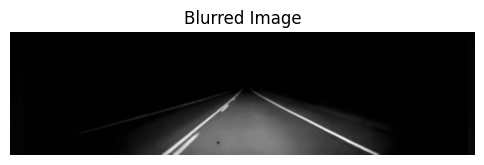

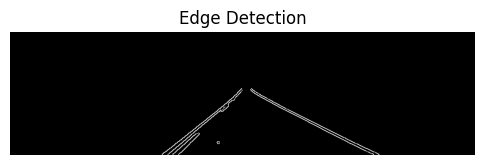

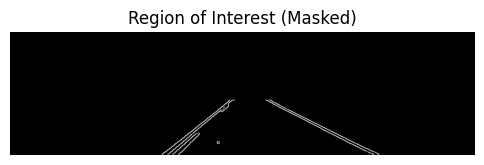

Processing Frame 73


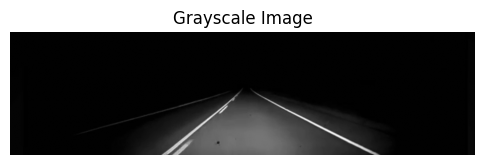

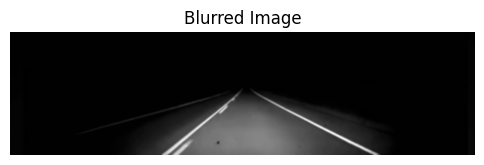

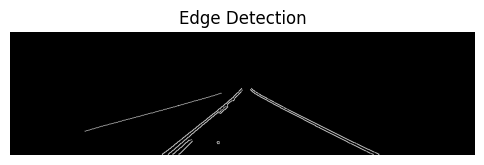

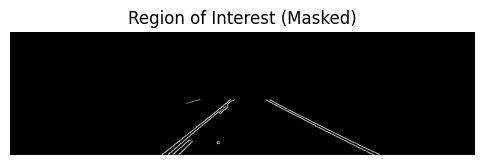

Processing Frame 74


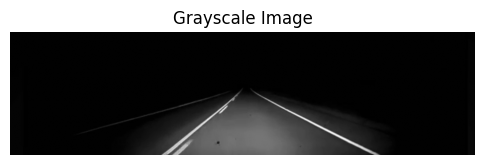

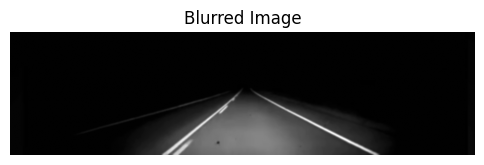

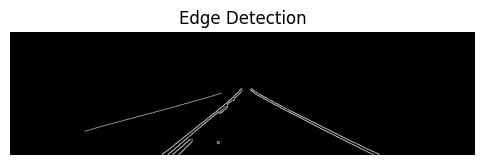

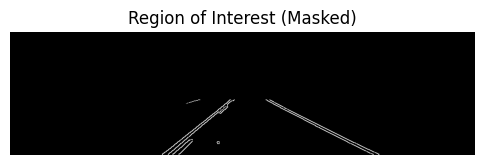

Processing Frame 75


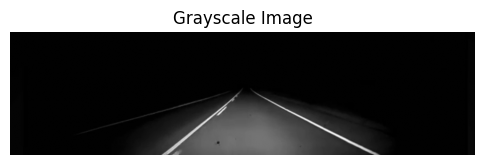

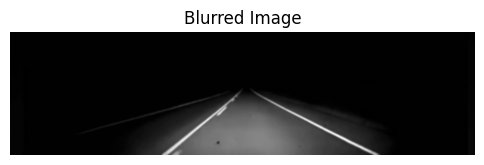

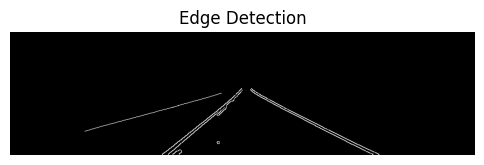

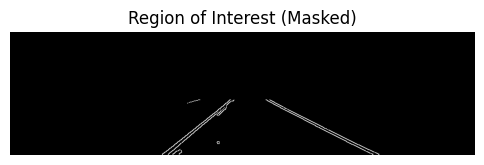

Processing Frame 76


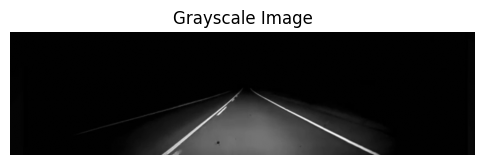

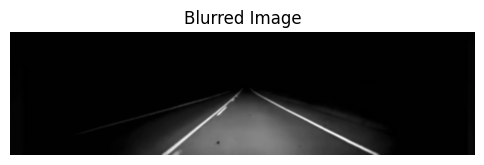

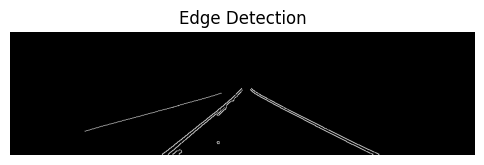

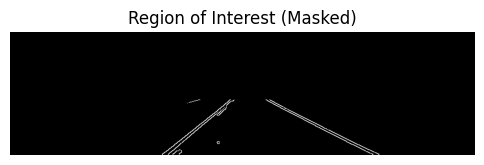

Processing Frame 77


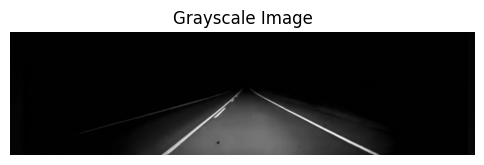

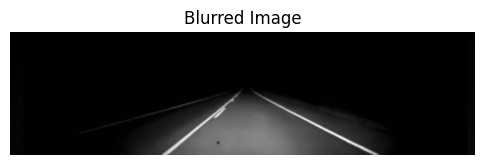

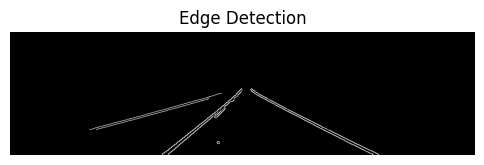

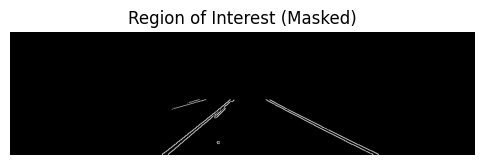

Processing Frame 78


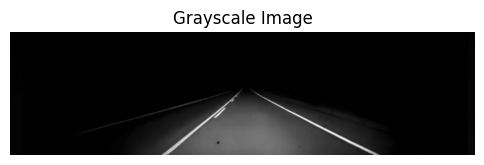

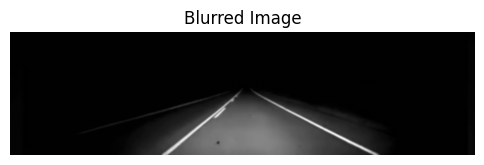

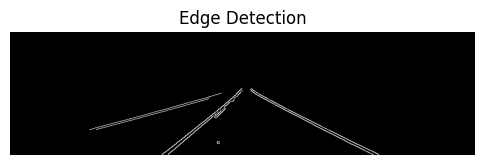

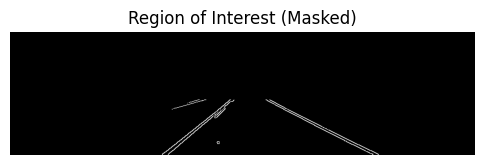

Processing Frame 79


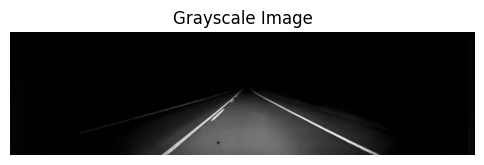

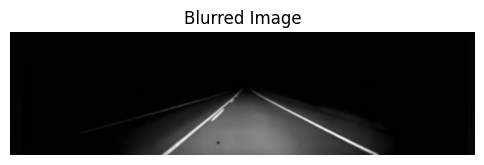

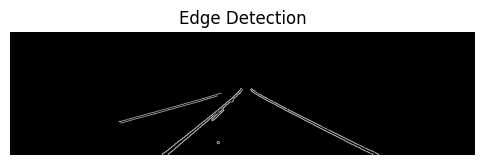

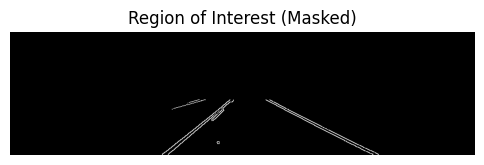

Processing Frame 80


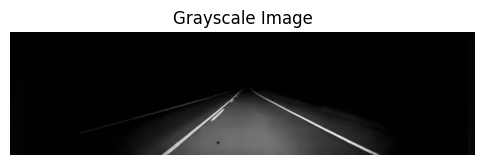

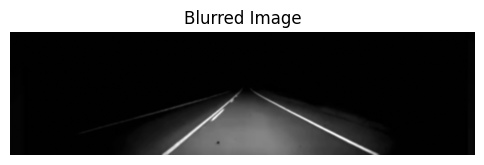

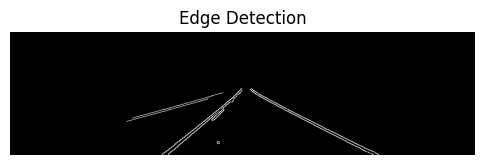

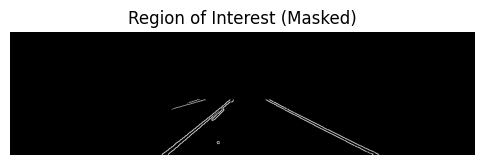

Processing Frame 81


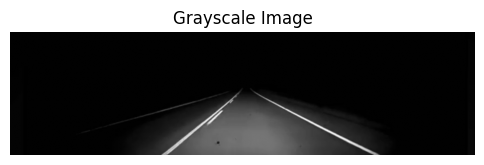

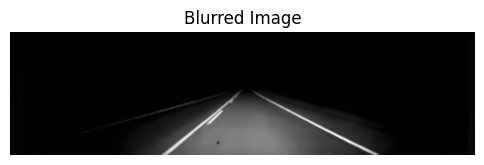

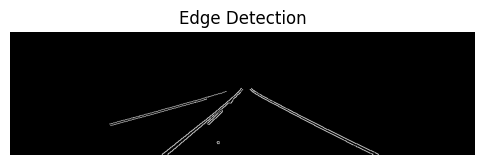

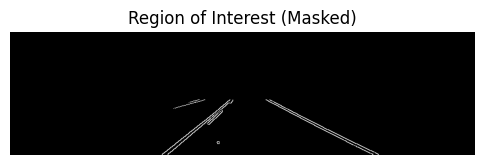

Processing Frame 82


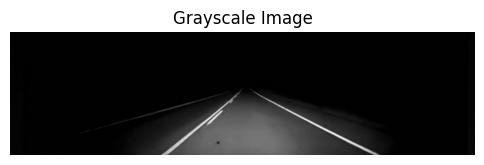

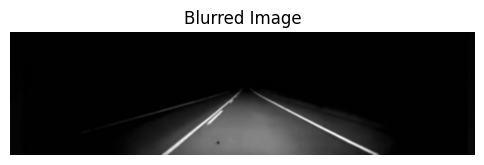

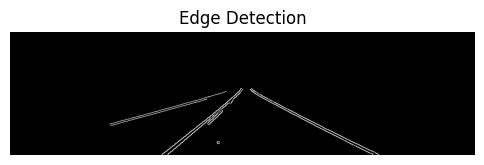

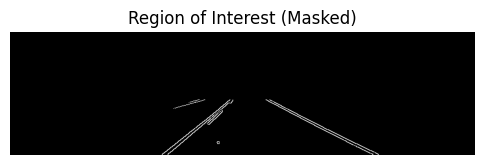

Processing Frame 83


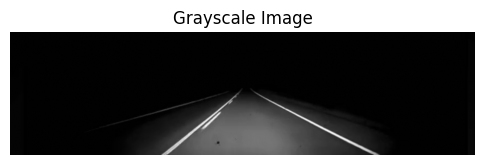

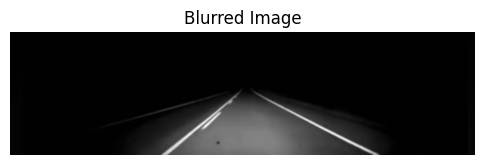

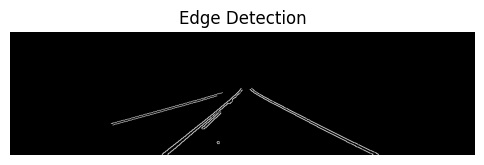

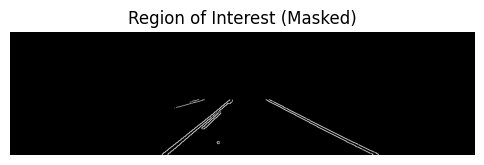

Processing Frame 84


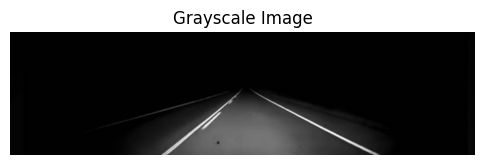

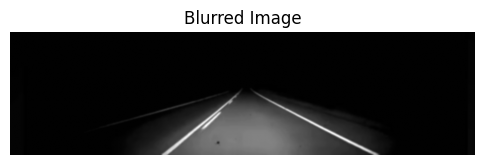

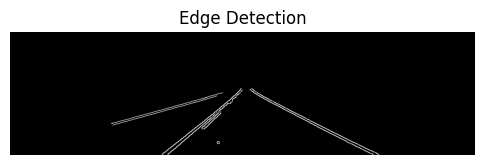

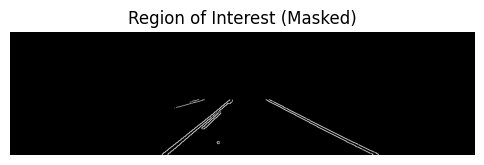

Processing Frame 85


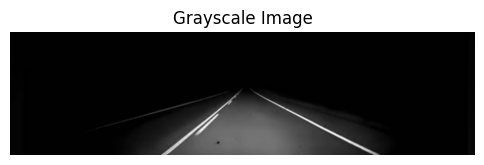

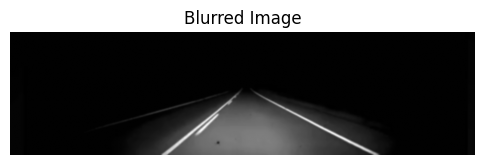

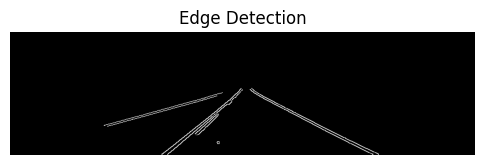

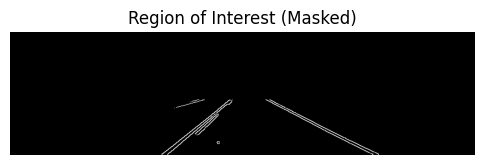

Processing Frame 86


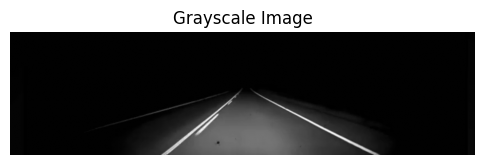

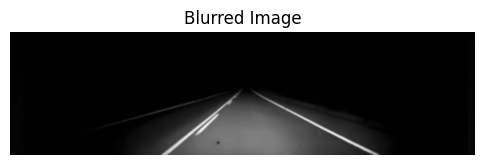

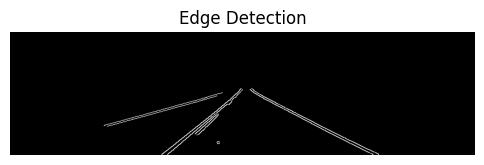

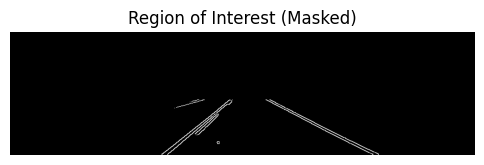

Processing Frame 87


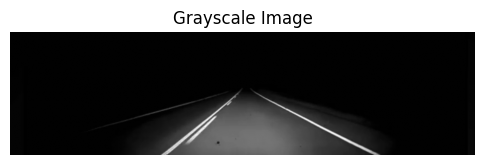

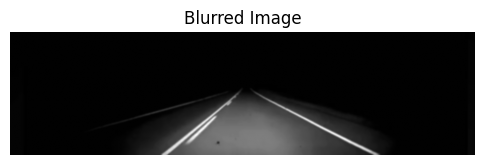

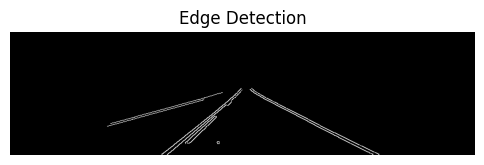

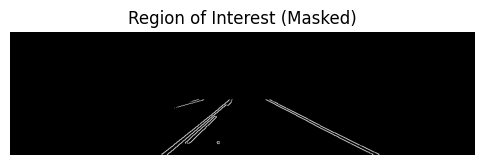

Processing Frame 88


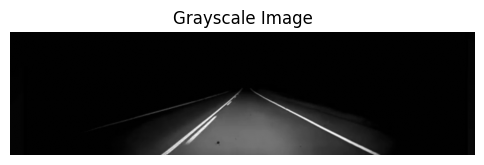

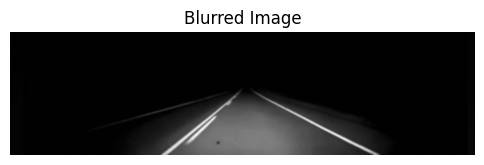

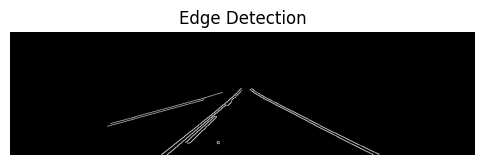

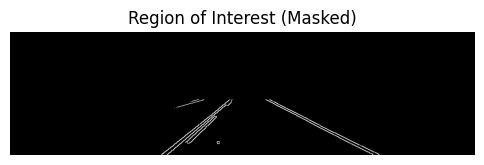

Processing Frame 89


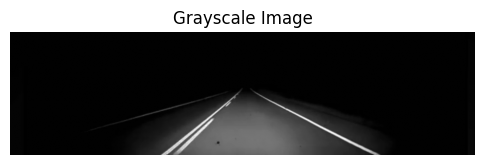

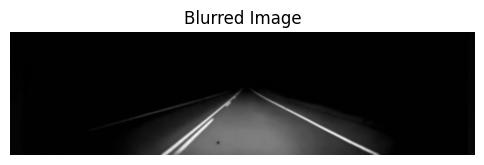

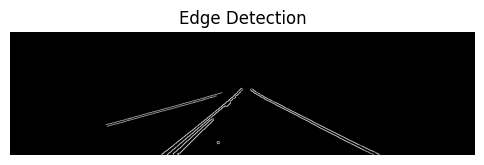

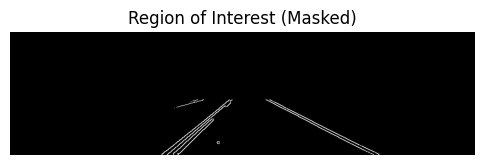

Processing Frame 90


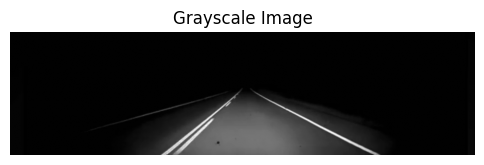

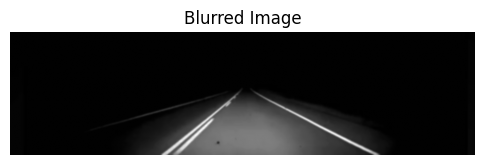

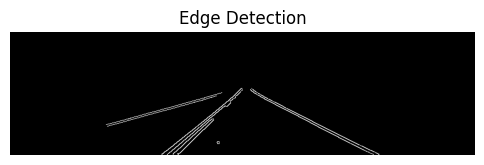

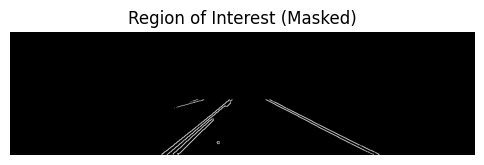

Processing Frame 91


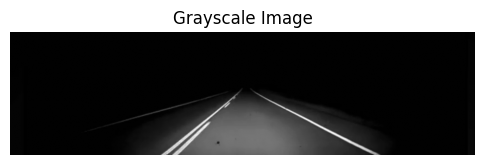

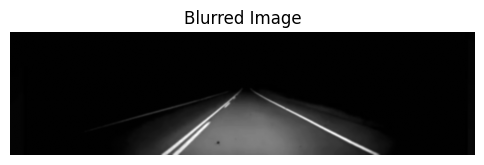

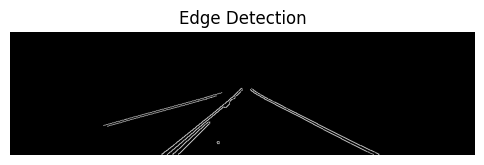

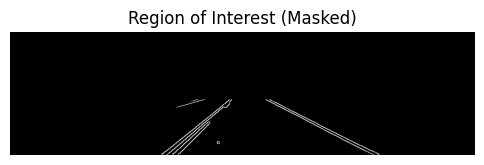

Processing Frame 92


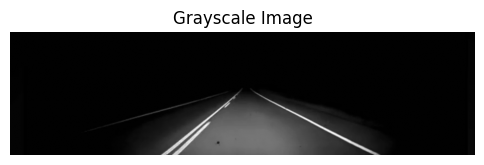

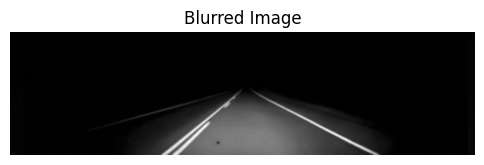

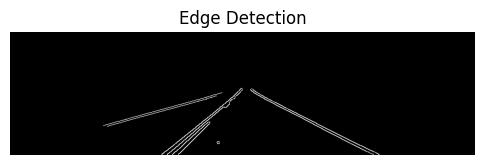

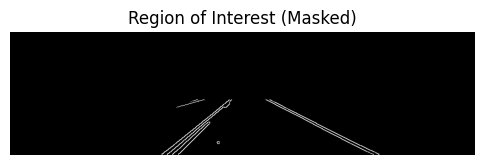

Processing Frame 93


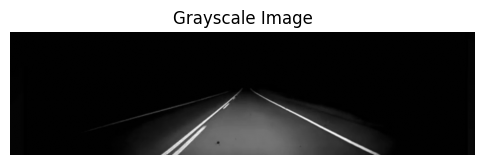

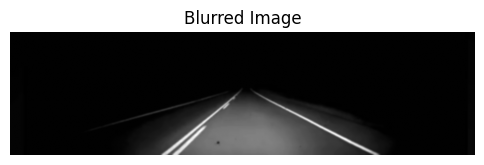

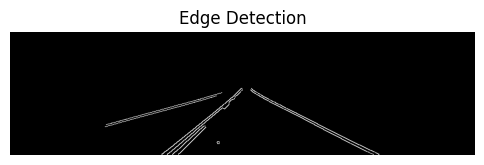

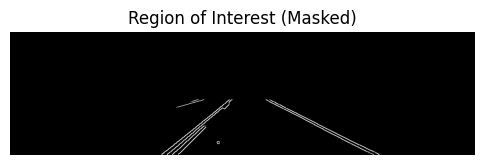

Processing Frame 94


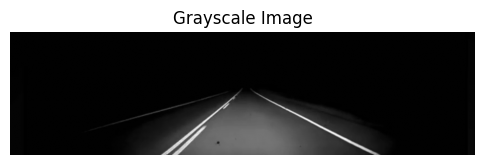

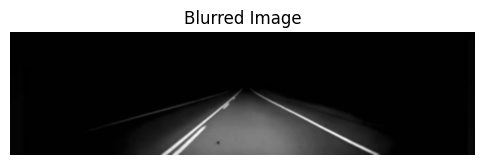

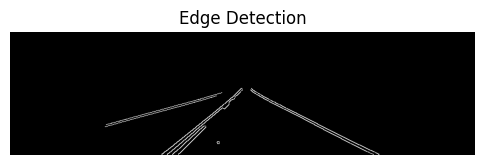

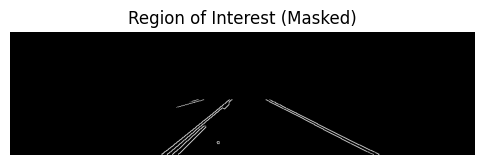

Processing Frame 95


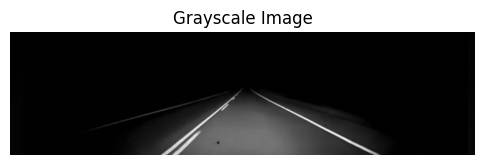

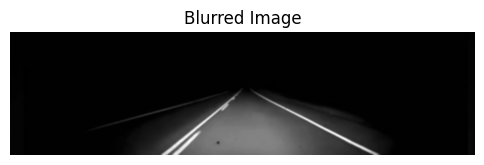

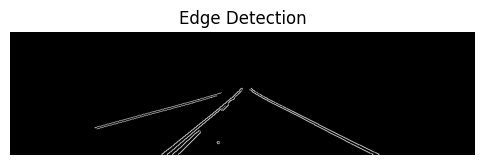

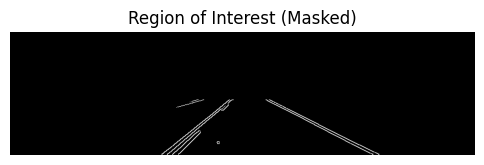

Processing Frame 96


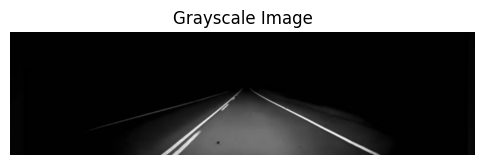

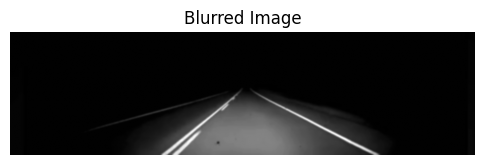

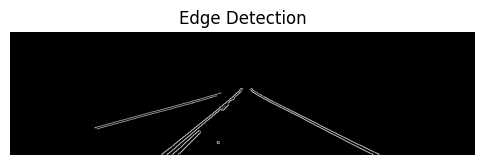

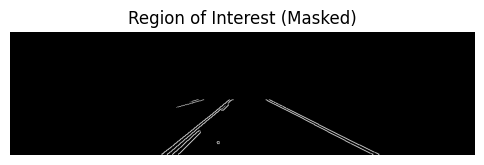

Processing Frame 97


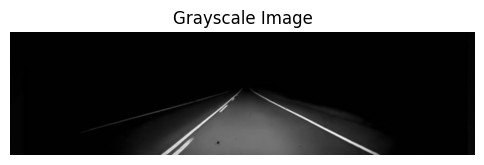

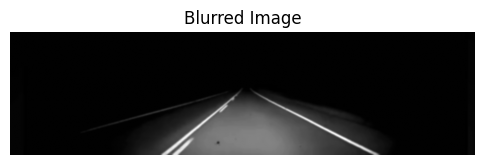

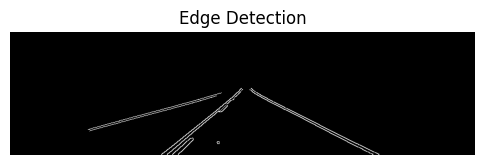

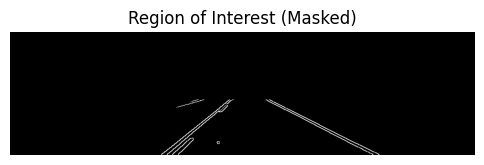

Processing Frame 98


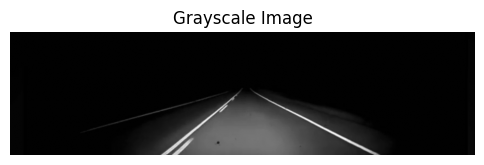

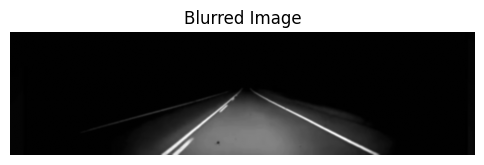

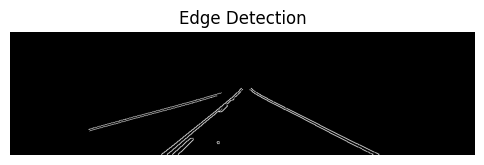

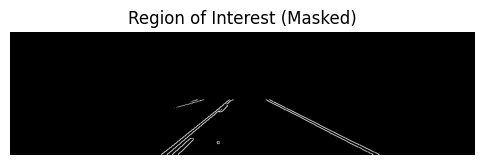

Processing Frame 99


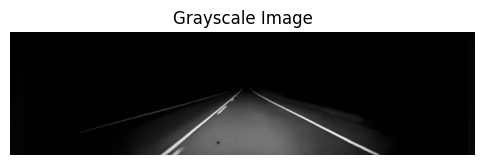

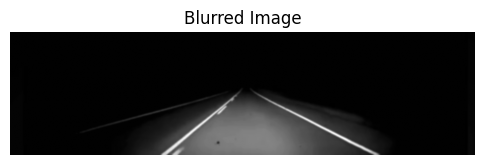

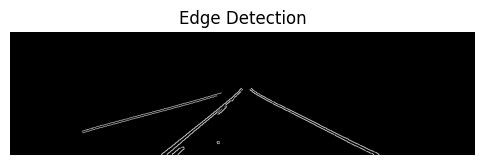

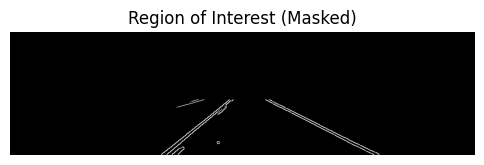

Processing Frame 100


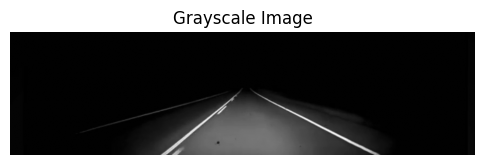

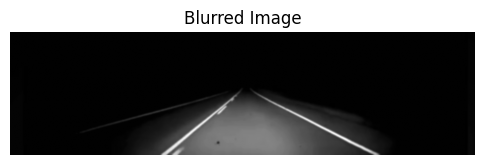

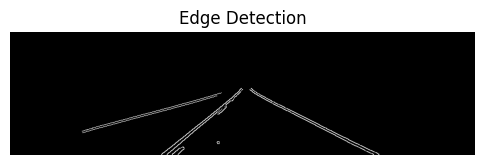

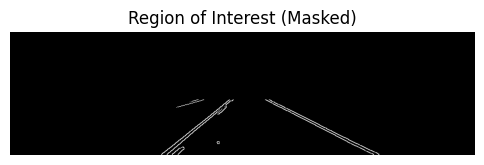

Processing Frame 101


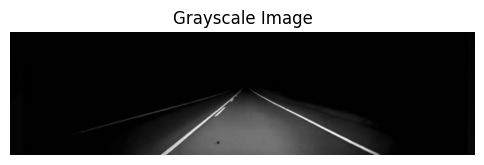

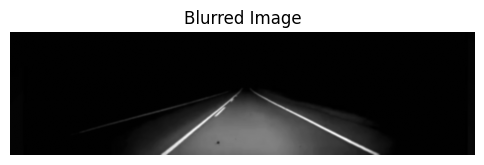

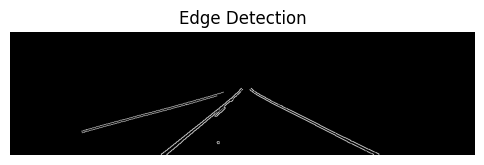

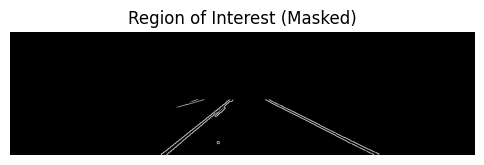

Processing Frame 102


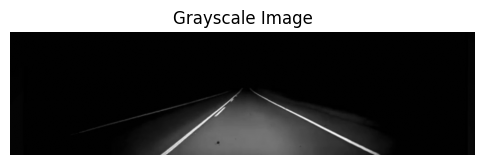

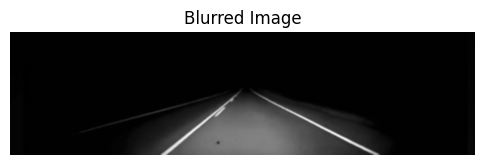

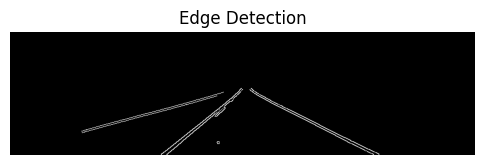

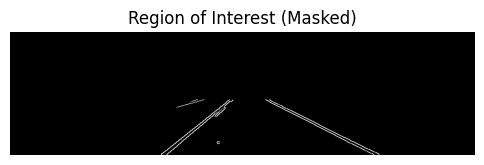

Processing Frame 103


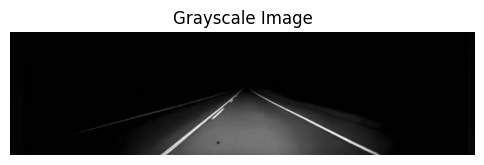

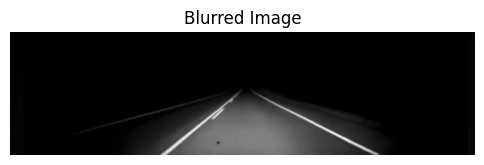

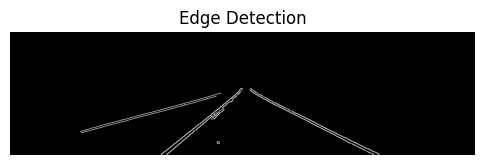

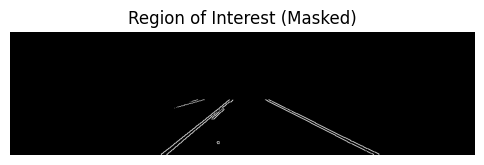

Processing Frame 104


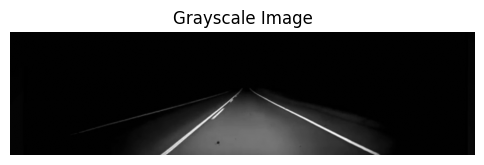

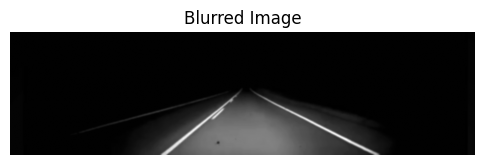

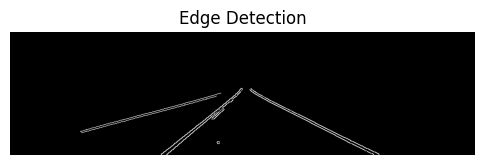

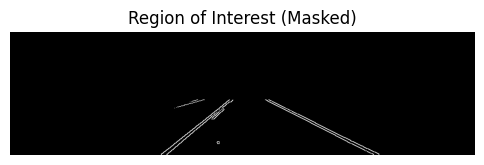

Processing Frame 105


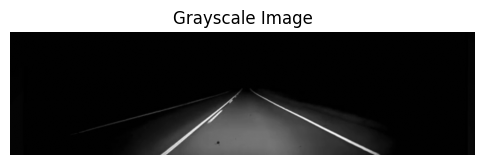

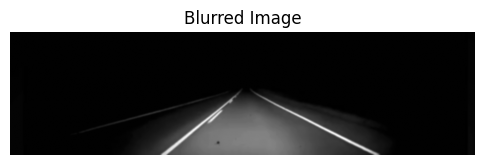

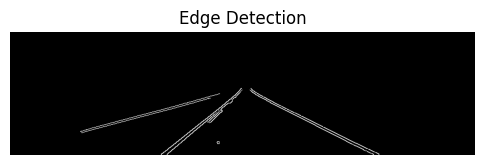

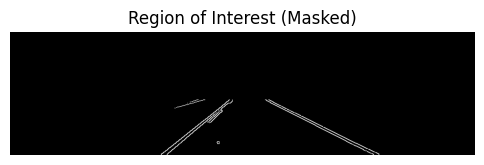

Processing Frame 106


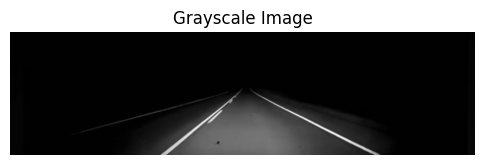

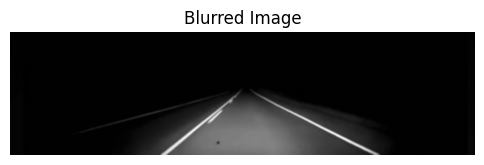

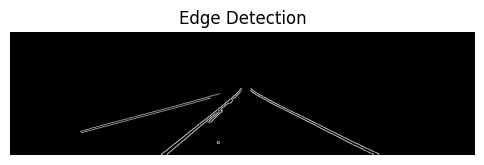

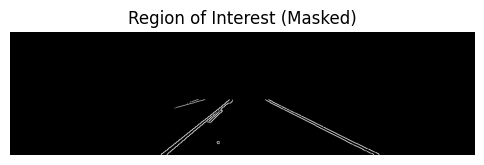

Processing Frame 107


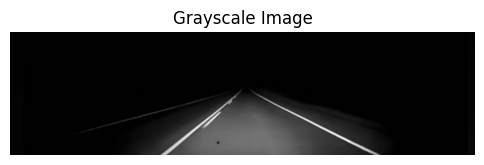

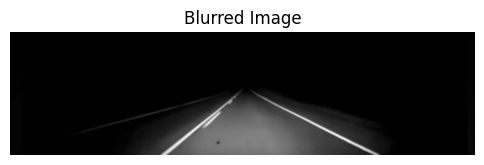

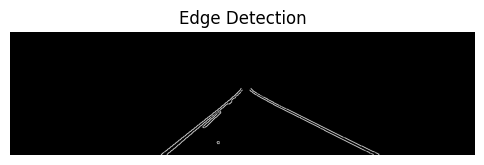

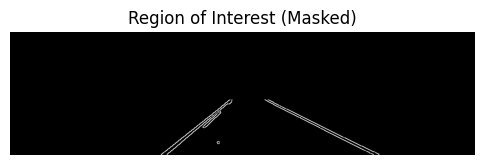

Processing Frame 108


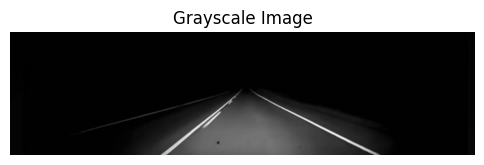

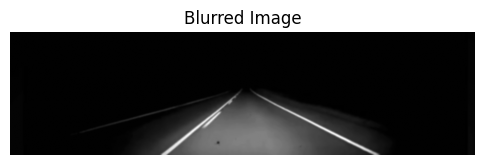

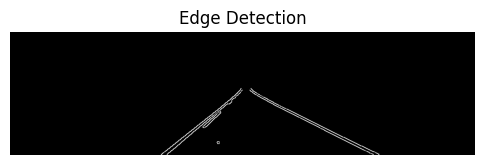

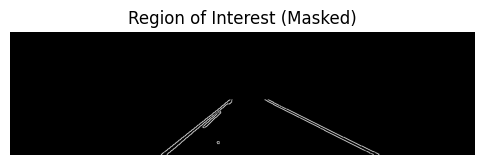

Processing Frame 109


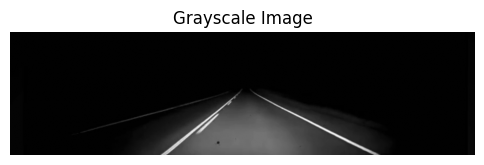

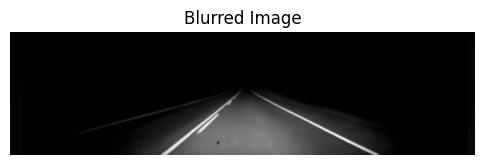

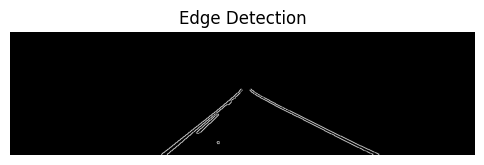

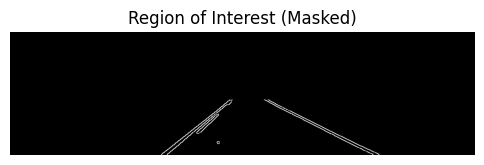

Processing Frame 110


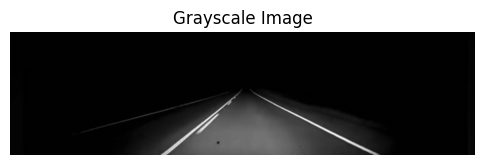

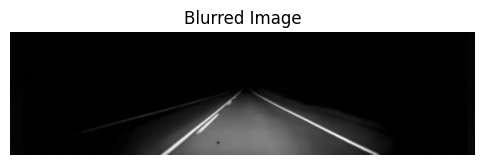

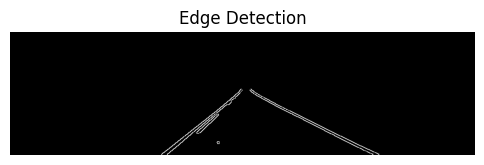

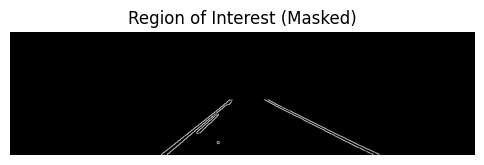

Processing Frame 111


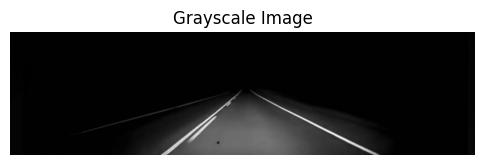

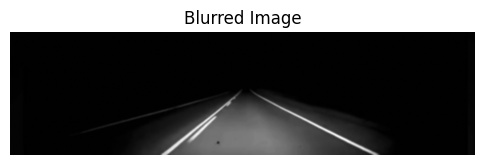

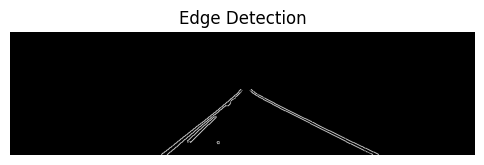

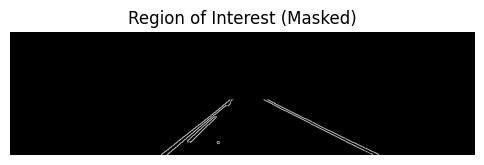

Processing Frame 112


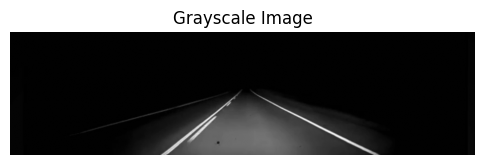

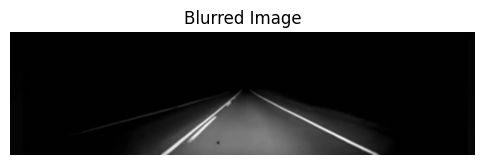

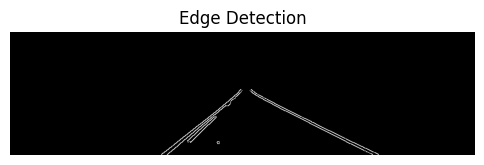

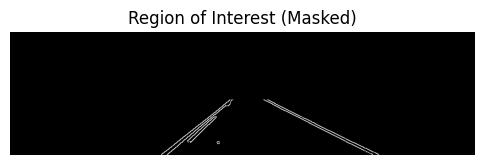

Processing Frame 113


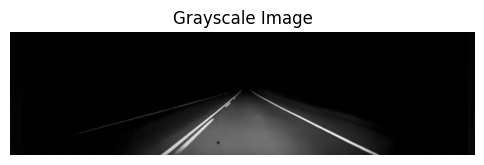

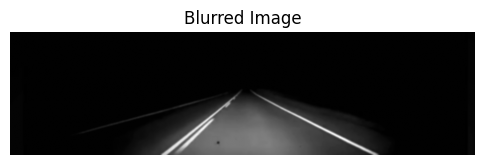

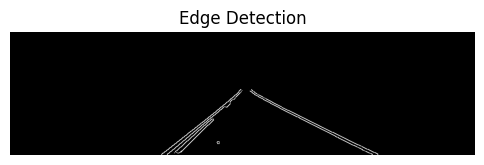

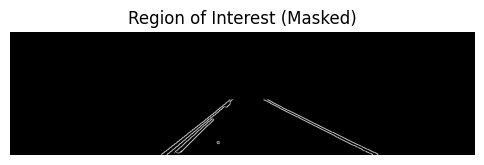

Processing Frame 114


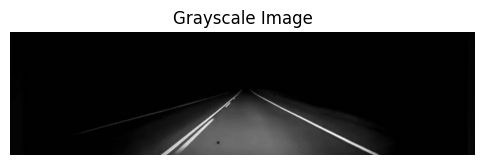

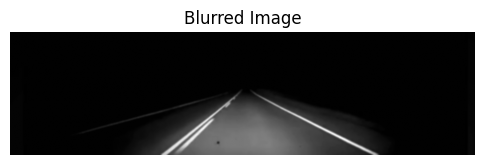

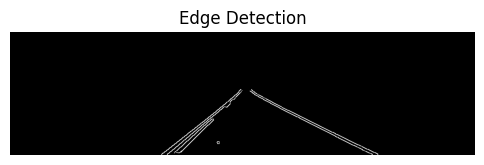

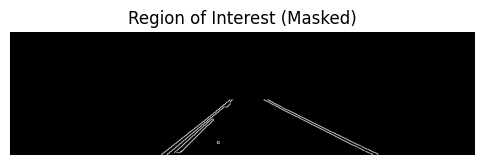

Processing Frame 115


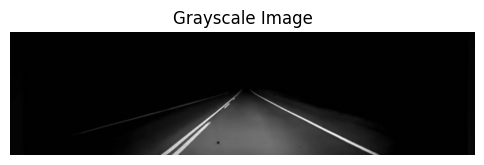

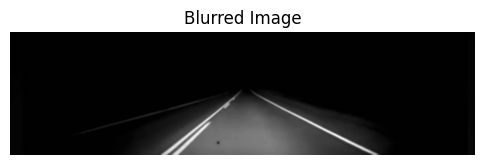

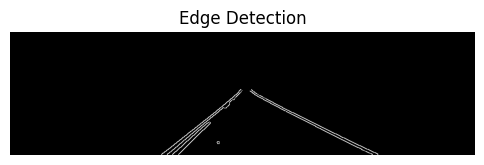

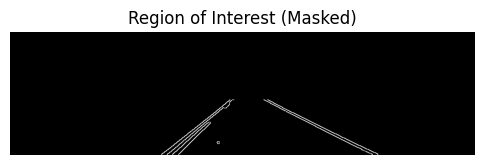

Processing Frame 116


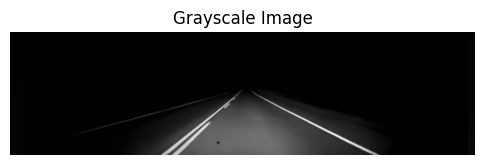

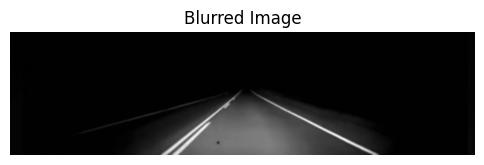

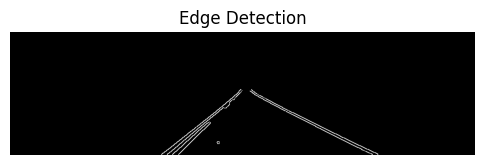

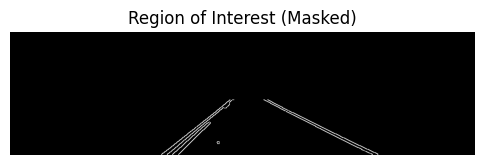

Processing Frame 117


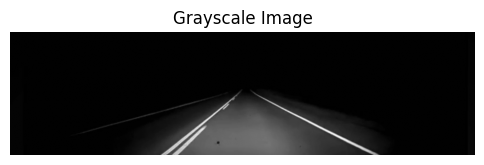

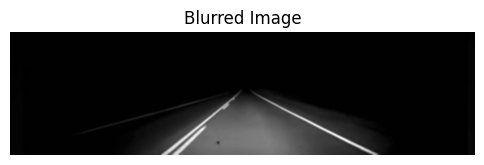

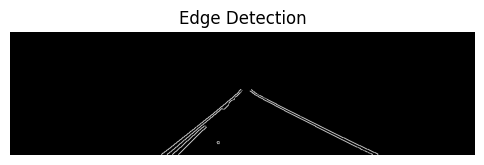

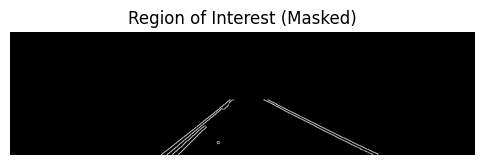

Processing Frame 118


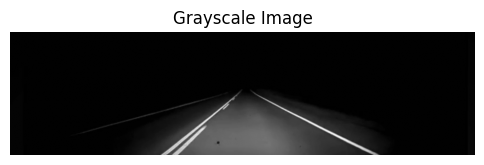

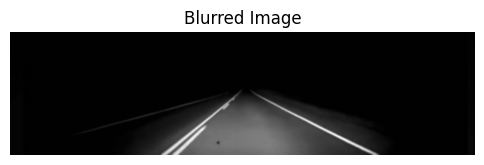

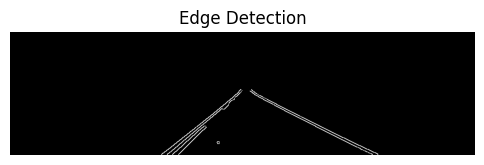

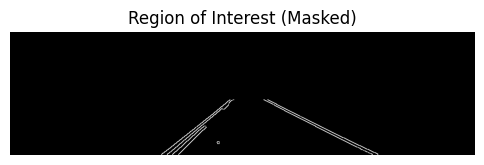

Processing Frame 119


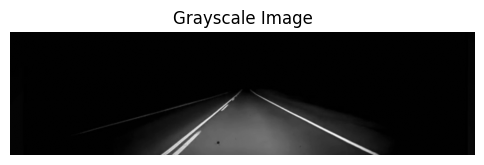

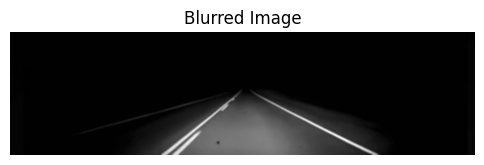

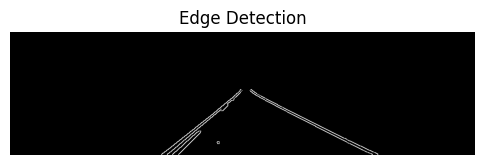

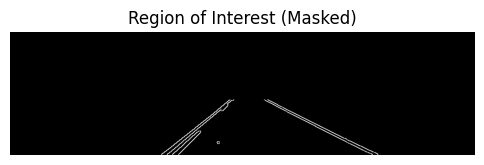

Processing Frame 120


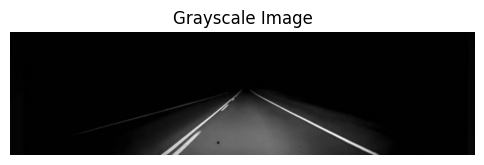

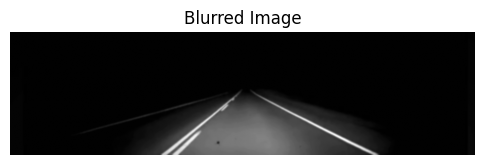

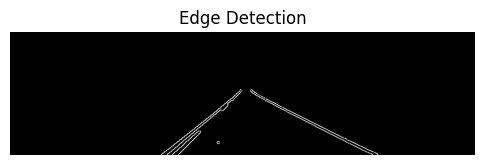

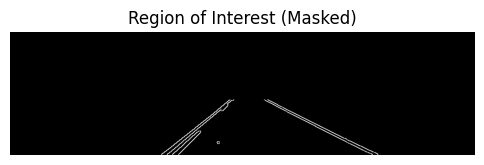

Processing Frame 121


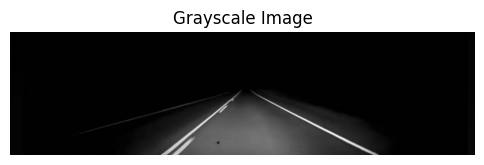

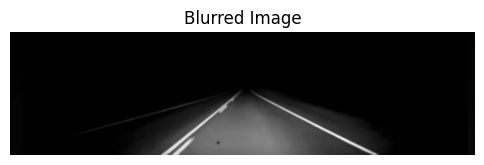

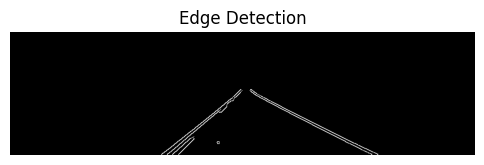

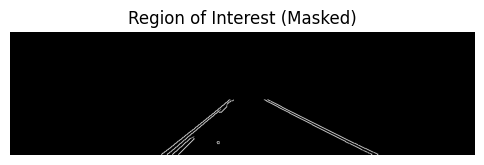

Processing Frame 122


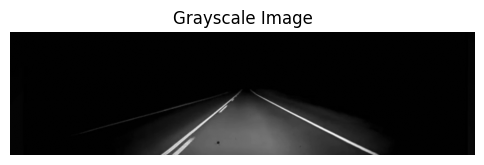

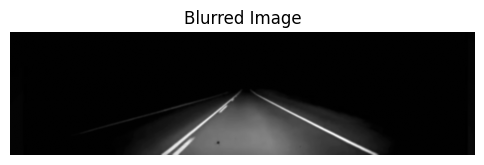

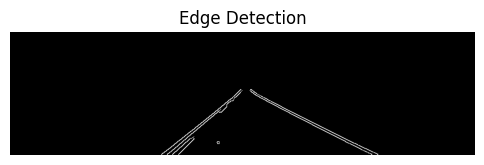

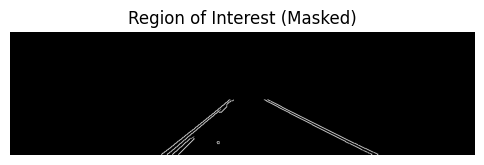

Processing Frame 123


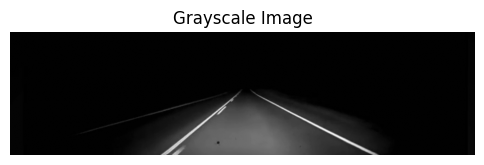

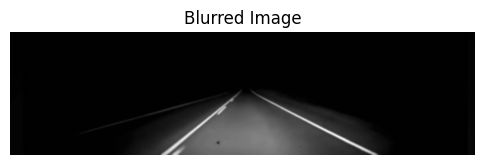

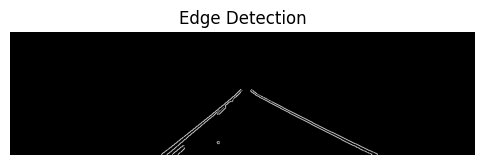

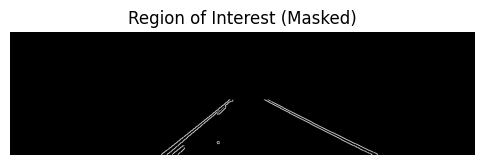

Processing Frame 124


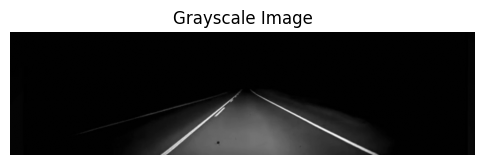

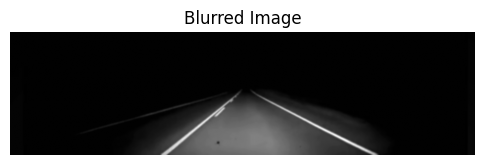

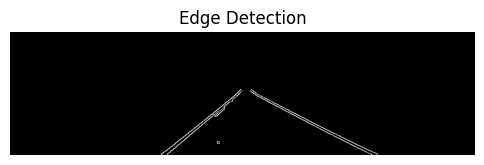

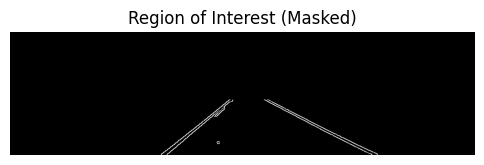

Processing Frame 125


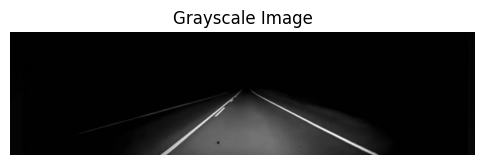

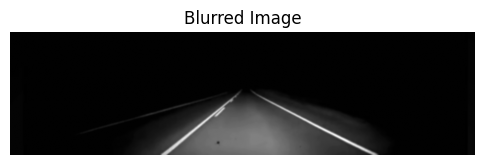

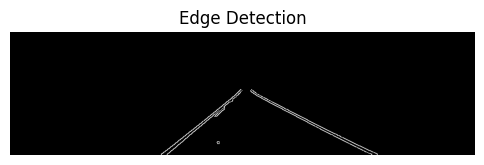

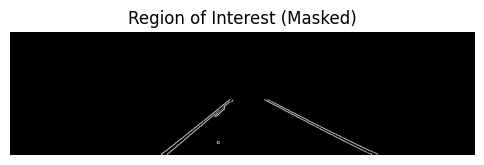

Processing Frame 126


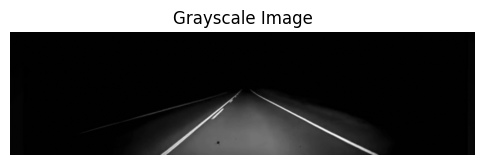

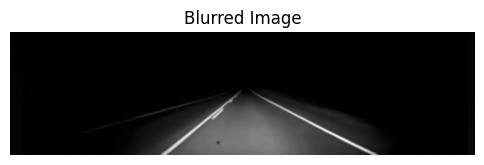

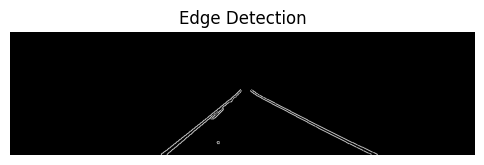

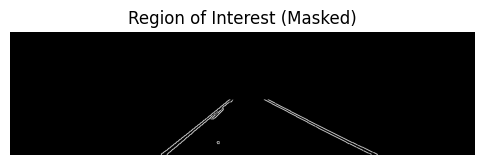

Processing Frame 127


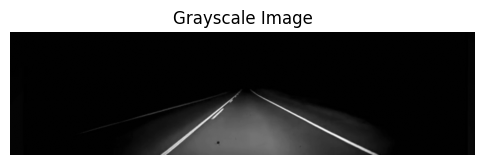

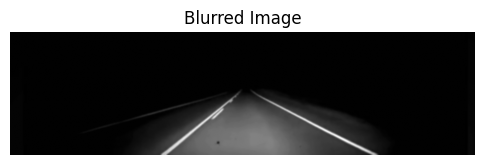

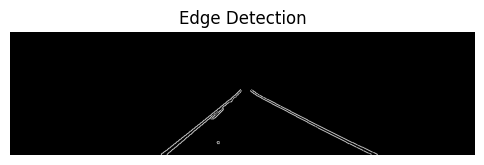

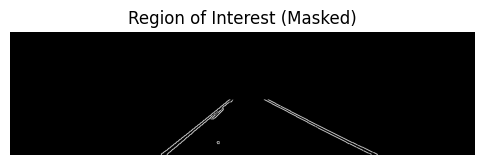

Processing Frame 128


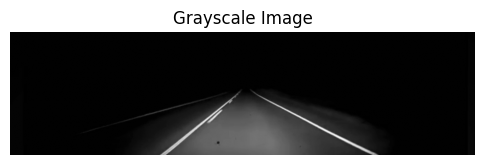

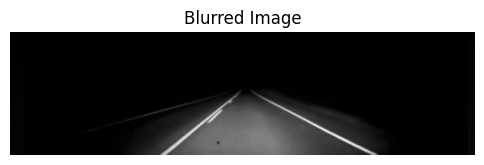

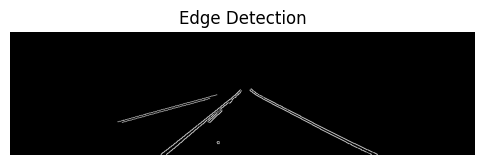

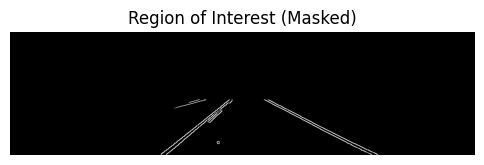

Processing Frame 129


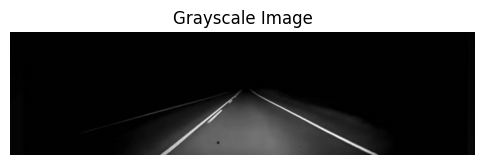

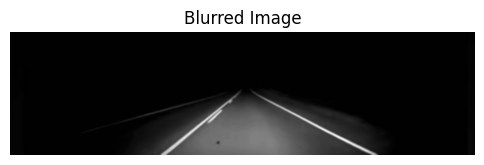

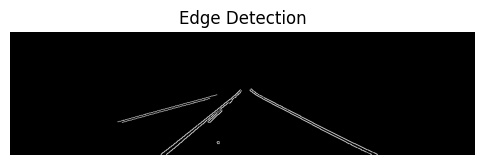

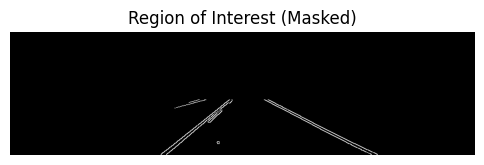

Processing Frame 130


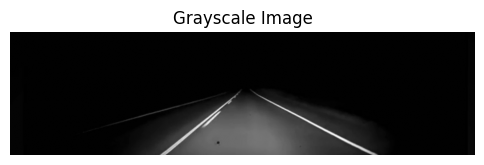

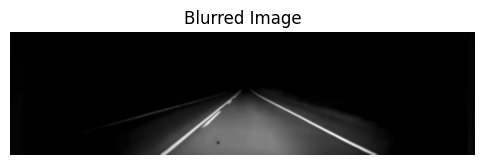

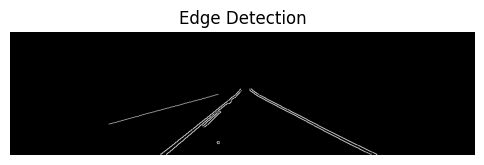

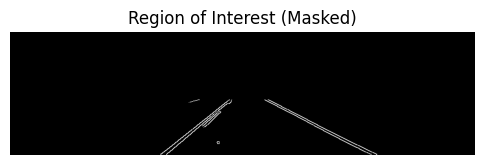

Processing Frame 131


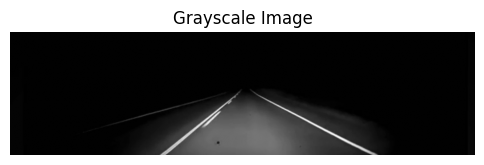

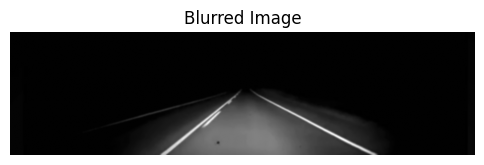

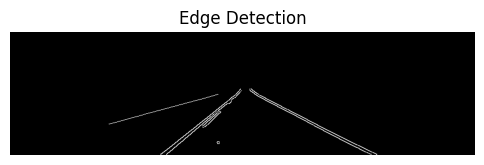

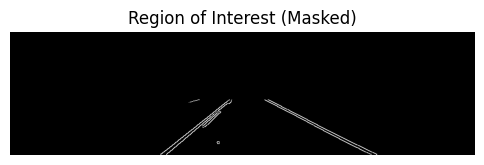

Processing Frame 132


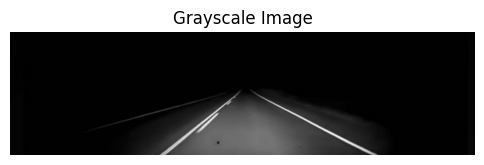

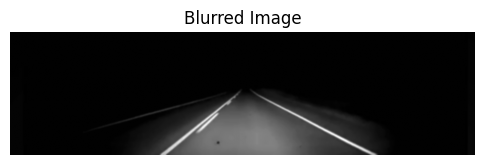

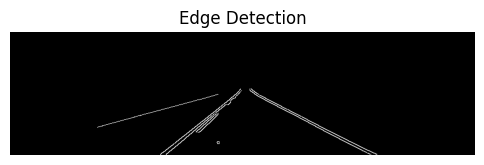

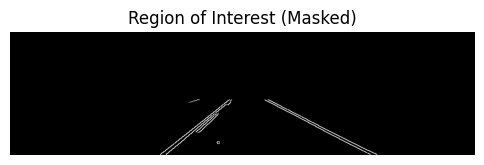

Processing Frame 133


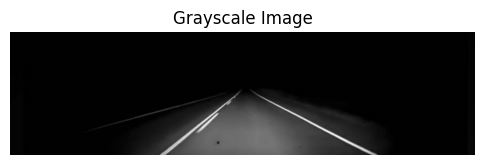

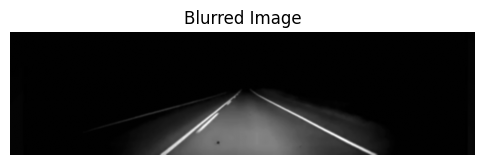

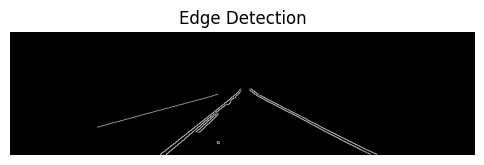

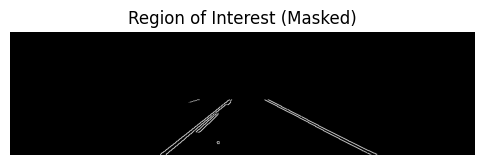

Processing Frame 134


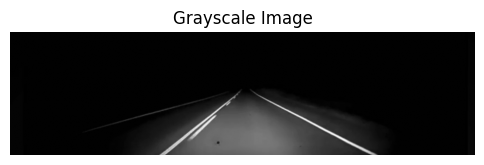

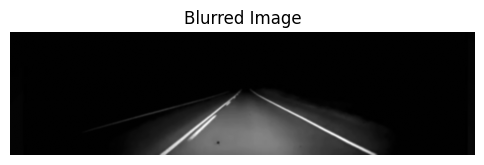

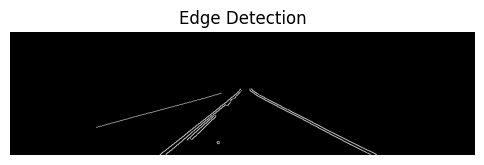

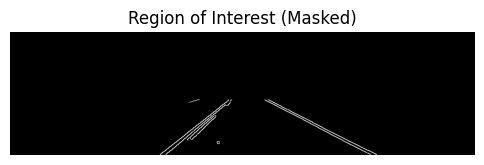

Processing Frame 135


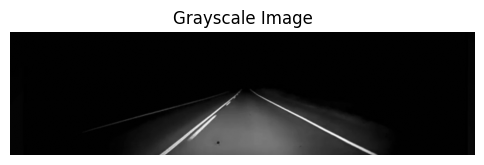

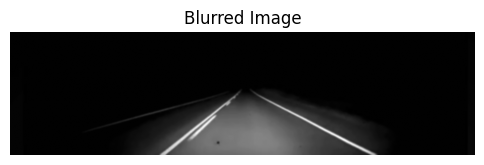

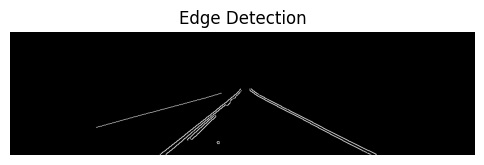

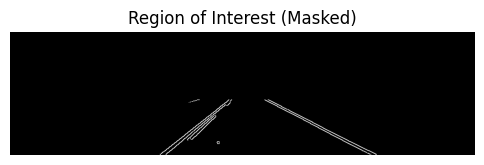

Processing Frame 136


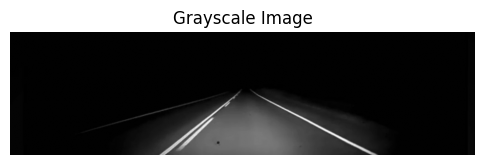

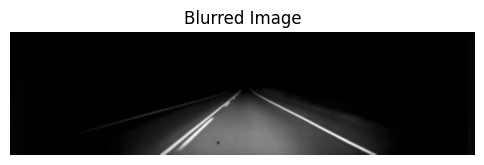

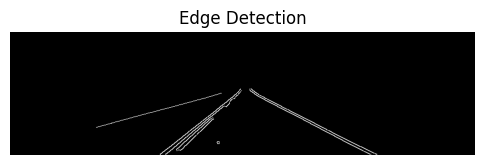

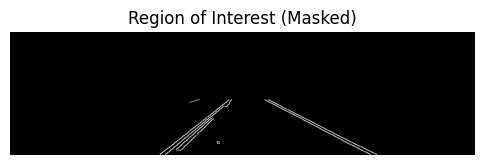

Processing Frame 137


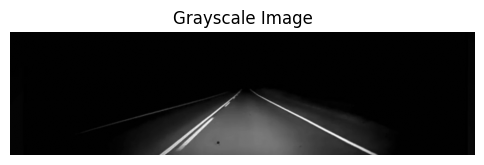

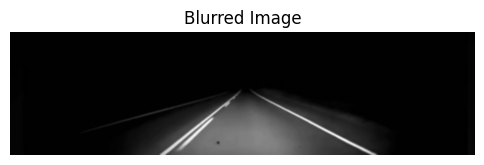

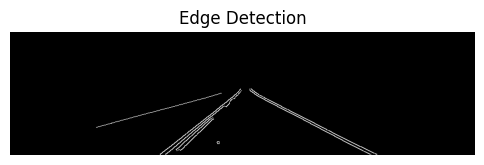

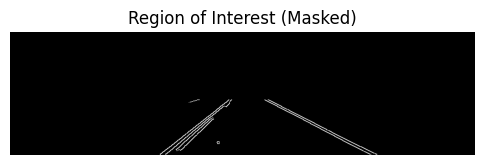

Processing Frame 138


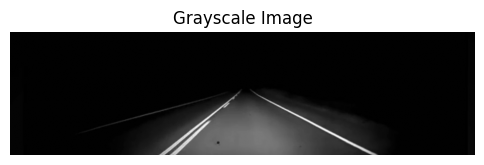

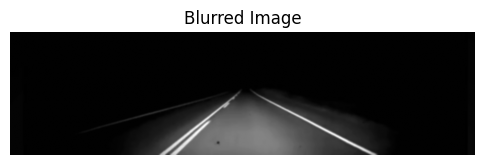

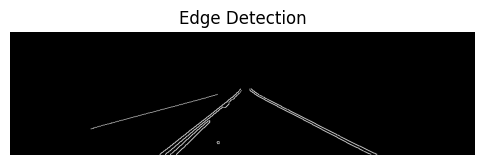

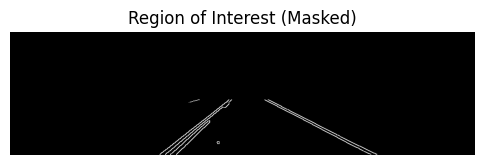

Processing Frame 139


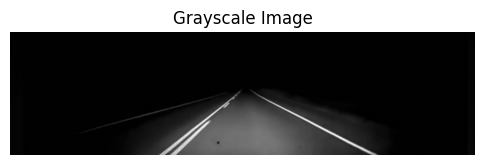

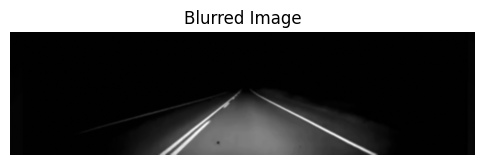

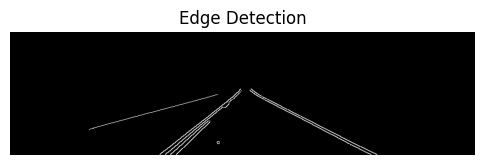

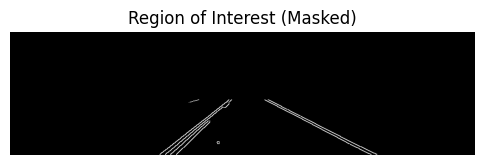

Processing Frame 140


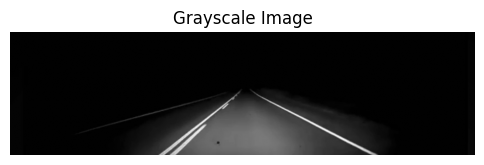

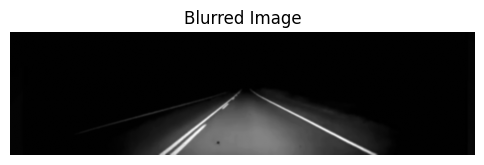

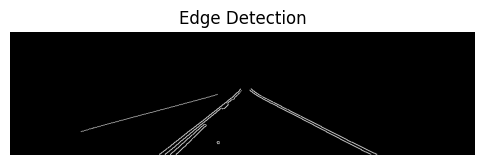

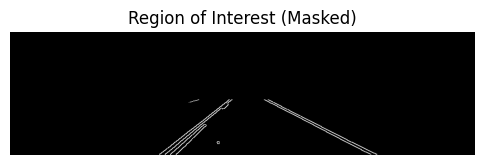

Processing Frame 141


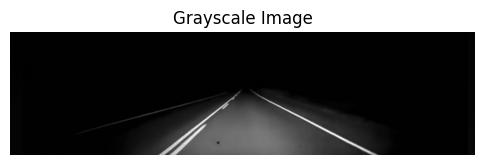

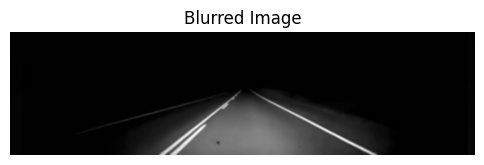

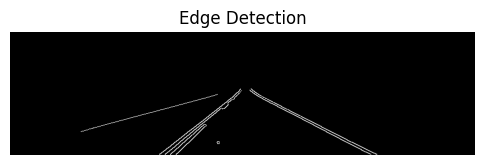

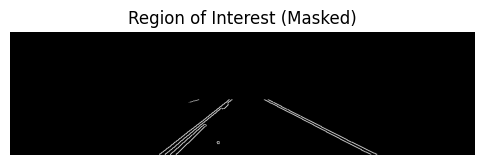

Processing Frame 142


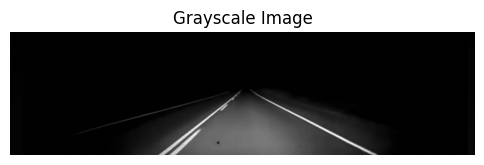

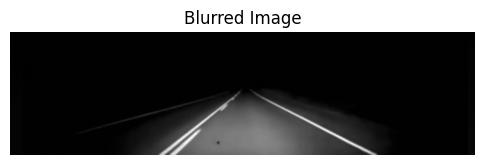

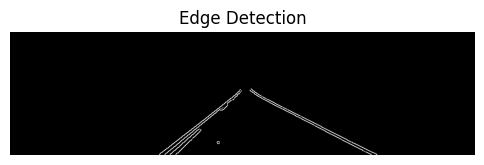

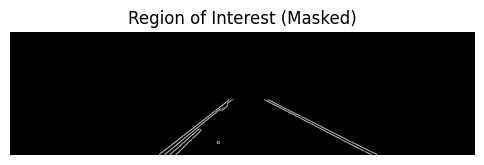

Processing Frame 143


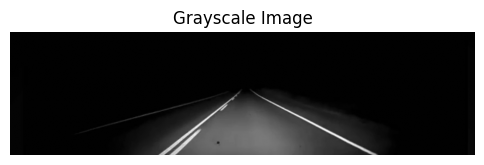

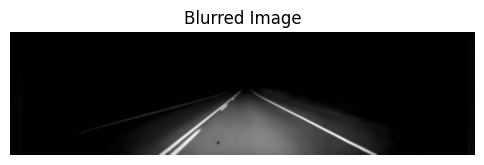

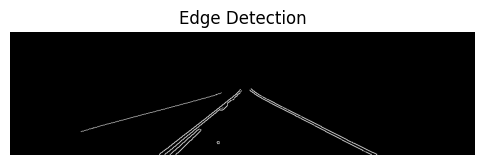

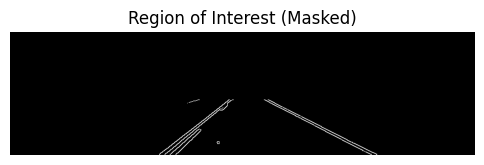

Processing Frame 144


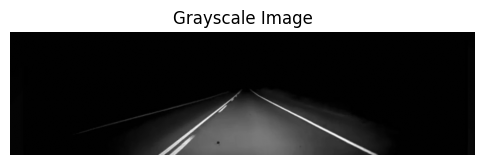

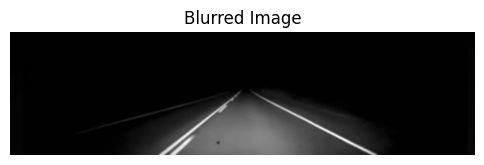

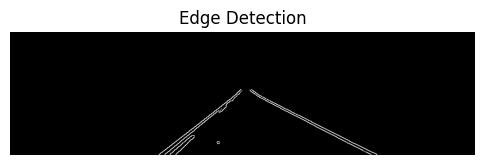

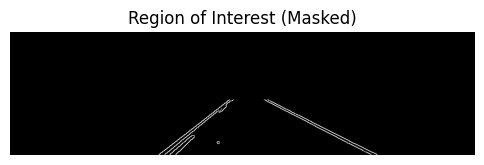

Processing Frame 145


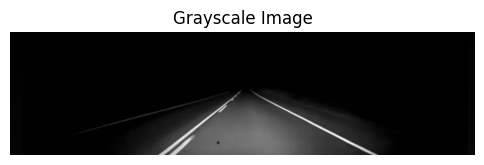

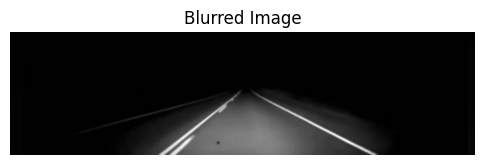

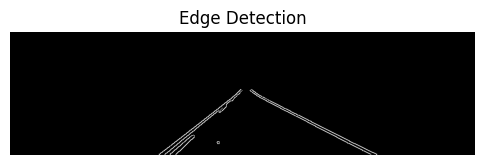

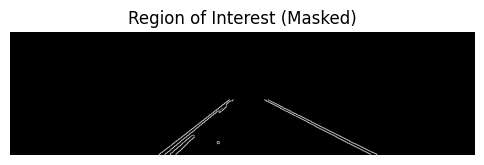

Processing Frame 146


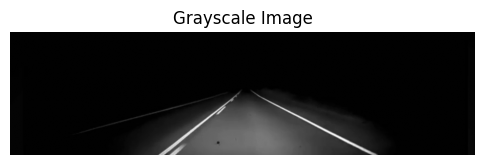

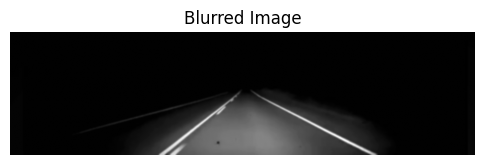

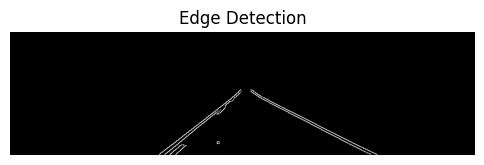

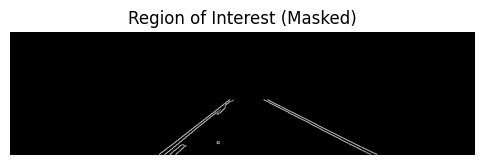

Processing Frame 147


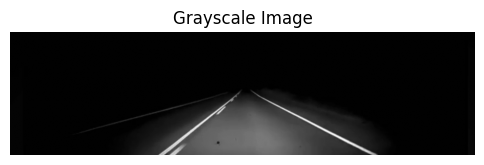

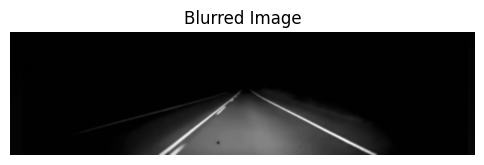

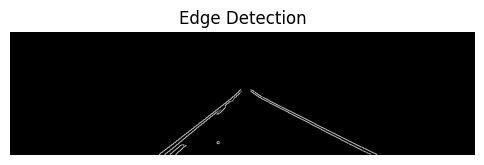

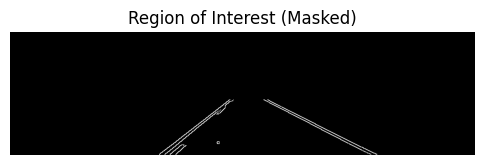

Processing Frame 148


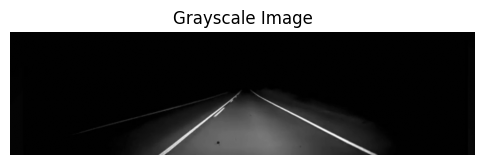

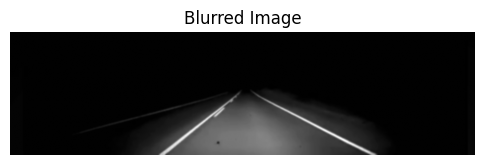

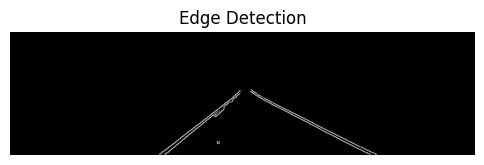

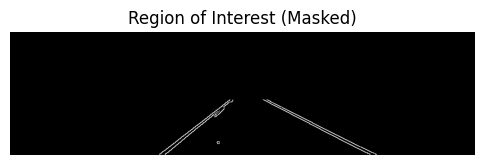

Processing Frame 149


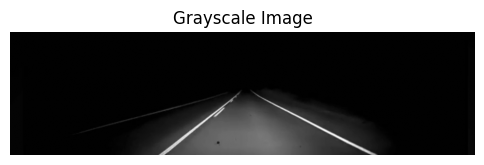

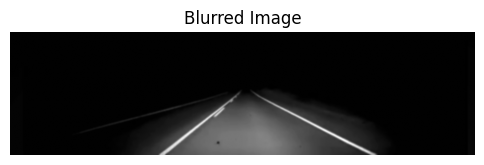

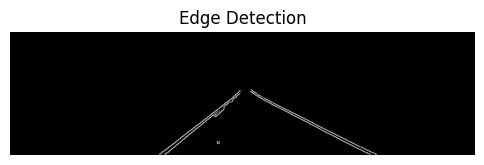

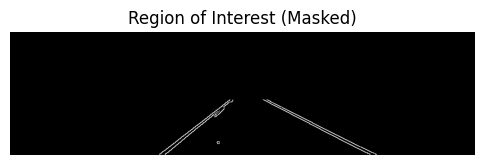

Processing Frame 150


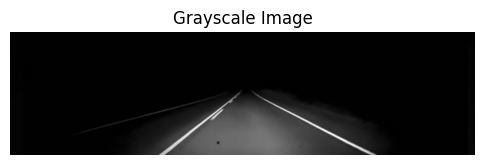

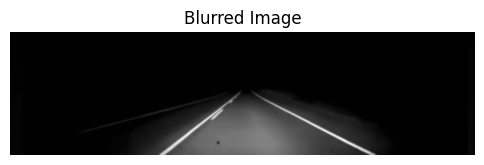

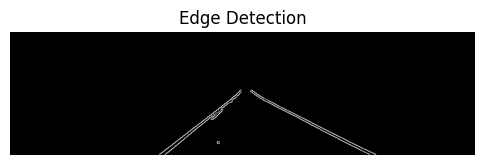

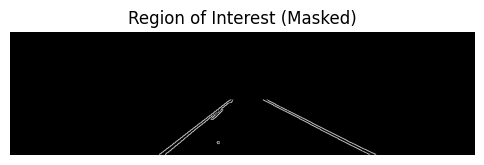

Processing Frame 151


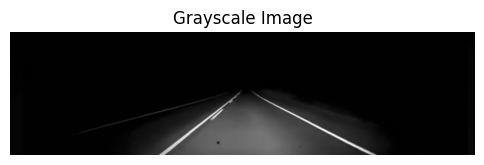

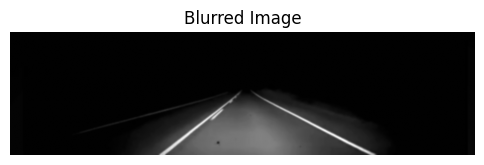

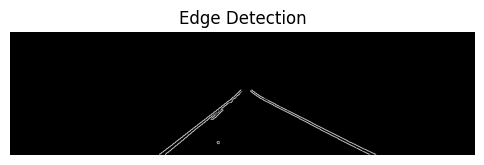

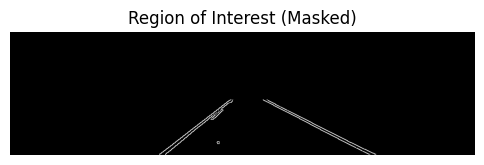

Processing Frame 152


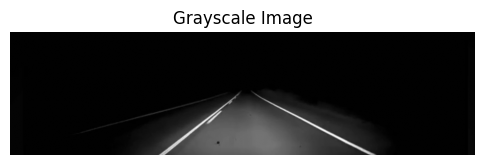

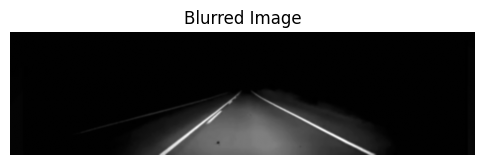

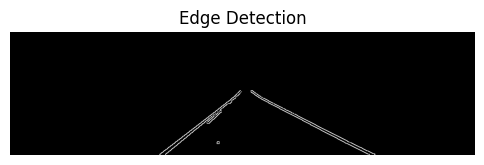

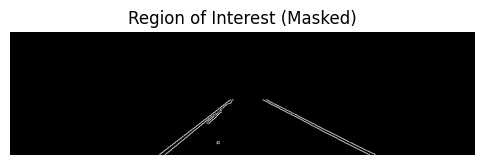

Processing Frame 153


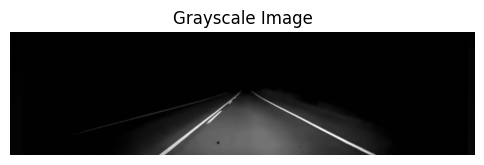

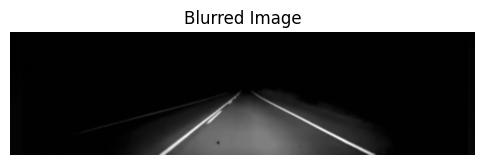

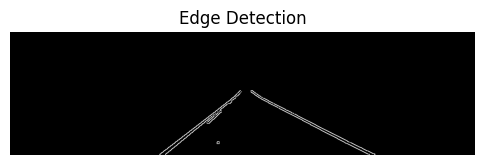

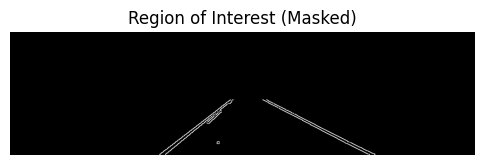

Processing Frame 154


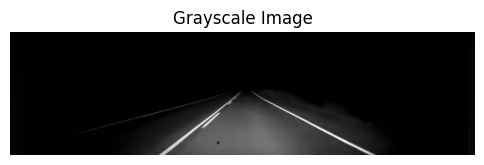

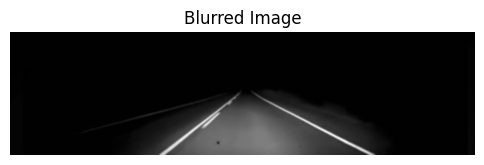

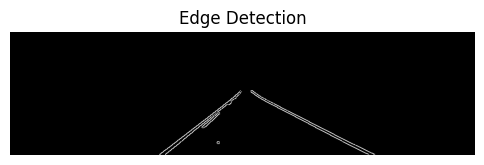

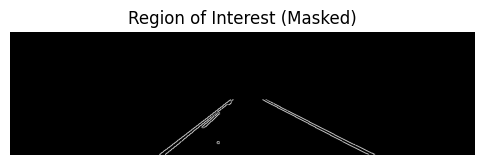

Processing Frame 155


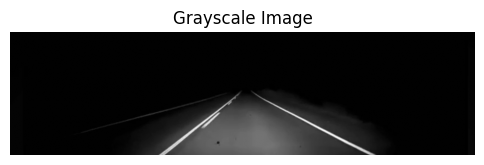

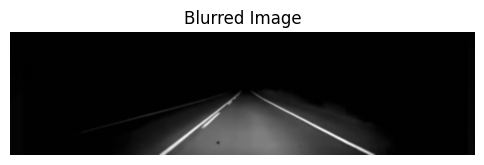

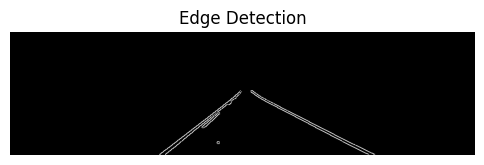

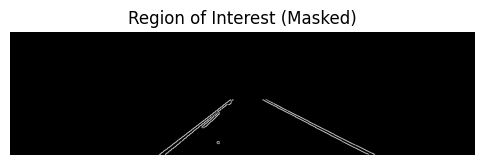

Processing Frame 156


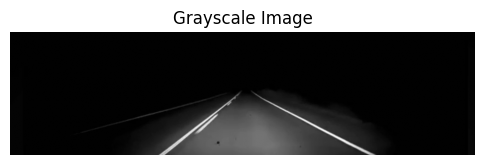

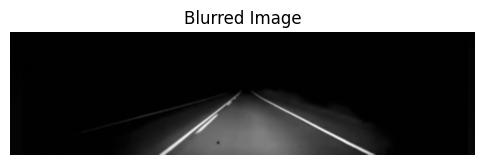

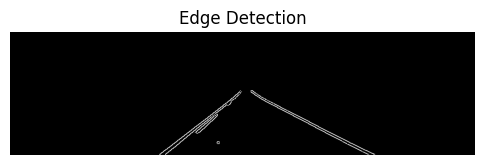

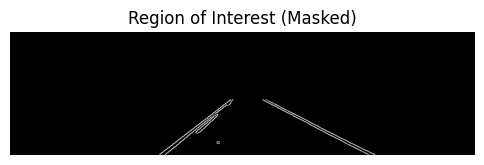

Processing Frame 157


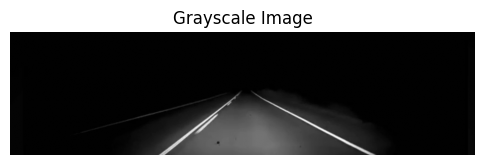

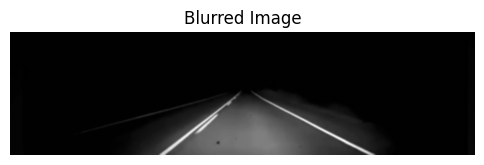

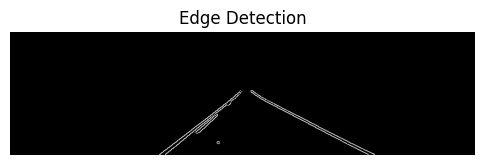

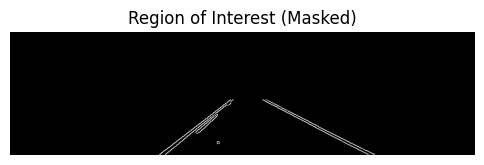

Processing Frame 158


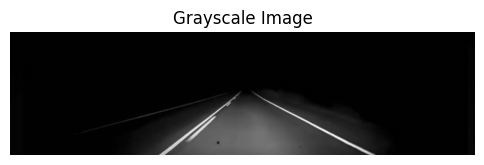

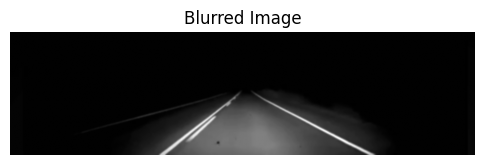

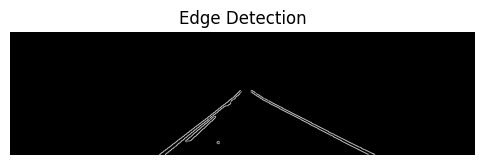

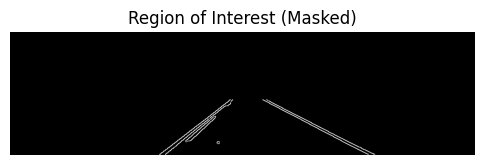

Processing Frame 159


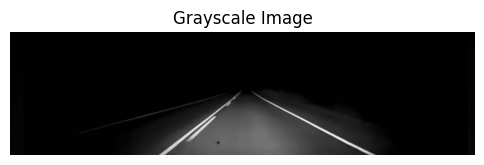

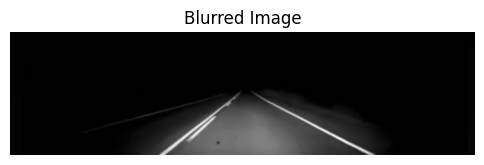

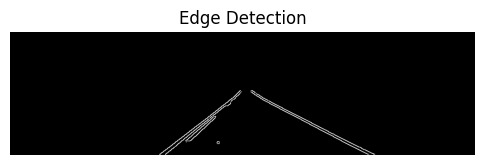

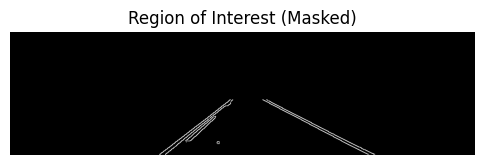

Processing Frame 160


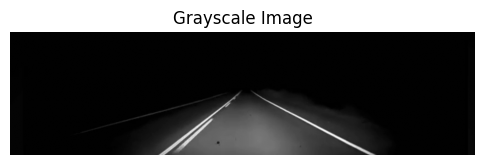

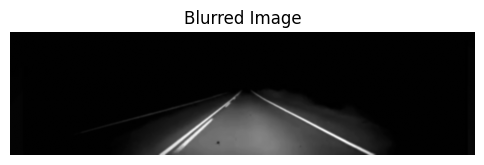

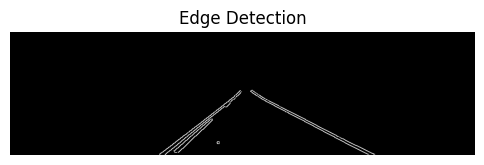

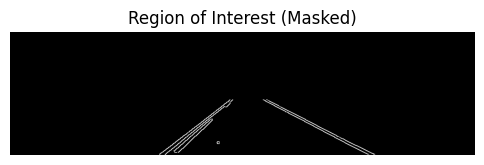

Processing Frame 161


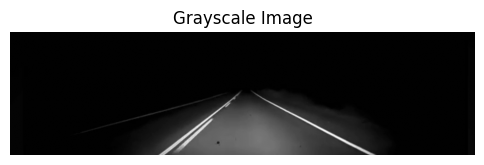

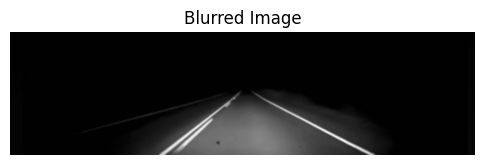

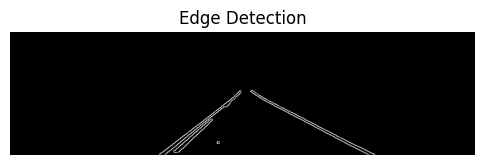

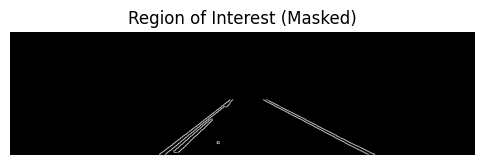

Processing Frame 162


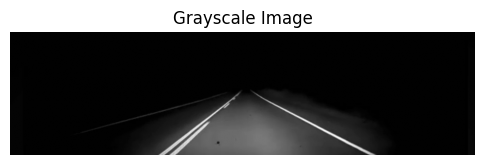

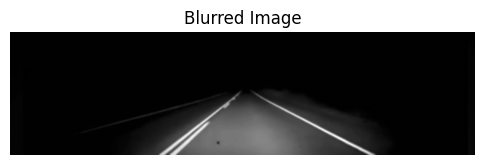

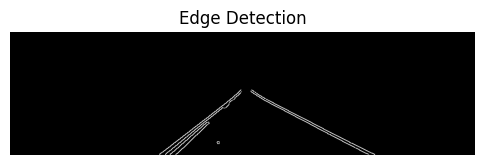

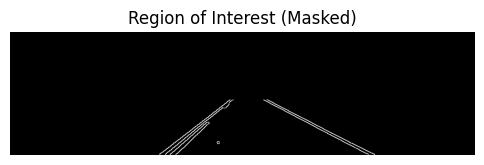

Processing Frame 163


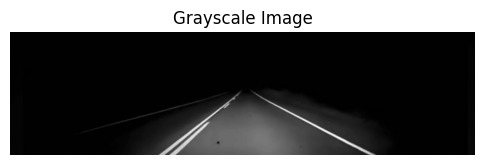

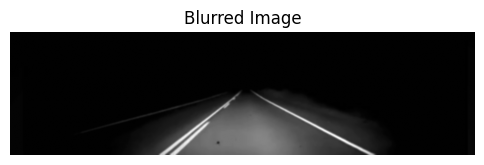

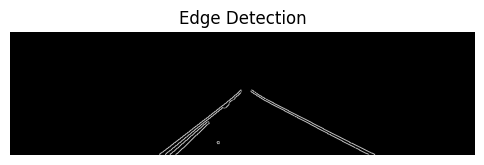

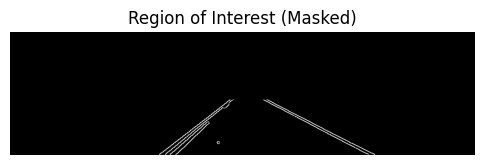

Processing Frame 164


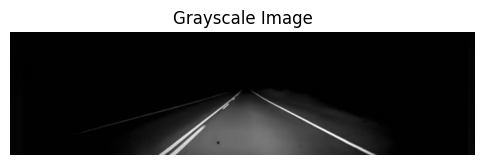

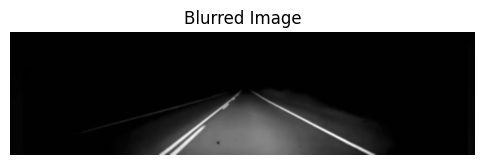

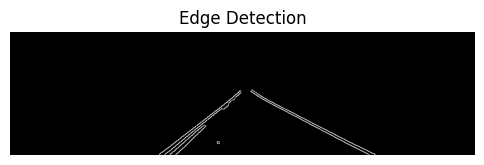

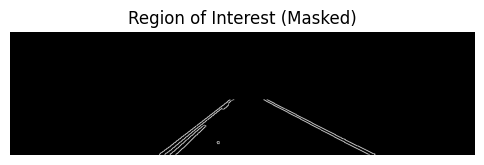

Processing Frame 165


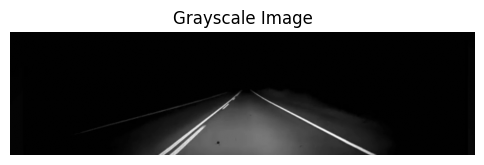

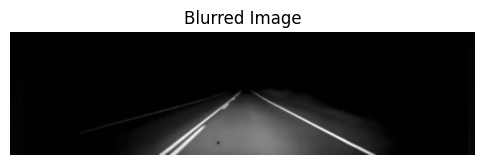

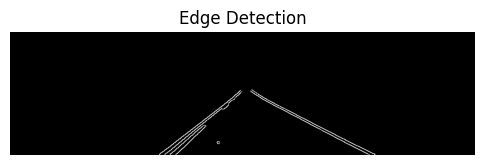

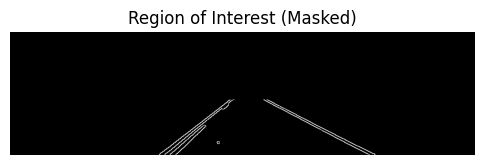

Processing Frame 166


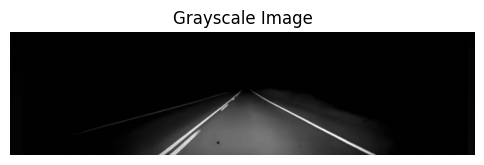

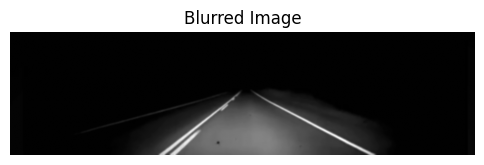

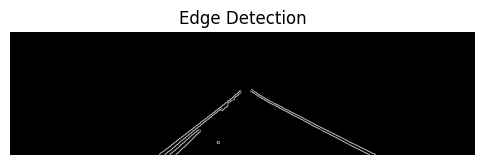

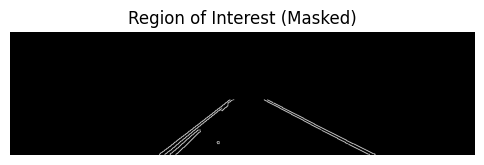

Processing Frame 167


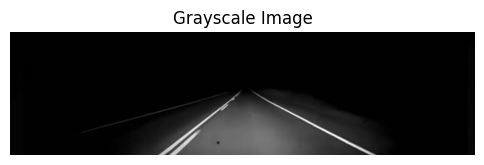

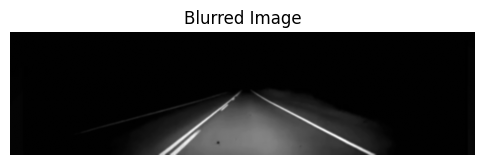

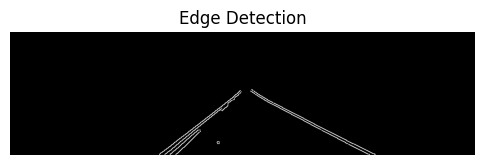

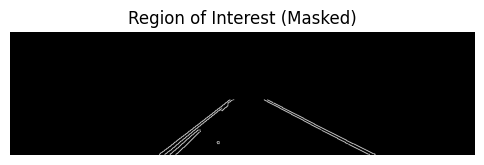

Processing Frame 168


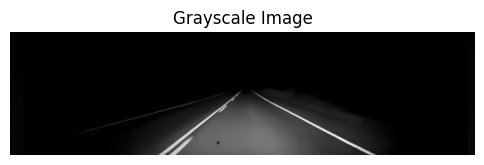

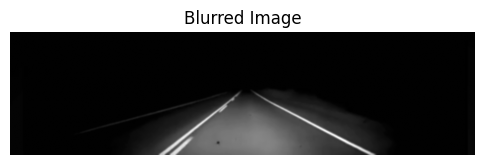

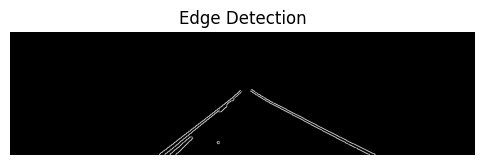

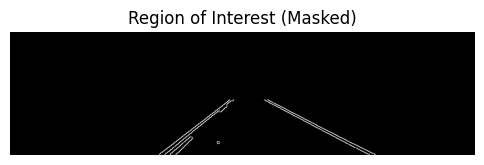

Processing Frame 169


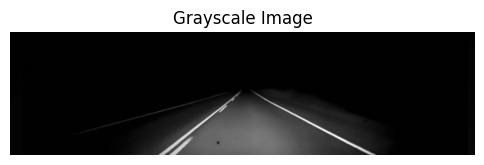

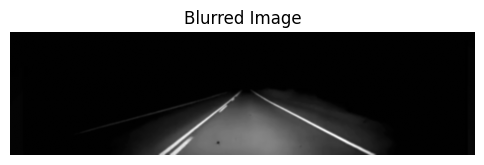

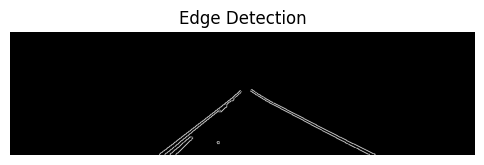

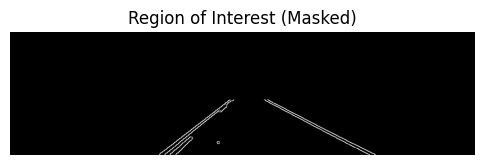

Processing Frame 170


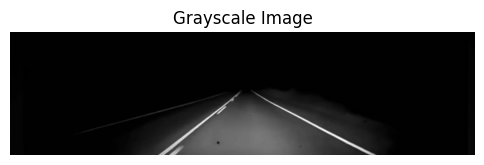

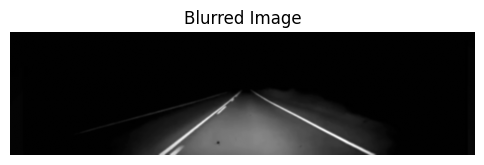

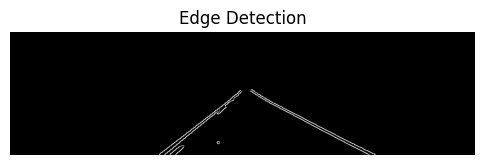

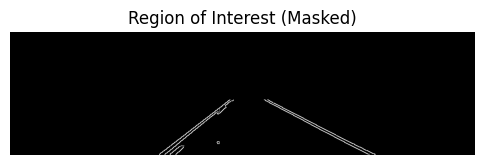

Processing Frame 171


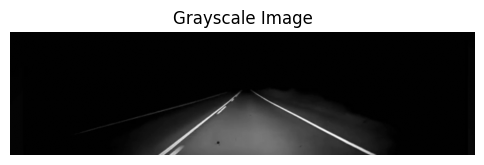

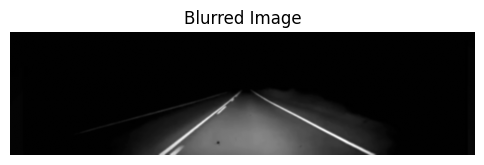

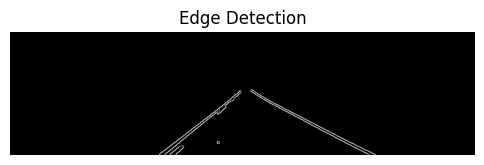

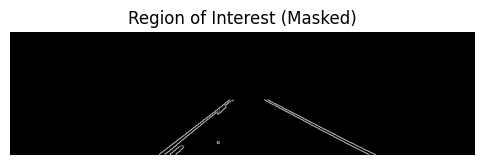

Processing Frame 172


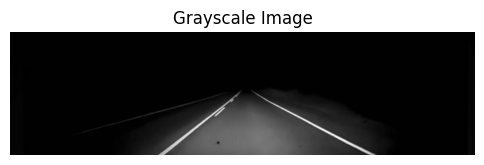

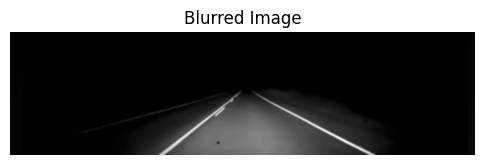

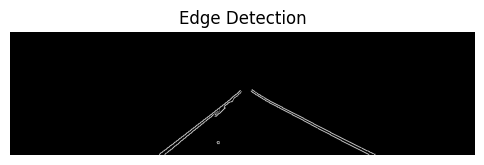

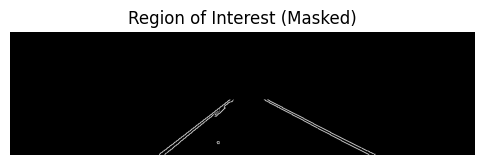

Processing Frame 173


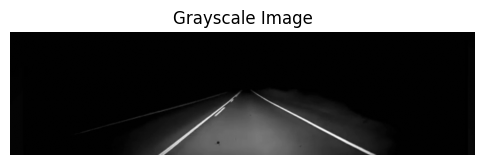

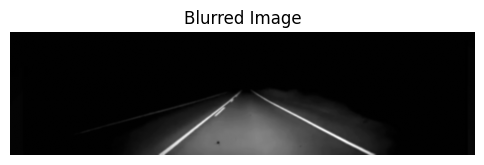

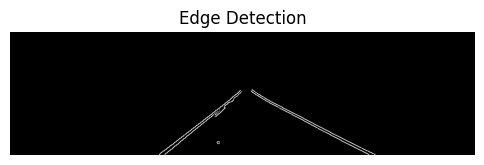

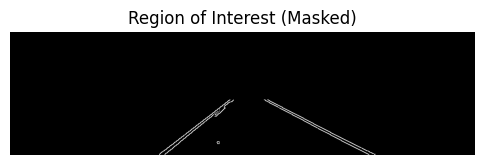

Processing Frame 174


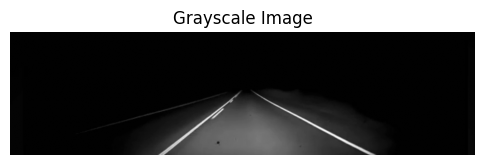

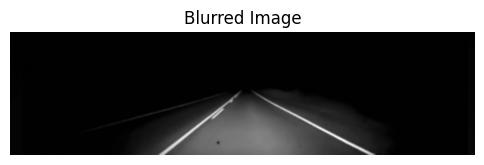

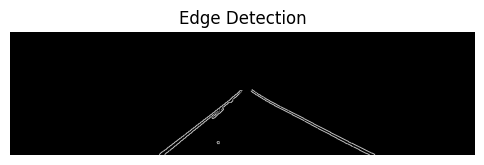

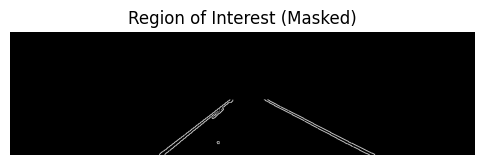

Processing Frame 175


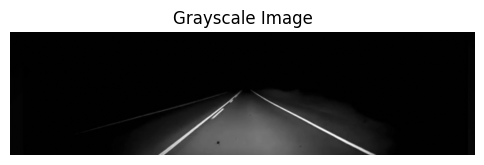

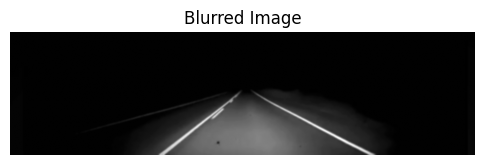

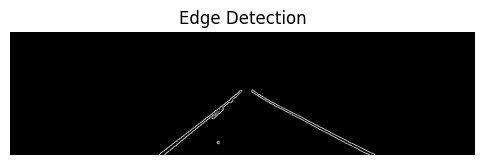

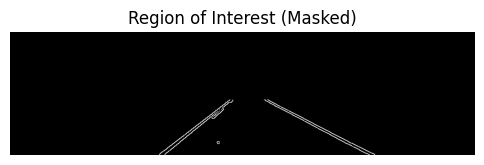

Processing Frame 176


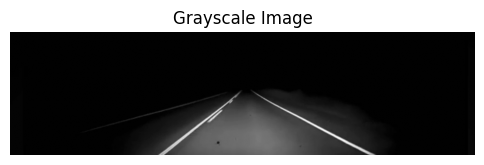

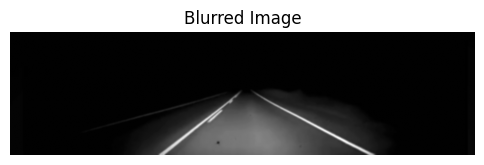

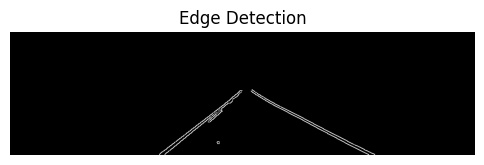

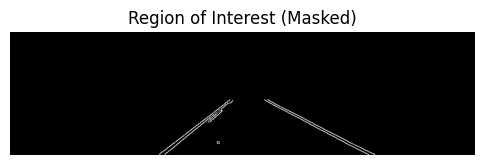

Processing Frame 177


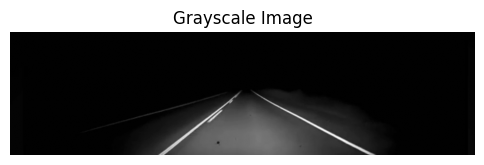

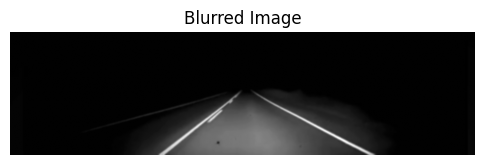

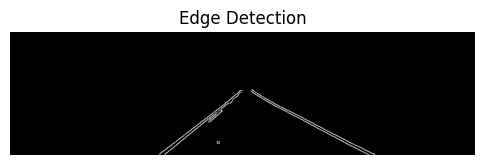

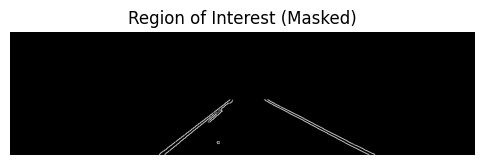

Processing Frame 178


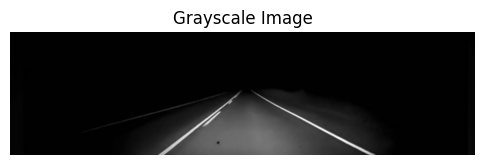

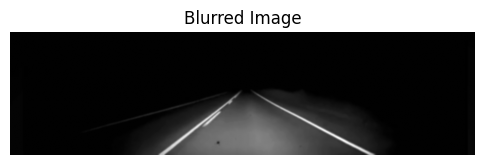

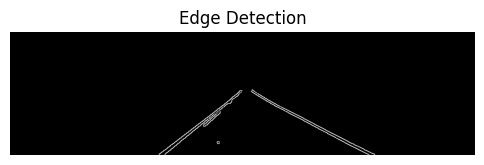

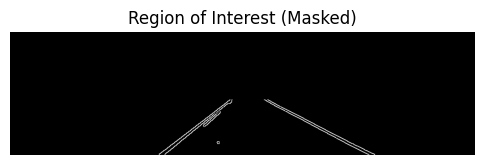

Processing Frame 179


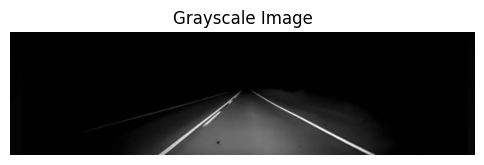

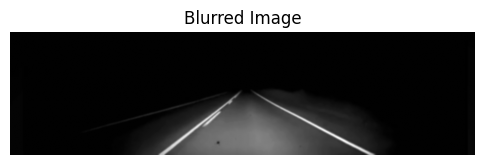

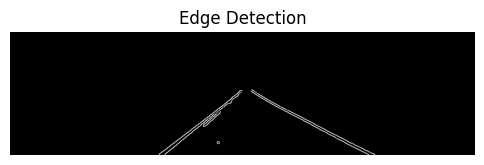

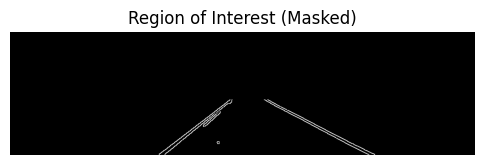

Processing Frame 180


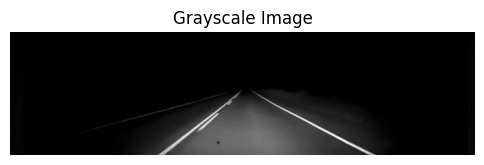

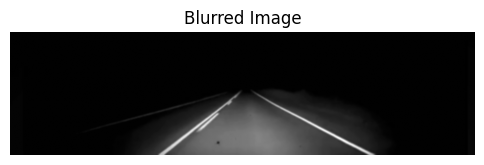

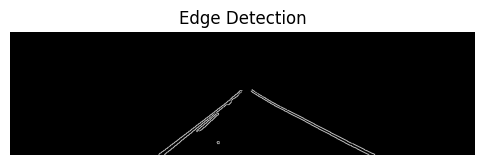

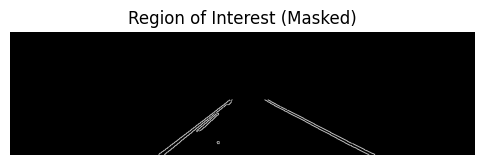

Processing Frame 181


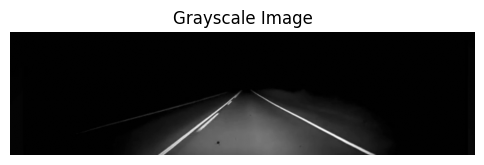

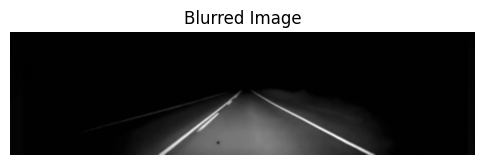

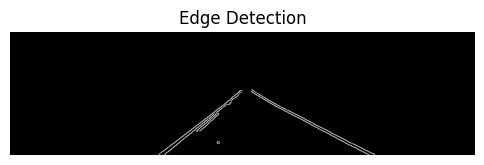

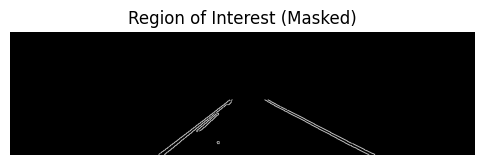

Processing Frame 182


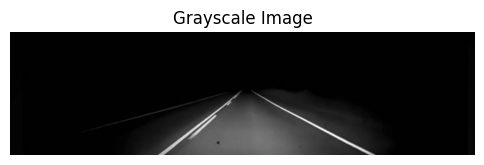

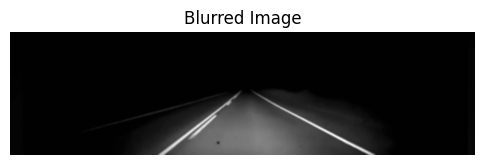

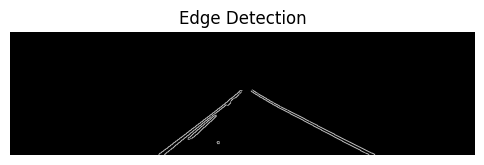

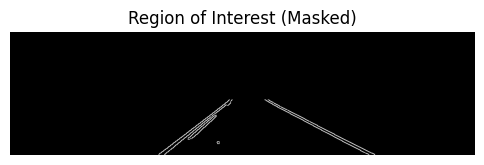

Processing Frame 183


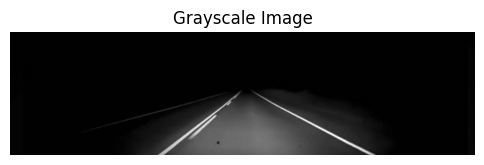

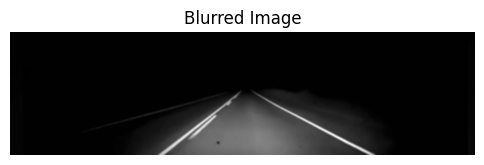

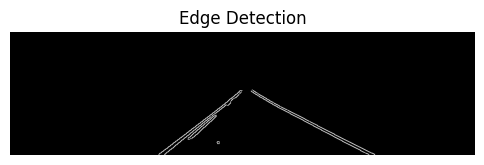

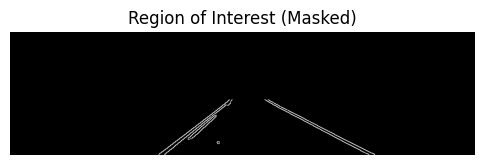

Processing Frame 184


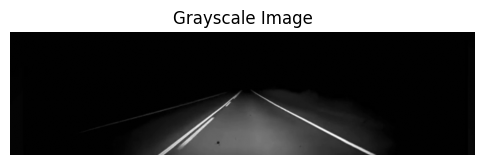

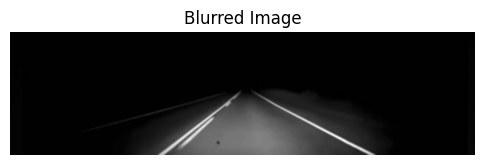

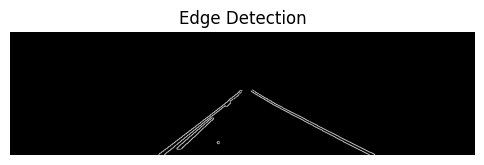

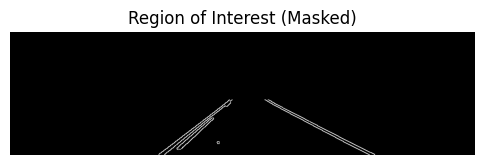

Processing Frame 185


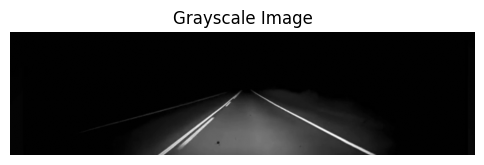

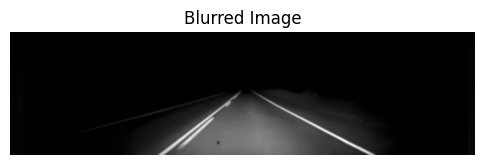

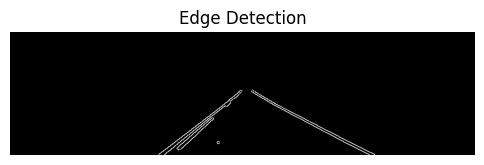

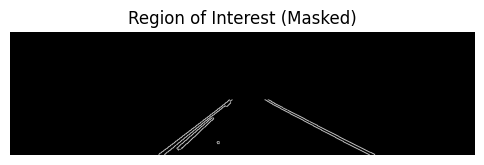

Processing Frame 186


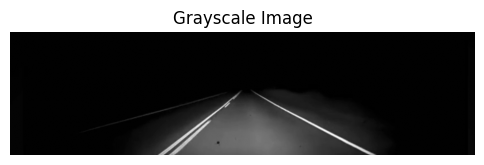

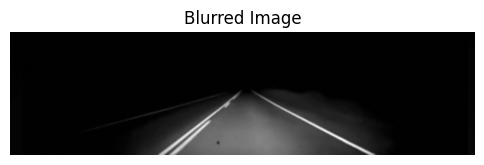

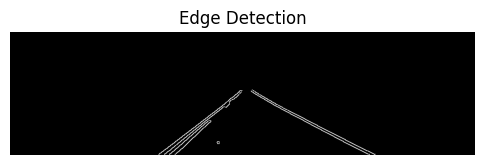

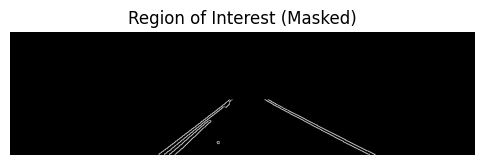

Processing Frame 187


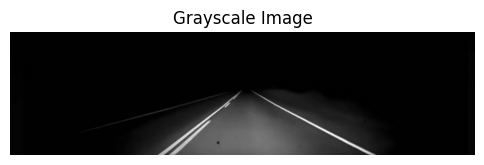

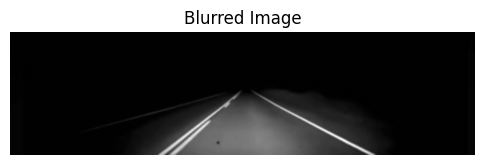

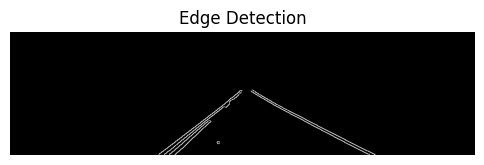

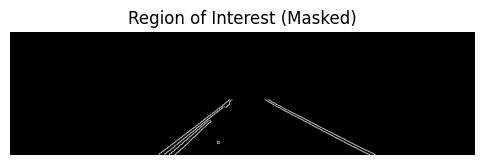

Processing Frame 188


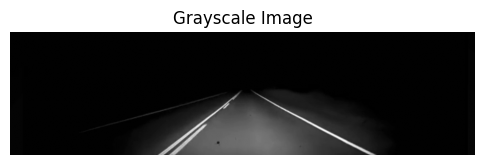

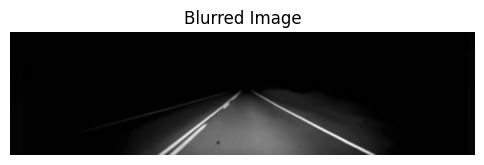

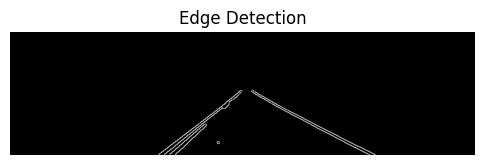

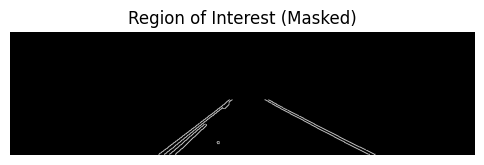

Processing Frame 189


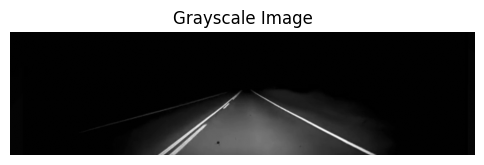

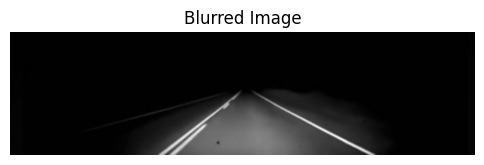

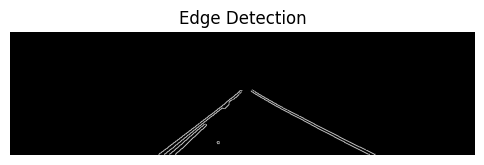

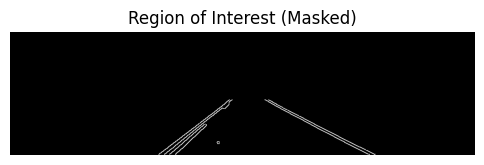

Processing Frame 190


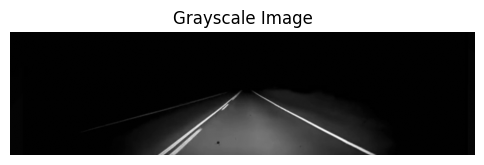

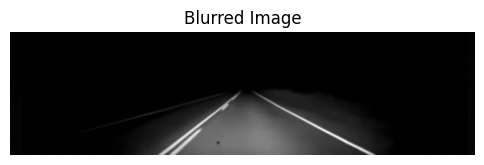

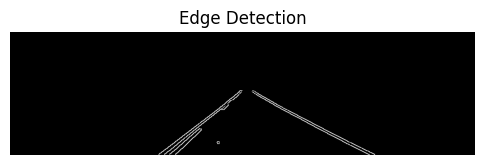

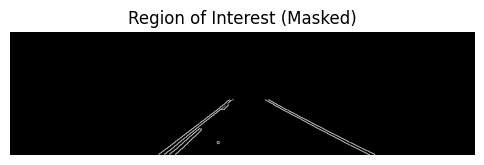

Processing Frame 191


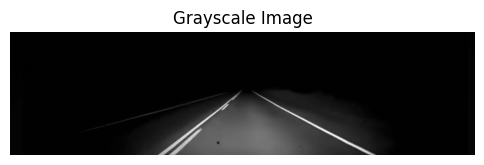

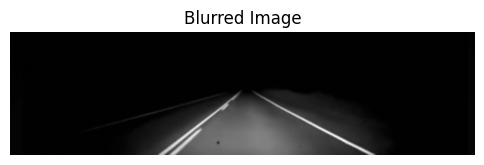

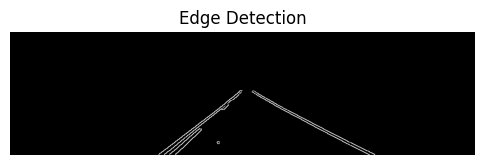

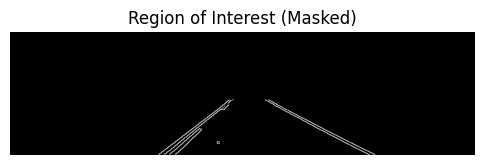

Processing Frame 192


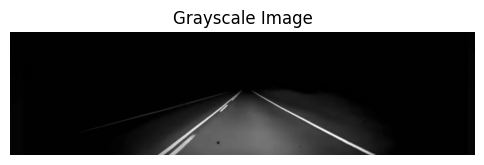

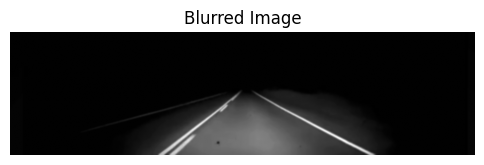

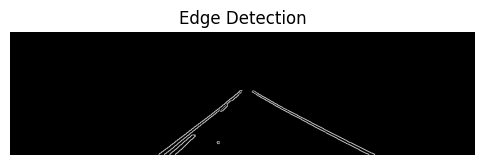

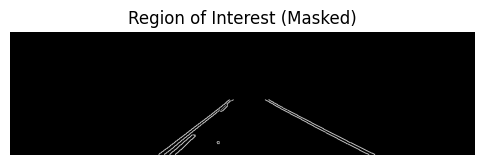

Processing Frame 193


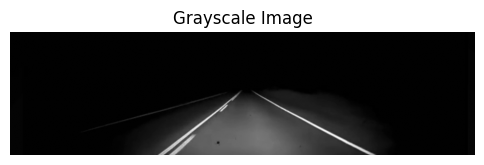

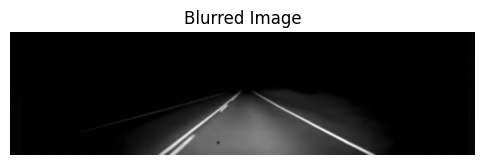

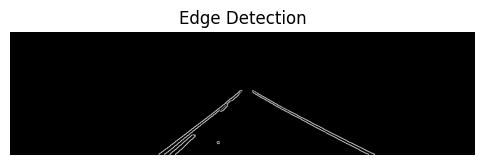

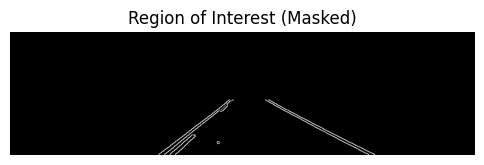

Processing Frame 194


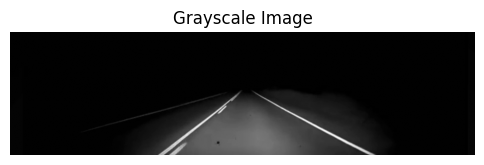

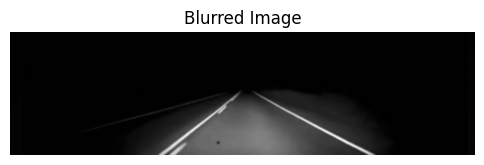

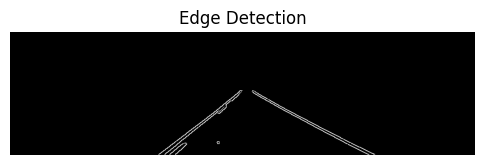

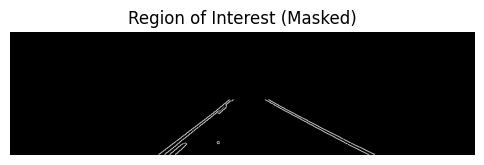

Processing Frame 195


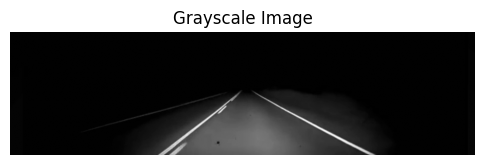

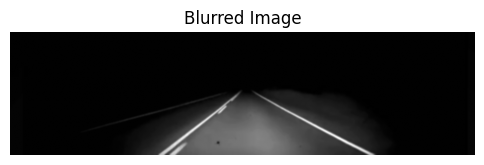

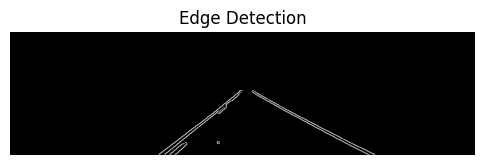

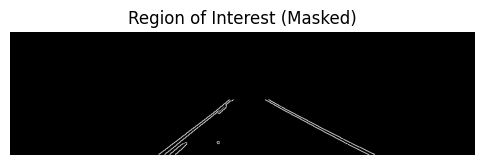

Processing Frame 196


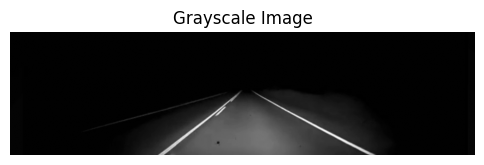

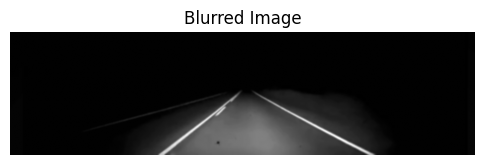

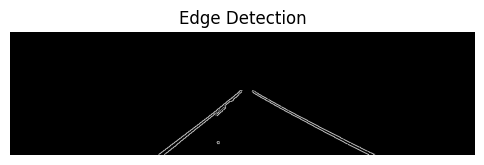

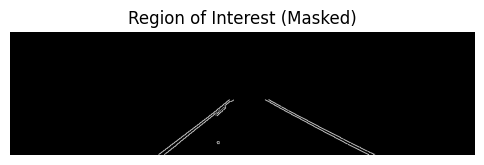

Processing Frame 197


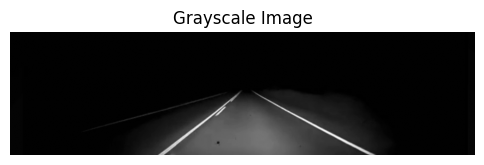

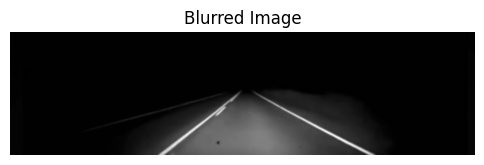

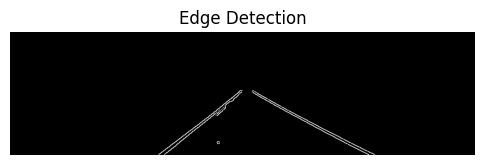

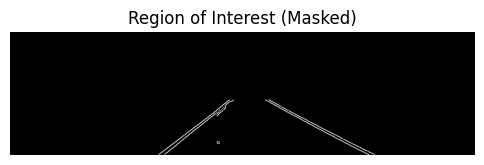

Processing Frame 198


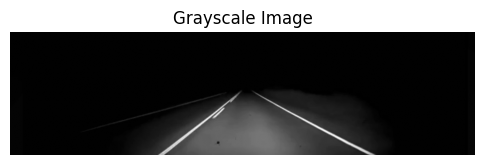

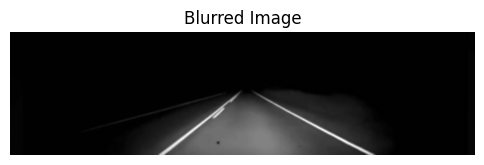

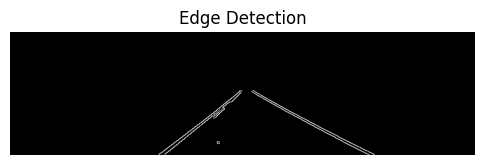

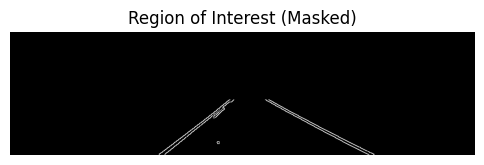

Processing Frame 199


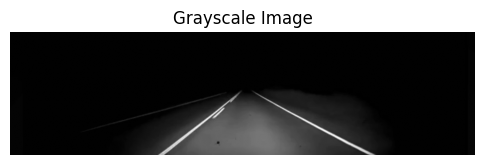

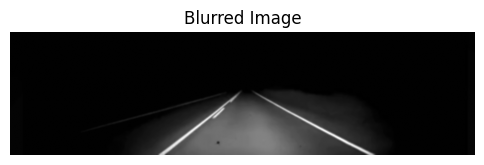

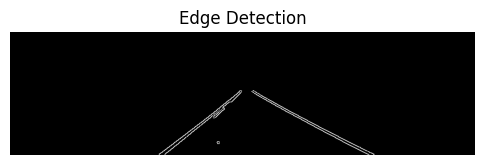

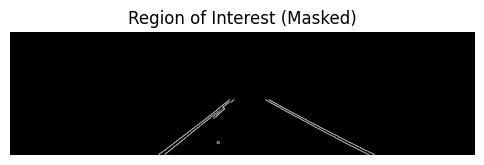

In [8]:
video_path = "lanes_clip20.mp4"
cap = cv2.VideoCapture(video_path)
frame_count = 0
output_frames = []

while cap.isOpened():
    ret, frame = cap.read()
    if not ret or frame_count >= 200:
        break

    print(f"Processing Frame {frame_count}")
    processed, score = hybrid_lane_detection(frame)
    output_frames.append(processed)

    cv2.imwrite(f"hybrid_lane_frame_{frame_count}.jpg", processed)
    frame_count += 1

cap.release()

In [9]:
out = cv2.VideoWriter("output_lanes.mp4", cv2.VideoWriter_fourcc(*"mp4v"), 20,
                      (output_frames[0].shape[1], output_frames[0].shape[0]))

for frame in output_frames:
    out.write(frame)

out.release()
print("Saved output_lanes.mp4")

Saved output_lanes.mp4


In [10]:
from google.colab import files
files.download("output_lanes.mp4")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [11]:
import numpy as np
import cv2

# Function to calculate accuracy
def calculate_accuracy(predicted_mask, ground_truth_mask):
    """Calculates pixel-wise accuracy."""
    predicted_mask_flat = predicted_mask.flatten()
    ground_truth_mask_flat = ground_truth_mask.flatten()

    correct_predictions = np.sum(predicted_mask_flat == ground_truth_mask_flat)
    total_pixels = len(ground_truth_mask_flat)

    accuracy = correct_predictions / total_pixels
    return accuracy

# Modified hybrid_lane_detection to include accuracy
def hybrid_lane_detection(frame, ground_truth_mask):
    # Process the frame as before
    original = frame.copy()
    # Assuming other lane detection steps here, e.g., using Hough transform

    # For simplicity, create a synthetic predicted mask for testing (simulate lanes)
    # In real use, this would come from the model's prediction output
    predicted_mask = np.zeros_like(frame, dtype=np.uint8)  # Dummy mask (all black)

    # Add some synthetic "lane" to the predicted mask for testing purposes (for the sake of example)
    predicted_mask[100:200, 300:400] = 255  # Add a white rectangle as a "lane" for testing

    # Convert the predicted mask to a binary mask (grayscale)
    predicted_mask = cv2.cvtColor(predicted_mask, cv2.COLOR_BGR2GRAY)
    predicted_mask = (predicted_mask > 127).astype(np.uint8) * 255

    # Ensure ground_truth_mask is binary (grayscale)
    ground_truth_mask = cv2.cvtColor(ground_truth_mask, cv2.COLOR_BGR2GRAY)
    ground_truth_mask = (ground_truth_mask > 127).astype(np.uint8) * 255

    # Calculate accuracy
    accuracy = calculate_accuracy(predicted_mask, ground_truth_mask)

    # Return processed frame and accuracy
    return original, accuracy

# video_path = "lanes_clip.mp4"
cap = cv2.VideoCapture(video_path)
frame_count = 0
output_frames = []

while cap.isOpened():
    ret, frame = cap.read()
    if not ret or frame_count >= 200:
        break

    print(f"Processing Frame {frame_count}")
    # Example ground truth mask (this should be updated with actual ground truth for each frame)
    ground_truth_mask = np.zeros_like(frame, dtype=np.uint8)  # Placeholder, should be updated with actual data

    # For testing, create synthetic lane in the ground truth (e.g., white rectangle)
    ground_truth_mask[100:200, 300:400] = 255  # Add a white rectangle as the "true lane" for testing

    processed, accuracy = hybrid_lane_detection(frame, ground_truth_mask)
    output_frames.append(processed)

    # Optionally, print out metrics for the current frame
    print(f"Frame {frame_count} - Accuracy: {accuracy:.4f}")

    # Save processed frame
    cv2.imwrite(f"hybrid_lane_frame_{frame_count}.jpg", processed)
    frame_count += 1

cap.release()

Processing Frame 0
Frame 0 - Accuracy: 1.0000
Processing Frame 1
Frame 1 - Accuracy: 1.0000
Processing Frame 2
Frame 2 - Accuracy: 1.0000
Processing Frame 3
Frame 3 - Accuracy: 1.0000
Processing Frame 4
Frame 4 - Accuracy: 1.0000
Processing Frame 5
Frame 5 - Accuracy: 1.0000
Processing Frame 6
Frame 6 - Accuracy: 1.0000
Processing Frame 7
Frame 7 - Accuracy: 1.0000
Processing Frame 8
Frame 8 - Accuracy: 1.0000
Processing Frame 9
Frame 9 - Accuracy: 1.0000
Processing Frame 10
Frame 10 - Accuracy: 1.0000
Processing Frame 11
Frame 11 - Accuracy: 1.0000
Processing Frame 12
Frame 12 - Accuracy: 1.0000
Processing Frame 13
Frame 13 - Accuracy: 1.0000
Processing Frame 14
Frame 14 - Accuracy: 1.0000
Processing Frame 15
Frame 15 - Accuracy: 1.0000
Processing Frame 16
Frame 16 - Accuracy: 1.0000
Processing Frame 17
Frame 17 - Accuracy: 1.0000
Processing Frame 18
Frame 18 - Accuracy: 1.0000
Processing Frame 19
Frame 19 - Accuracy: 1.0000
Processing Frame 20
Frame 20 - Accuracy: 1.0000
Processing F

In [12]:
import numpy as np
import cv2

# Function to calculate Dice Similarity Coefficient (DSC)
def calculate_dsc(predicted_mask, ground_truth_mask):
    """Calculates the Dice Similarity Coefficient (DSC)."""
    # Flatten the masks
    predicted_mask_flat = predicted_mask.flatten()
    ground_truth_mask_flat = ground_truth_mask.flatten()

    # True positives (intersection)
    intersection = np.sum((predicted_mask_flat == 255) & (ground_truth_mask_flat == 255))

    # Size of predicted mask and ground truth mask
    size_predicted = np.sum(predicted_mask_flat == 255)
    size_ground_truth = np.sum(ground_truth_mask_flat == 255)

    if size_predicted + size_ground_truth == 0:
        return 0  # Return 0 if no predicted or ground truth lanes

    dsc = (2 * intersection) / (size_predicted + size_ground_truth)
    return dsc

# Example usage
# Create synthetic ground truth and predicted masks for testing
predicted_mask = np.zeros((480, 640), dtype=np.uint8)  # Dummy predicted mask (all black)
predicted_mask[100:200, 300:400] = 255  # Add a white rectangle as a "lane" for testing

ground_truth_mask = np.zeros((480, 640), dtype=np.uint8)  # Dummy ground truth mask (all black)
ground_truth_mask[100:200, 300:400] = 255  # Add a white rectangle as the "true lane" for testing

# Calculate DSC
dsc = calculate_dsc(predicted_mask, ground_truth_mask)
print(f"Dice Similarity Coefficient (DSC): {dsc:.4f}")


Dice Similarity Coefficient (DSC): 1.0000


In [13]:
import numpy as np
import cv2
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score

def evaluate_segmentation(predicted_mask, ground_truth_mask):
    """Calculates F1 Score, Accuracy, Precision, and Recall for binary masks."""
    # Flatten and binarize
    predicted_flat = (predicted_mask.flatten() > 127).astype(np.uint8)
    ground_truth_flat = (ground_truth_mask.flatten() > 127).astype(np.uint8)

    f1 = f1_score(ground_truth_flat, predicted_flat)
    accuracy = accuracy_score(ground_truth_flat, predicted_flat)
    precision = precision_score(ground_truth_flat, predicted_flat, zero_division=0)
    recall = recall_score(ground_truth_flat, predicted_flat, zero_division=0)

    print(f"F1 Score:    {f1:.4f}")
    print(f"Accuracy:    {accuracy:.4f}")
    print(f"Precision:   {precision:.4f}")
    print(f"Recall:      {recall:.4f}")

    return f1, accuracy, precision, recall


predicted_mask = np.zeros((480, 640), dtype=np.uint8)
predicted_mask[100:200, 300:400] = 255

ground_truth_mask = np.zeros((480, 640), dtype=np.uint8)
ground_truth_mask[100:200, 300:400] = 255

# Evaluate
f1, acc, prec, rec = evaluate_segmentation(predicted_mask, ground_truth_mask)


F1 Score:    1.0000
Accuracy:    1.0000
Precision:   1.0000
Recall:      1.0000


In [14]:
from sklearn.metrics import confusion_matrix

def compute_confusion_matrix(predicted_mask, ground_truth_mask):
    """Returns the confusion matrix between predicted and ground truth binary masks."""
    # Flatten the masks
    predicted = predicted_mask.flatten()
    ground_truth = ground_truth_mask.flatten()

    # Ensure binary values (0 or 1)
    predicted = (predicted > 127).astype(np.uint8)
    ground_truth = (ground_truth > 127).astype(np.uint8)

    # Compute confusion matrix
    cm = confusion_matrix(ground_truth, predicted, labels=[1, 0])
    return cm


In [15]:
cm = compute_confusion_matrix(predicted_mask, ground_truth_mask)
print("Confusion Matrix:\n", cm)


Confusion Matrix:
 [[ 10000      0]
 [     0 297200]]


In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

def display_confusion_matrix(cm):
    plt.figure(figsize=(4, 3))
    sns.heatmap(cm, annot=True, fmt='d', cmap='YlGnBu', cbar=False,
                xticklabels=['Lane', 'Background'],
                yticklabels=['Lane', 'Background'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.show()




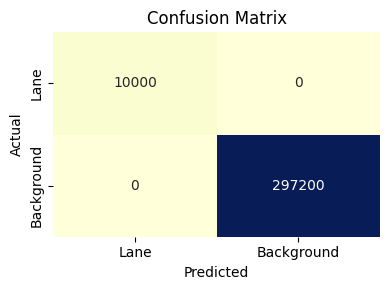

In [17]:
cm = compute_confusion_matrix(predicted_mask, ground_truth_mask)
display_confusion_matrix(cm)
